# Twitter Data Generation

## Import useful libraries and packages

In [2]:
import sys
import jsonpickle
import os
import tweepy
import nltk
import pandas as pd
import json
from pandas.io.json import json_normalize
from datetime import datetime, timezone
import numpy as np
import botometer
import re
import seaborn as sns
import matplotlib.pyplot as plt
import time

## Dataset descriptions

We constructed our dataset by combining bots and human users information from two datasets. One is the relatively new Cresci-2017 dataset, with 3474 human users and 7543 bots. Another is social honeypot dataset, containing 22,223 bots and 19,276 human users. Below is a detailed description of two datasets.

### 1. cresci-2017 dataset

Cresci-2017 dataset is consisted of (i) genuine, (ii) traditional, and (iii) social spambot Twitter accounts, annotated by CrowdFlower contributors.[1]

The genuine accounts dataset is a random sample of genuine (human-operated) accounts. They randomly contacted Twitter users by asking a simple question in natural language. All the replies to the questions were manually verified and all the 3,474 accounts that answered were certified as humans.

The traditional spambot dataset is composed of simplistic bots that repeatedly mention other users in tweets containing scam URLs or repeatedly tweet about open job positions and job offers.

The social spambot dataset is composed of bots identified during Mayoral election in Rome in 2014, bots which spent several months promoting the #TALNTS hashtag and bots which advertise products on sale on Amazon.com.

In [48]:
# Genuine users
gu_df = pd.read_csv('./cresci-2017.csv/datasets_full.csv/genuine_accounts.csv/users.csv', sep = ',')
gu_list = gu_df['id'].values.astype(int)

# Social spambots
ssbots1_df = pd.read_csv('./cresci-2017.csv/datasets_full.csv/social_spambots_1.csv/users.csv', sep = ',')
ssbots1_list = ssbots1_df['id'].values.astype(int)
ssbots2_df = pd.read_csv('./cresci-2017.csv/datasets_full.csv/social_spambots_2.csv/users.csv', sep = ',')
ssbots2_list = ssbots2_df['id'].values.astype(int)
ssbots3_df = pd.read_csv('./cresci-2017.csv/datasets_full.csv/social_spambots_3.csv/users.csv', sep = ',')
ssbots3_list = ssbots3_df['id'].values.astype(int)

# traditional spambots
tsbots1_df = pd.read_csv('./cresci-2017.csv/datasets_full.csv/traditional_spambots_1.csv/users.csv', sep = ',')
tsbots1_list = tsbots1_df['id'].values.astype(int)
tsbots2_df = pd.read_csv('./cresci-2017.csv/datasets_full.csv/traditional_spambots_2.csv/users.csv', sep = ',')
tsbots2_list = tsbots2_df['id'].values.astype(int)
tsbots3_df = pd.read_csv('./cresci-2017.csv/datasets_full.csv/traditional_spambots_3.csv/users.csv', sep = ',')
tsbots3_list = tsbots3_df['id'].values.astype(int)
tsbots4_df = pd.read_csv('./cresci-2017.csv/datasets_full.csv/traditional_spambots_4.csv/users.csv', sep = ',')
tsbots4_list = tsbots4_df['id'].values.astype(int)

# combine social spambots and traditional spambots
ssbots_list = list(ssbots1_list) + list(ssbots2_list) + list(ssbots3_list)
tsbots_list = list(tsbots1_list) + list(tsbots2_list) + list(tsbots3_list) + list(tsbots4_list)

### 2. Social Honeypot Dataset

Social Honeypot Dataset was first constructed in Lee et al.[2]. The authors identified bot users by posting random messages and engaging with 60 social honeypot accounts on Twitter. Once an account is lured and connected to the social honeypot account, the Observation system will get their information and keep track of their behaviors. By using Expectation Maximization algorithm, the content polluters are classified into four groups, including duplicate spammers, duplicate @ spammers, malicious promoters and friend infiltrators. In total, this dataset consists of 22,223 bots and 19,276 legitimate users. 

In [25]:
# Legitimate user info
lu_df = pd.read_csv('./social_honeypot_icwsm_2011/legitimate_users.txt', sep = '\t', header = None)
lu_df.columns = ['UserID', 'CreatedAt', 'CollectedAt', 'NumerOfFollowings', 'NumberOfFollowers', 'NumberOfTweets', 'LengthOfScreenName', 'LengthOfDescriptionInUserProfile']
lu_tweets_df = pd.read_csv('./social_honeypot_icwsm_2011/legitimate_users_tweets.txt', sep = '\t', header = None)
lu_tweets_df.columns = ['UserID', 'TweetID', 'Tweet', 'CreatedAt']
lu_follow_df = pd.read_csv('./social_honeypot_icwsm_2011/legitimate_users_followings.txt', sep = '\t', header = None)
lu_follow_df.columns = ['UserID', 'SeriesOfNumberOfFollowings']

# Content polluters info
bots_df = pd.read_csv('./social_honeypot_icwsm_2011/content_polluters.txt', sep = '\t', header = None)
bots_df.columns = ['UserID', 'CreatedAt', 'CollectedAt', 'NumerOfFollowings', 'NumberOfFollowers', 'NumberOfTweets', 'LengthOfScreenName', 'LengthOfDescriptionInUserProfile']
bots_tweets_df = pd.read_csv('./social_honeypot_icwsm_2011/content_polluters_tweets.txt', sep = '\t', header = None)
bots_tweets_df.columns = ['UserID', 'TweetID', 'Tweet', 'CreatedAt']
bots_follow_df = pd.read_csv('./social_honeypot_icwsm_2011/content_polluters_followings.txt', sep = '\t', header = None)
bots_follow_df.columns = ['UserID', 'SeriesOfNumberOfFollowings']

# Construct user id lists
lu_list = lu_df['UserID'].values.astype(int)
bot_list = bots_df['UserID'].values.astype(int)

## Scrape data from Tweepy API

To access the data, we used tweepy, an open-source library which provides access to the Twitter API for Python. Tweepy accesses Twitter via OAuth, requiring creation of a Twitter Developer Account and the generation of consumer keys and access tokens on Twitter developer platform. 

### 1. Access token to tweepy API

In [ ]:
auth = tweepy.OAuthHandler('pr0AH7Ot5sZmig4u3bA6j51ty', 'tNteF0tRlEjKJfkkWQaIv5myqT9oBqrIVOYPQJOMjBTJhn9SAF')

auth.set_access_token('934846563825930241-yO5rosUB4x8eFMO0J7IXV1UZM0RzbgL', 'CbqfvlRonXo2JiIyxqCqeZynwkslNcDPmGFQ9KBEh8Mch')

api = tweepy.API(auth)

### 2. Scrape the data through Tweepy API

In [23]:
# Given a name list and number of tweets needed to extract for each account
# Return a dictionary of dataframes
# Each dataframe contains info of one user
def API_scrap(name_list, count_num):
    fail_lst = []
    user_dfs = {}
    for name in name_list:
        try:
            status_a = api.user_timeline(name, count = count_num, tweet_mode = 'extended')
            user_dfs[name] = pd.DataFrame()
            for i in range(len(status_a)):
                json_str = json.dumps(status_a[i]._json)
                jdata = json_normalize(json.loads(json_str))
                user_dfs[name] = user_dfs[name].append(jdata, ignore_index=True)

        except:
            fail_lst.append(name)
            continue
    
    return user_dfs, fail_lst

gu_dfs, fail_lst = API_scrap(gu_list, 10)
ssbots_dfs, ssbots_fail_lst = API_scrap(ssbots_list, 10)
tsbots_dfs, tsbots_fail_lst = API_scrap(tsbots_list, 10)
sh_user_dfs, sh_fail_lst = API_scrap(lu_list, 10)
sh_bot_dfs, sh_bot_fail_lst = API_scrap(bot_list, 10)

## Feature Engineering

### 1. User meta-data features

From the scraped data we got from Twitter API, the returned user object contains a lot of useful informations that could be related to bot detection. Among those user-related features we extracted, there are three groups of them that could potentially differ between bots and human users.

First, bots love anonymity. There are several features related to the account settings which bots won't bother to change. Also instead of creating an attractive and meaningful screen name/user name, bots tend to use some lengthy, random names. To capture this behavior, we extracted features including default profile, default pictures and number of unique profile descriptions, screen name length, user name length, number of digits in screen name. 

Second, bots post a lot but don't have a strong preference on other people's opinions. Bots are tireless and active all the time, busy retweeting . This is why the number of tweets(per hour and total), time between each tweet and number of favorites are interesting features to look at. 

Third, bots are unwelcomed naughty "kids". Bot accounts tend to recently created, with a few friends, since they don't interact with other users that often. But it might have a large number of followers due to their activity. Considering this, we included featurs like the account age, number of followers and number of friends.

In [ ]:
# User ID
def user_id(df):
    try:
        return df['user.id_str'][0]
    except:
        return None
    
# Screen name length
def sname_len(df):
    try:
        return len(df['user.screen_name'][0])
    except:
        return None

# Number of digits in screen name
def sname_digits(df):
    try:
        return sum(c.isdigit() for c in df['user.screen_name'][0])
    except:
        return None
    
# User name length
def name_len(df):
    try: 
        return len(df['user.name'][0])
    except:
        return None

# Default profile
def def_profile(df):
    try:
        return int(df['user.default_profile'][0]*1)
    except:
        return None

# Default picture
def def_picture(df):
    try:
        return int(df['user.default_profile_image'][0]*1)
    except:
        return None

# Account age (in days)
def acc_age(df):
    try:
        d0 = datetime.strptime(df['user.created_at'][0],'%a %b %d %H:%M:%S %z %Y')
        d1 = datetime.now(timezone.utc)
        return (d1-d0).days
    except:
        return None

# Number of unique profile descriptions
def num_descrip(df):
    try:
        string = df['user.description'][0]
        return len(re.sub(r'\s', '', string).split(','))
    except:
        return None

# Number of friends
def friends(df):
    try:
        return df['user.friends_count'][0]
    except: 
        return None

# Number of followers
def followers(df):
    try:
        return df['user.followers_count'][0]
    except: 
        return None

# Number of favorites
def favorites(df):
    try:
        return df['user.favourites_count'][0]
    except:
        return None

# Number of tweets (including retweets, per hour and total)
def num_tweets(df):
    try:
        total = df['user.statuses_count'][0]
        per_hour = total/(acc_age(df)*24)
        return total, per_hour
    except:
        return None, None

def tweets_time(df):
    try:
        time_lst = []
        for i in range(len(df)-1):
            if df['retweeted'][i] == False:
                time_lst.append(df['created_at'][i])

        interval_lst = []
        for j in range(len(time_lst)-1):
            d1 = datetime.strptime(df['created_at'][j],'%a %b %d %H:%M:%S %z %Y')
            d2 = datetime.strptime(df['created_at'][j+1],'%a %b %d %H:%M:%S %z %Y')
            interval_lst.append((d2-d1).seconds)

        return np.array(interval_lst)
    except:
        return None

In [27]:
# Given a dictionary of dataframes with one dataframe for each user
# this function processes the data and extracted all the user-related features
# and saves it to a dataframe with one row for each user

def create_df(user_dfs, filename):
    columns_lst = ['User ID', 'Screen name length', 'Number of digits in screen name', 'User name length', 'Default profile (binary)','Default picture (binary)','Account age (days)', 'Number of unique profile descriptions','Number of friends','Number of followers','Number of favorites','Number of tweets per hour', 'Number of tweets total','timing_tweet']

    # Create user dataframe
    user_full_df = pd.DataFrame(columns = columns_lst)
    count = 0
    for name in user_dfs.keys():
        df = user_dfs[name]
        tweets_total, tweets_per_hour = num_tweets(df)
        data = [user_id(df), sname_len(df), sname_digits(df), name_len(df), def_profile(df), def_picture(df), acc_age(df), num_descrip(df), friends(df), followers(df), favorites(df), tweets_per_hour, tweets_total, np.mean(tweets_time(df))]
        user_full_df.loc[count] = data
        count += 1

    user_full_df = user_full_df.dropna()
    user_full_df.to_csv(filename+'.csv', encoding='utf-8', index=False)
    return user_full_df

gu_full_df = create_df(gu_dfs, 'gu_dataframe')
ssbots_full_df = create_df(ssbots_dfs, 'ssbots_dataframe')
tsbots_full_df = create_df(tsbots_dfs, 'tsbots_dataframe')
combined_bot_df = pd.concat([ssbots_full_df, tsbots_full_df], axis=0, sort=False)
sh_user_full_df = create_df(sh_user_dfs, 'sh_user_dataframe')
sh_bots_full_df = create_df(sh_bot_dfs, 'sh_bot_dataframe')

In [3]:
bot_df_final = pd.read_csv('bot_df_final.csv')
bot_df_final.head()

,User ID,Screen name length,Number of digits in screen name,User name length,Default profile (binary),Default picture (binary),Account age (days),Number of unique profile descriptions,Number of friends,Number of followers,Number of favorites,Number of tweets per hour,Number of tweets total,timing_tweet
0,24858289,9,2,6,1,0,3550,1,58,34,23,0.173451,14778,80373.750
1,33212890,12,0,14,0,0,3517,5,4306,34535,56190,0.417259,35220,72457.875
2,39773427,10,2,15,0,0,3493,1,723,527,50,0.307365,25767,71798.125
3,57007623,14,0,18,0,0,3430,1,401,464,38,0.103790,8544,60956.875
4,96435556,10,0,7,0,0,3279,1,673,387,1773,0.679793,53497,84675.750


### 2. NLP related features

### Reference

[1] Cresci, S., Di Pietro, R., Petrocchi, M., Spognardi, A., & Tesconi, M. (2017, April). The paradigm-shift of social spambots: Evidence, theories, and tools for the arms race. In Proceedings of the 26th International Conference on World Wide Web Companion (pp. 963-972). International World Wide Web Conferences Steering Committee.

[2] Lee, K., Eoff, B. D., & Caverlee, J. (2011, July). Seven Months with the Devils: A Long-Term Study of Content Polluters on Twitter. In ICWSM (pp. 185-192).


## Explorative Data Analysis

### Import libraries and processed data

In [1]:
import seaborn as sns
import matplotlib.pyplot as plt
import matplotlib
import numpy as np
import pandas as pd
from sklearn.model_selection import train_test_split
import warnings
warnings.filterwarnings('ignore')

In [2]:
bot_df = pd.read_csv(r"bot_df_final.csv",index_col='User ID')
user_df = pd.read_csv(r"user_df_final.csv",index_col='User ID')

bot_df['bot']=1
user_df['bot']=0

total_df = bot_df.append(user_df)

train_data, test_data = train_test_split(total_df, test_size = 0.3, random_state=99)

Y_train=train_data['bot']
Y_test=test_data['bot']
X_train=train_data.drop('bot',axis=1)
X_test=test_data.drop('bot',axis=1)

def normalize(df,df_train):
    result = df.copy()
    for feature_name in df_train.columns:
        max_value = df_train[feature_name].max()
        min_value = df_train[feature_name].min()
        result[feature_name] = (df[feature_name] - min_value) / (max_value - min_value)
    return result

X_train_scaled=normalize(X_train,X_train)
X_test_scaled=normalize(X_test,X_train)

### User feature statisitcs

We compared distribution of the user features for bots and human users. Although we expected some features to differ, some of the actual distributions might not be easily distinguished between bots and human users, such as number of digits in the screen name and number of unique descriptions. Some of them are easier to differ, such as number of friends, number of followers, number of favorites and number of tweets, indicating that those features might play an important role in the bot detection.

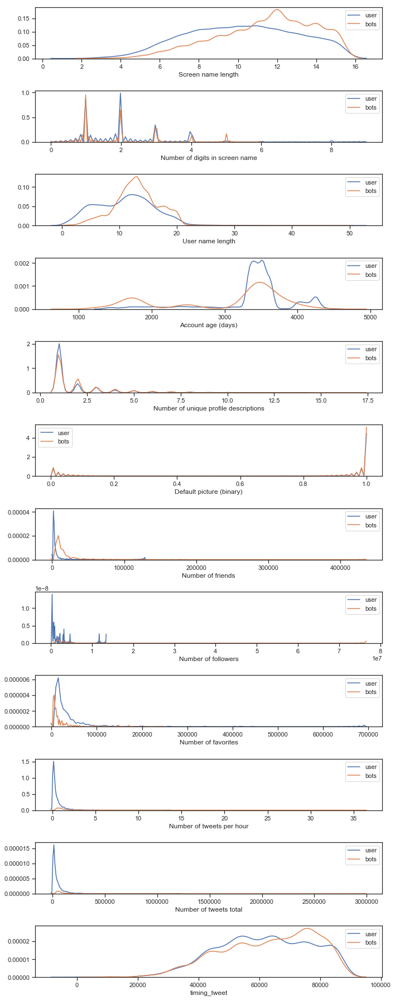

In [9]:
features = ['Screen name length', 'Number of digits in screen name', 'User name length', 'Account age (days)', 'Number of unique profile descriptions','Default picture (binary)','Number of friends','Number of followers','Number of favorites','Number of tweets per hour', 'Number of tweets total','timing_tweet']
fig, axes = plt.subplots(len(features),1, figsize = (10,25))
for i in range(len(features)):
    sns.kdeplot(user_df[features[i]], ax = axes[i], label = 'user')
    sns.kdeplot(bot_df[features[i]], ax = axes[i], label = 'bots')
    axes[i].set_xlabel(features[i])
    axes[i].legend()

plt.tight_layout()
plt.show()

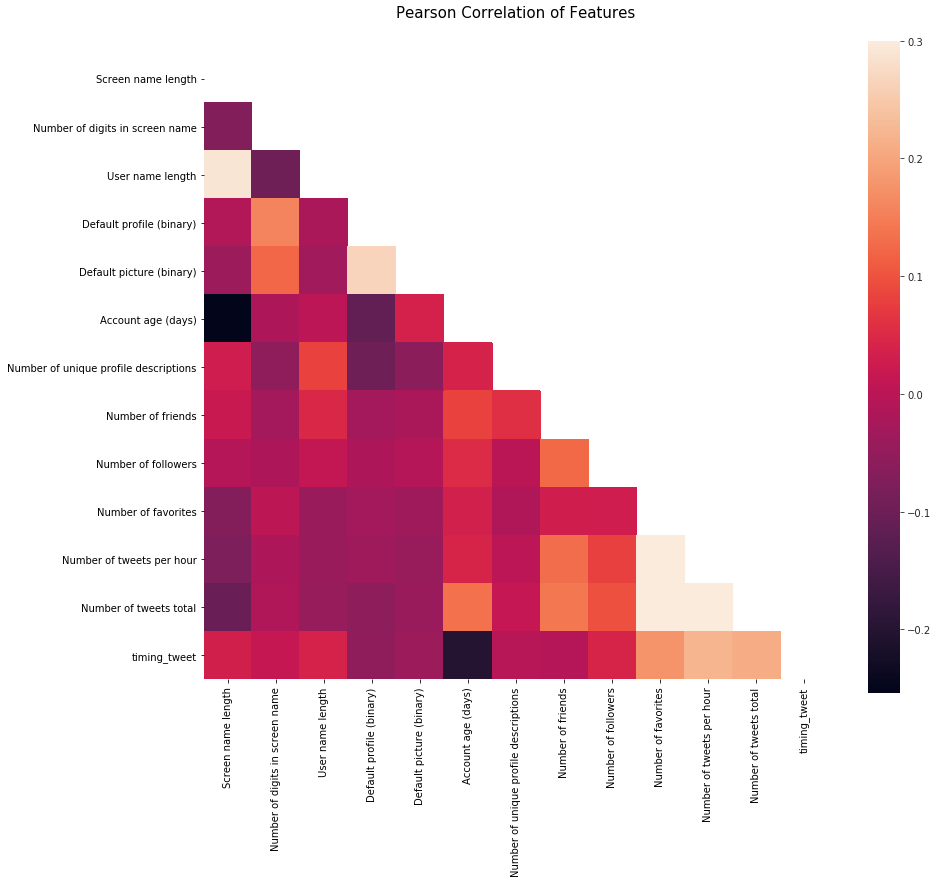

In [4]:
colormap = plt.cm.RdBu
plt.figure(figsize=(14,12))
plt.title('Pearson Correlation of Features', y=1.05, size=15)

# Generate a mask for the upper triangle
corr = X_train_scaled.astype(float).corr()
mask = np.zeros_like(corr, dtype=np.bool)
mask[np.triu_indices_from(mask)] = True
with sns.axes_style("white"):
    ax = sns.heatmap(corr, mask=mask, vmax=.3, square=True)

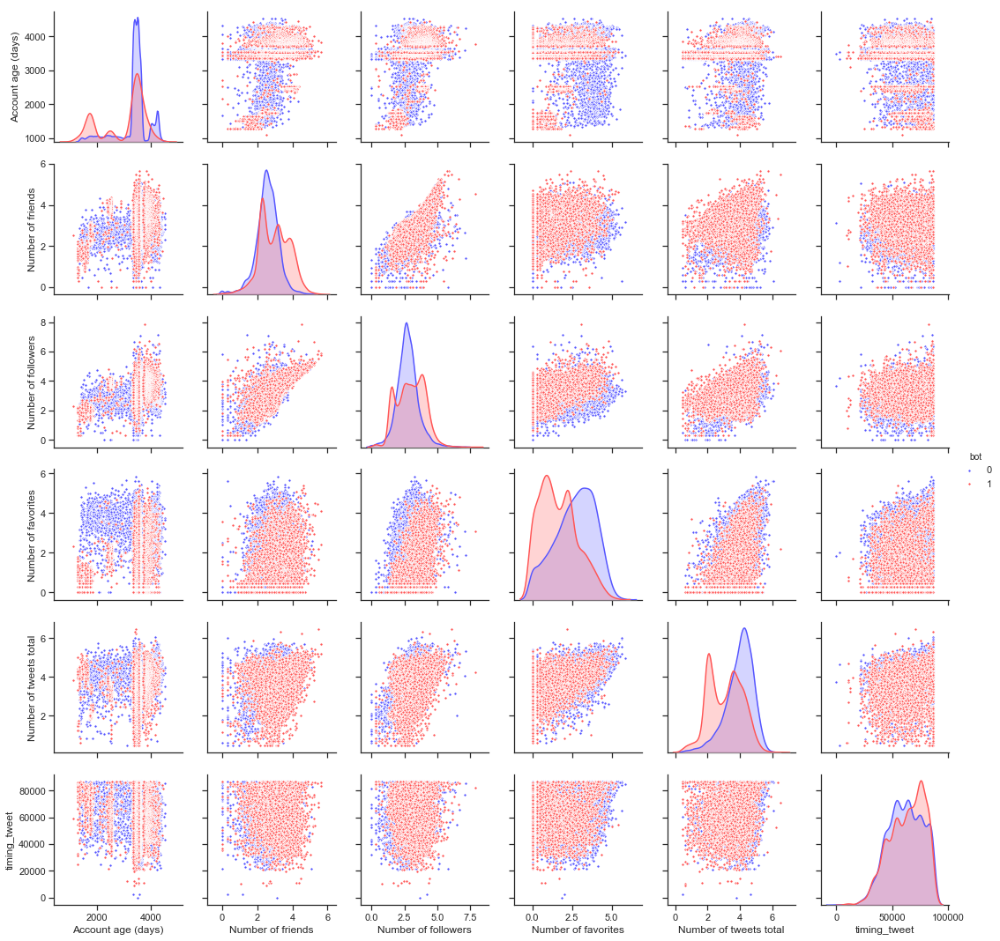

In [5]:
pairplot_df = total_df.copy()
pairplot_df['Number of friends'] = np.log10(pairplot_df['Number of friends'])
pairplot_df['Number of followers'] = np.log10(pairplot_df['Number of followers'])
pairplot_df['Number of favorites'] = np.log10(pairplot_df['Number of favorites'])
pairplot_df['Number of tweets total'] = np.log10(pairplot_df['Number of tweets total'])

sns.set(style="ticks", color_codes=True)
g = sns.pairplot(pairplot_df, vars=[u'Account age (days)', 'Number of friends', u'Number of followers', u'Number of favorites', u'Number of tweets total', u'timing_tweet'],
                 hue='bot', palette = 'seismic',diag_kind = 'kde',diag_kws=dict(shade=True),plot_kws=dict(s=10))
#g.set(xticklabels=[])

## Natural Language Processing and Text-Based Features

### Background and feature description

As we learned in our literature review, user-based features provide sufficient information to identify bots. However, the type of tweet and tweet content can provide additional information to help identify bots. After the list of user-based features was produced, we used the usernames to download additional information from Twitter. We downloaded the previous tweets for every user, up to 200 tweets, their timestamp, and a list of all the user mentions for each tweet. Retweets can be identified by the string 'RT' at the beginning of a tweet. Mentions can be identified by a '@' or by examining the length of the user_mentions field. We used these data to build the following features:

    FEATURE                  DESCRIPTION
    ========                 ============
    overall_sentiment :      Sentiment is a measure of the negativity or positivity of a list of words. 
                             We use the nltk and wordblob packages to evaluate the full text of a 
                             user's tweets. The full text was made of a concatination of all text tweet 
                             strings, with stopwords removed. The more positive the tweet, the higher 
                             the value for overall_sentiment, and visa versa. Scores range from -1 to 1.
                             
    overall_polarity  :      Polarity is a measure of the subjectivity of a list of words. Overall 
                             polarity is a measure of the overall subjectiveness of the user's Tweet text.
                             
    var_sentiment     :      Measure of the variance of sentiment. This is calculated by finding the 
                             variance of sentiment scores for a user across their individual Tweets.
                             
    var_polarity      :      Measure of the variance of polarity. This is calculated by finding the 
                             variance of polarity scores for a user across their individual Tweets.
                             
    percent_with_emoji:      Emojis are extracted, and the percent of tweets with at least one emoji 
                             is calculated.
                             
    percent_with_hashtag:    Percents of tweets that have at least one hashtag. 
    
    avg_num_hashtag   :      Average number of hashtags in each tweet. 
    
    percent_mention   :      Percent of tweets with at least one mention. A mention is when a user 
                             tags another user in their tweet, like @theRealDonaldTrump, etc. 
                             
    percent_retweet   :      Percent of tweets that are retweets.
    
    avg_num_mention   :      Average number of mentions in a tweet.
    
    avg_time_
    between_mention   :      Average time between tweets that have at least one mention. If a user 
                             has no mentions or only one mention, the mean is imputed.
                             
    avg_time_
    between_retweet   :      Average time between retweets. If a user has no retweets or only one 
                             retweet, the mean is imputed.
                             
    avg_word_len      :      The average word length in the full tweet text.
    
    avg_num_exclamation:     Average number of ! characters in the full tweet text.
    
    avg_num_ellipses  :      Average number of ... characters in the full tweet text.
    
    avg_num_caps      :      Average number of words with capital letters in full tweet text.
    
    avg_words_per_tweet:     Average number of words per tweet.
    
    word_diversity    :      The word diversity is a measure of number of unique words/number 
                             of total words. This is calculated on the full tweet text.
                             
    difficult_
    word_score        :      This is calculated using the textstat package, and returns 
                             the number of difficult words/total number of words for the full tweet text.
                             
    num_languages     :      The language for each tweet is determined, and num_languages is the 
                             sum of unique tweet languages.
                             
    overall_language  :      The language of the full tweet text.
    
    avg_readability_DC:      A measure of the average Dale Chall readability score. This 
                             returns the average grade level necessary to read and comprehend the text.  
                             
    avg_flesch_
    reading_ease      :      Flesch reading ease measures the readability of text. A higher score is better.
    
    avg_readability_
    combined_metric :        Measure for the overall readability that combines a wide variety of 
                             reading metrics, including the aformentioned Flesch reading metric and 
                             Dale Chall readability score. 

### Description of data aquisition, cleaning, and feature construction

#### 1) Import the relevant packages 

In [4]:
from os import listdir
from os.path import isfile, join
import sys
import jsonpickle
import os
import tweepy
import nltk 
import pandas as pd
import json
import csv
from pandas.io.json import json_normalize
from datetime import datetime, timezone
from nltk.corpus import stopwords
from string import punctuation
from bs4 import BeautifulSoup
import numpy as np
import botometer
import re
import seaborn as sns
import matplotlib.pyplot as plt
import plotly
import langdetect
import textstat
import emoji

import warnings
warnings.filterwarnings("ignore")
plotly.offline.init_notebook_mode()

#### 2) Access the Twitter API

In [2]:
#OAuth process, using the keys and tokens
auth = tweepy.OAuthHandler(consumer_key, consumer_secret)
auth.set_access_token(access_token, access_token_secret)
api = tweepy.API(auth)

#### 3) Load dataframes from 
    a) legitimate users
    b) bot users
    c) detection dataset
as generated above in user-based features. Display the head of the dataframe to check for completeness.

In [62]:
# Read in dataset from user-features to get user-IDs

# Legitimate user info
lu_df = pd.read_csv('data_NLP/user_df_final.csv', sep = ',', header = 0)
display(lu_df.head())

# bot user info
bots_df = pd.read_csv('data_NLP/bot_df_final.csv', sep = ',', header = 0)
display(bots_df.head())

# detection data
detection_df = pd.read_csv('data_NLP/pred_dataframe.csv', sep = ',', header = 0)
display(detection_df.head())

,User ID,Screen name length,Number of digits in screen name,User name length,Default profile (binary),Default picture (binary),Account age (days),Number of unique profile descriptions,Number of friends,Number of followers,Number of favorites,Number of tweets per hour,Number of tweets total,timing_tweet
0,614,10,0,18,0,0,4528,3,2253,1658,5794,0.141766,15406,69459.000
1,1038,7,0,14,0,0,4526,5,1042,1419,4721,0.313614,34066,85022.250
2,1437,6,0,10,0,0,4525,2,211,287,408,0.029448,3198,62822.625
3,2615,7,0,11,0,0,4522,2,676,758,85,0.007159,777,53885.750
4,3148,8,0,13,0,0,4515,3,3835,7941,1629,0.278728,30203,43391.625


,User ID,Screen name length,Number of digits in screen name,User name length,Default profile (binary),Default picture (binary),Account age (days),Number of unique profile descriptions,Number of friends,Number of followers,Number of favorites,Number of tweets per hour,Number of tweets total,timing_tweet
0,24858289,9,2,6,1,0,3550,1,58,34,23,0.173451,14778,80373.750
1,33212890,12,0,14,0,0,3517,5,4306,34535,56190,0.417259,35220,72457.875
2,39773427,10,2,15,0,0,3493,1,723,527,50,0.307365,25767,71798.125
3,57007623,14,0,18,0,0,3430,1,401,464,38,0.103790,8544,60956.875
4,96435556,10,0,7,0,0,3279,1,673,387,1773,0.679793,53497,84675.750


,User ID,Screen name length,Number of digits in screen name,User name length,Default profile (binary),Default picture (binary),Account age (days),Number of unique profile descriptions,Number of friends,Number of followers,Number of favorites,Number of tweets per hour,Number of tweets total,timing_tweet
0,876476261220179968,8,0,9,1,0,538,1,591,605,20523,0.695942,8986,86336.625
1,909863671563739136,11,2,7,1,0,445,5,437,344,3260,0.298315,3186,86327.750
2,951973545831223296,14,2,13,1,1,329,1,61,164,39313,5.012918,39582,86379.250
3,981943174947065856,12,0,10,0,0,247,1,1298,401,31724,1.750675,10378,86203.875
4,4735793156,10,0,5,1,0,1063,7,160,112,32158,0.263209,6715,84869.125


In [63]:
# get list of each type of users 
lu_list = lu_df['User ID'].values.astype(int)
bot_list = bots_df['User ID'].values.astype(int)
detection_list = detection_df['User ID'].values.astype(int)

#### 4) Scrape the most recent tweets for each user (200 tweets maximum)

In [65]:
# Given a name list and number of tweets needed to extract for each account
# Return a dictionary of dataframes
# Each dataframe contains info of one user
def API_scrape(name_list, count_num):
    fail_lst = []
    user_dfs = {}
    for name in name_list:
        try:
            status_a = api.user_timeline(name, count = count_num, tweet_mode = 'extended')
            user_dfs[name] = pd.DataFrame()
            for i in range(len(status_a)):
                json_str = json.dumps(status_a[i]._json)
                jdata = json_normalize(json.loads(json_str))
                user_dfs[name] = user_dfs[name].append(jdata, ignore_index=True)
        
        
            single_user = user_dfs[name][['full_text','created_at','entities.user_mentions']].copy().reset_index()
            single_user['user_id'] = name
            single_user.drop(['index'], inplace=True, axis = 1)
            filepath ='data_NLP/detection/{}_tweets.csv'.format(name)
            single_user.to_csv(filepath, sep='\t')
        
        except Exception as e:
            print(e)
            fail_lst.append(name)
            continue
    
    return user_dfs, fail_lst

In [ ]:
# scrape the last 200 tweets from users in above lists 
get_data = False
if get_data:
    user_dfs_legit, fail_lst_legit = API_scrape(lu_list, 200)
    user_dfs_bot, fail_lst_bot = API_scrape(bot_list, 200)
    user_dfs_detection, fail_lst_detection = API_scrape(detection_list, 200)
    

#### 5) Generate list of files for each type of user (bot, legitimate, detection)

In [73]:
# Concatenate user data of each type into list 
!ls
mypath_bots = 'data_NLP/bots/'
mypath_legit = 'data_NLP/legit/'
mypath_detect = 'data_NLP/detection/'
botfiles = [f for f in listdir(mypath_bots) if isfile(join(mypath_bots, f)) and not f=='.DS_Store']
legitfiles = [f for f in listdir(mypath_legit) if isfile(join(mypath_legit, f))and not f=='.DS_Store']
detectfiles = [f for f in listdir(mypath_detect) if isfile(join(mypath_detect, f))and not f=='.DS_Store']

AC209a-Twitter-Milestone-2.ipynb Untitled.ipynb
Advanced_Features.md             __pycache__
Advanced_Features_files          _config.yml
Data_acquisition.md              _layouts
EDA.md                           _support
EDA_files                        assets
Final_Models.md                  bot_users.txt
Final_Models_files               cresci-2017.csv (1)
LICENSE                          data_NLP
Literature Review.ipynb          img
Literature_review.md             index.md
Merge Dataframes.ipynb           legitimate_users.txt
README.md                        myTokens.csv
Testing_Evaluation.md            myTokens.py
Testing_Evaluation_files         notebooks
Twitter_data_datascrape.ipynb    tweets.json


#### 6) Generate NLP features for each user, and concatinate into a single dataframe

In [75]:
# function to generate the NLP features
def create_NLP_dataframe(user, userType):
    
    # check user type, and specify bot boolean and data folder accordingly
    if userType=='bot':
        tweets_df = pd.DataFrame.from_csv('data_NLP/bots/' + user ,sep='\t')
        tweets_df['bot_bool'] = 1
    elif userType =='legit':
        tweets_df = pd.DataFrame.from_csv('data_NLP/legit/' + user ,sep='\t')
        tweets_df['bot_bool'] = 0
    elif userType == 'detect':
        tweets_df = pd.DataFrame.from_csv('data_NLP/detection/' + user ,sep='\t')
        tweets_df['bot_bool'] = float('NaN')
    tweets_df.rename(index=str, columns={"full_text": "text"}, inplace=True)
    
    # user name is an int
    tweets_df['user_id'] = [int(username) for username in tweets_df['user_id']]

    tweets_df['created_at'] = pd.to_datetime(tweets_df['created_at'])

    # number of hashtags 
    tweets_df['num_hashtags'] = tweets_df['text'].apply(lambda x: len([x for x in x.split() if x.startswith('#')]))

    # number of all-caps words 
    tweets_df['num_upper'] = tweets_df['text'].apply(lambda x: len([x for x in x.split() if x.isupper()]))

    # deal with emojis
    class Emoticons:
        POSITIVE = ["*O", "*-*", "*O*", "*o*", "* *",
                    ":P", ":D", ":d", ":p",
                    ";P", ";D", ";d", ";p",
                    ":-)", ";-)", ":=)", ";=)",
                    ":<)", ":>)", ";>)", ";=)",
                    "=}", ":)", "(:;)",
                    "(;", ":}", "{:", ";}",
                    "{;:]",
                    "[;", ":')", ";')", ":-3",
                    "{;", ":]",
                    ";-3", ":-x", ";-x", ":-X",
                    ";-X", ":-}", ";-=}", ":-]",
                    ";-]", ":-.)",
                    "^_^", "^-^"]

        NEGATIVE = [":(", ";(", ":'(",
                    "=(", "={", "):", ");",
                    ")':", ")';", ")=", "}=",
                    ";-{{", ";-{", ":-{{", ":-{",
                    ":-(", ";-(",
                    ":,)", ":'{",
                    "[:", ";]"
                    ]

    def getPositiveTweetEmojis(tweet):
        return ''.join(c for c in tweet if c in Emoticons.POSITIVE)

    def getNegativeTweetEmojis(tweet):
        return ''.join(c for c in tweet if c in Emoticons.NEGATIVE)

    def extractAllEmojis(str):
        return ''.join(c for c in str if c in emoji.UNICODE_EMOJI)

    # all emojis in a text 
    def extract_emojis(str):
        return ''.join(c for c in str if c in emoji.UNICODE_EMOJI)
    tweets_df['all_emojis'] = [extractAllEmojis(tweet) for tweet in tweets_df['text']]
    tweets_df['positive_emojis'] = [getPositiveTweetEmojis(tweet) for tweet in tweets_df['text']]
    tweets_df['negative_emojis'] = [getNegativeTweetEmojis(tweet) for tweet in tweets_df['text']]

    # clean tweets 
    tweets_df['text'] = [re.sub(r'http[A-Za-z0-9:/.]+','',str(tweets_df['text'][i])) for i in range(len(tweets_df['text']))]
    removeHTML_text = [BeautifulSoup(tweets_df.text[i], 'lxml').get_text() for i in range(len(tweets_df.text))]
    tweets_df.text = removeHTML_text
    tweets_df['text'] = [re.sub(r'@[A-Za-z0-9]+','',str(tweets_df['text'][i])) for i in range(len(tweets_df['text']))]

    weird_characters_regex = re.compile(r"[^\w\d ]")
    tweets_df.text = tweets_df.text.str.replace(weird_characters_regex, "")
    RT_bool = [1 if text[0:2]=='RT' else 0.0 for text in tweets_df['text']]
    tweets_df['RT'] = RT_bool
    tweets_df.text = tweets_df.text.str.replace('RT', "")

    # average time between retweets
    retweet_table = tweets_df[['created_at','RT']].copy()
    retweet_table  = retweet_table[retweet_table.RT == 1]
    
    # if user has retweets, calculate average time 
    if (retweet_table.size)>1:
        total_observation_period_rt = (retweet_table['created_at'][0]-retweet_table['created_at'][-1])
        
        total_observation_period_rt_days =(total_observation_period_rt.days)
        # round up to 1 day
        if total_observation_period_rt.days == 0.0:
            total_observation_period_rt_days = 1.0
            
        time_between_average_rt = (len(retweet_table))/total_observation_period_rt_days
    else:
        time_between_average_rt = None

    # average number of mentions
    tweets_df['num_mentions'] = [len(eval(tweets_df['entities.user_mentions'][i])) for i in range(len(tweets_df.text))]

    # average time between mentions
    mention_table = tweets_df[['num_mentions','created_at']].copy()
    mention_table  = mention_table[mention_table['num_mentions']>0]
    if (mention_table.size)>1:
        total_observation_period_mention = mention_table['created_at'][0]-mention_table['created_at'][-1]
        
        # round up to 1 day
        total_observation_period_mention_days =total_observation_period_mention.days
        if total_observation_period_mention.days == 0:
            total_observation_period_mention_days = 1
        time_between_average_mention = float(len(mention_table))/float(total_observation_period_mention_days)
    else: 
        time_between_average_mention = None 

    # get word count, char count
    tweets_df['word_count'] = tweets_df['text'].apply(lambda x: len(str(x).split(" ")))
    tweets_df['char_count'] = tweets_df['text'].str.len() ## this also includes spaces
    
    # language of each tweet
    try:
        tweets_df['language'] = [langdetect.detect(tweets_df['text'][i]) for i in range(len(tweets_df))]
    except:
        tweets_df['language'] = 'en'
    tweets_df['num_languages'] = len(set(tweets_df['language']))

    # build some average features
    
    # retweet features 
    tweets_df['avg_time_between_rt'] = time_between_average_rt
    tweets_df['percent_tweet_rt'] = np.sum(tweets_df['RT'])/len(tweets_df)
    
    # mention features 
    tweets_df['avg_time_between_mention'] = time_between_average_mention
    tweets_df['avg_num_mentions'] = np.mean(tweets_df['num_mentions'])
    tweets_df['mention_bool'] = [1.0 if (tweets_df['num_mentions'][i])>0 else 0.0 for i in range(len(tweets_df))]
    tweets_df['percent_mention'] = np.sum(tweets_df['mention_bool'])/len(tweets_df)
    
    # hashtag features 
    tweets_df['bool_hashtag'] = [1.0 if (tweets_df['num_hashtags'][i])>0 else 0.0 for i in range(len(tweets_df))]
    tweets_df['percent_hashtag'] = np.sum(tweets_df['bool_hashtag'])/len(tweets_df)
    tweets_df['avg_num_hashtags'] = np.mean(tweets_df['num_hashtags'])
    
    # text features 
    tweets_df['avg_num_caps'] = np.mean(tweets_df['num_upper'])
    tweets_df['avg_words_per_tweet'] = np.mean(tweets_df['word_count'])
    
    # emoji features 
    tweets_df['emoji_bool'] = [1.0 if len(tweets_df['all_emojis'][i])>0 else 0.0 for i in range(len(tweets_df))]
    tweets_df['emoji_p_bool'] = [1.0 if len(tweets_df['positive_emojis'][i])>0.0 else 0.0 for i in range(len(tweets_df))]
    tweets_df['emoji_n_bool'] = [1.0 if len(tweets_df['negative_emojis'][i])>0.0 else 0.0 for i in range(len(tweets_df))]
    tweets_df['emoji_pn_bool'] = [1.0 if len(tweets_df['positive_emojis'][i])>0.0 and 
                                  len(tweets_df['negative_emojis'][i])>0 else 0.0 for i in range(len(tweets_df))]
    tweets_df['percent_with_emoji'] = np.mean(tweets_df['emoji_bool'])
    tweets_df['percent_with_p_emoji'] = np.mean(tweets_df['emoji_p_bool'])
    tweets_df['percent_with_n_emoji'] = np.mean(tweets_df['emoji_n_bool'])
    tweets_df['percent_with_pn_emoji'] = np.mean(tweets_df['emoji_pn_bool'])
    
    # variance features 
    tweets_df['var_num_mentions'] = np.var(tweets_df['num_mentions'])
    tweets_df['var_num_hashtags'] = np.var(tweets_df['num_hashtags'])
    tweets_df['var_num_caps'] = np.var(tweets_df['num_upper'])
    tweets_df['var_words_per_tweet']= np.var(tweets_df['word_count'])
    tweets_df['var_emoji_bool']= np.var(tweets_df['emoji_bool'])

    # get average word length
    def avg_word(sentence):
        words = sentence.split()
        if len(words) == 0:
            return 0.0
        return (sum(len(word) for word in words)/len(words))

    tweets_df['avg_word_len'] = tweets_df['text'].apply(lambda x: avg_word(x))
    tweets_df[['text','avg_word_len']].head()

    # all lowercase 
    tweets_df['text'] = tweets_df['text'].apply(lambda x: " ".join(x.lower() for x in x.split()))

    # remove stopwords and punctuation
    retweet = ['RT','rt']
    stoplist = stopwords.words('english') + list(punctuation) + retweet
    
    # character features 
    tweets_df['num_exclamation'] = [tweets_df['text'][i].count("!") for i in range(len(tweets_df))]
    tweets_df['avg_num_exclamation'] = np.mean(tweets_df['num_exclamation'])
    
    tweets_df['num_question_mark'] = [tweets_df['text'][i].count("?") for i in range(len(tweets_df))]
    tweets_df['avg_num_question_mark'] = np.mean(tweets_df['num_question_mark'])
    
    tweets_df['num_ellipses'] = [tweets_df['text'][i].count("...") for i in range(len(tweets_df))]
    tweets_df['avg_num_ellipses'] = np.mean(tweets_df['num_ellipses'])
    
    
    tweets_df['text'] = tweets_df['text'].apply(lambda x: " ".join(x for x in x.split() if x not in stoplist))
    tweets_df['text'].head()

    # add sentiment feature
    from textblob import Word, TextBlob  
    tweets_df['sentiment'] = tweets_df['text'].apply(lambda x: TextBlob(x).sentiment[0])
    tweets_df['polarity'] = tweets_df['text'].apply(lambda x: TextBlob(x).sentiment[1])
    tweets_df = tweets_df.sort_values(['sentiment'])
    
    #variance of sentiment features 
    tweets_df['var_sentiment']= np.var(tweets_df['sentiment'])
    tweets_df['var_polarity']= np.var(tweets_df['polarity'])

    # add list of nouns
    tweets_df['nouns'] = [TextBlob(tweets_df.text[i]).noun_phrases for i in range(len(tweets_df.text))]

    tweets_df['POS_tag_list'] = [TextBlob(tweets_df.text[i]).tags for i in range(len(tweets_df.text))]
    tweets_df['POS_tag_list'] = [[tuple_POS[1] for tuple_POS in tweets_df['POS_tag_list'][i]] for i in range(len(tweets_df.text))]

    # look at 10 most frequent words
    freq = pd.Series(' '.join(tweets_df['text']).split()).value_counts()[:20]

    tweets_df['top_20_nouns'] = [freq.index.values for i in range(len(tweets_df))]

    list_of_POS = ["CC","CD","DT","EX","FW","IN","JJ","JJR","JJS","LS","MD","NN","NNS","NNP","NNPS",
    "PDT","POS","PRP","PRP","RB","RBR","RBS","RP","TO","UH","VB","VBD","VBG","VBN",
    "VBP","VBZ","WDT","WP","WP$","WRB"]

    for POS in list_of_POS:
        varname = POS+"_count"
        tweets_df[varname] = [tweets_df['POS_tag_list'][i].count(POS) for i in range(len(tweets_df.text))]

    # get full text in a string
    full_tweet_text = ""
    for i in range(len(tweets_df)):
        full_tweet_text = full_tweet_text + " " + tweets_df['text'][i]
    full_tweet_text_list = full_tweet_text.split()
    unique_full_text = len(set(full_tweet_text_list))

    # features based on full text 
    
    # language based features 
    tweets_df['word_diversity'] = unique_full_text/len(full_tweet_text)
    
    # measures of grade level
    tweets_df['flesch_reading_ease'] = [textstat.flesch_reading_ease(tweets_df['text'][i]) 
                                        for i in range(len(tweets_df.text))]
    tweets_df['avg_flesch_reading_ease']= np.mean(tweets_df['flesch_reading_ease'])
    
    tweets_df['readability_DC'] = [textstat.dale_chall_readability_score(tweets_df['text'][i]) 
                                        for i in range(len(tweets_df.text))]
    tweets_df['avg_readability_DC'] = np.mean(tweets_df['readability_DC'])
    
  
    # higher means more difficult words 
    tweets_df['difficult_words_score'] = textstat.difficult_words(full_tweet_text)/len(full_tweet_text_list)
    
    # combo of lots of metrics: 
    #tweets_df['readability_combined_metric'] = textstat.text_standard(full_tweet_text, float_output=True)
    
    
    tweets_df['readability_combined_metric'] = [textstat.text_standard(tweets_df['text'][i], float_output=True) 
                                        for i in range(len(tweets_df.text))]
    tweets_df['avg_readability_combined_metric']= np.mean(tweets_df['readability_combined_metric'])
    
    # sentiment
    tweets_df['overall_sentiment'] = TextBlob(full_tweet_text).sentiment[0]
    tweets_df['overall_polarity'] = TextBlob(full_tweet_text).sentiment[1]
    
    # overall language
    tweets_df['overall_language'] = langdetect.detect(full_tweet_text)
    
    tweets_df['full_tweet_text'] = full_tweet_text
    
    feature_subset = tweets_df[['user_id', 'bot_bool','overall_sentiment','overall_polarity','var_sentiment',
                                'var_polarity',
                                'percent_with_emoji', 'percent_with_n_emoji','percent_with_p_emoji',
                               'percent_with_pn_emoji', 'percent_hashtag','avg_num_hashtags',
                               'percent_mention', 'avg_num_mentions','avg_time_between_mention',
                               'avg_word_len','avg_num_exclamation','avg_num_ellipses',
                               'avg_time_between_rt','percent_tweet_rt','avg_num_caps','avg_words_per_tweet',
                               'word_diversity','difficult_words_score', 'num_languages','overall_language', 
                                'avg_readability_combined_metric','avg_flesch_reading_ease', 'avg_readability_DC',
                                'full_tweet_text']]

    # all rows are identical now, so just return first one 
    return feature_subset.iloc[0]


In [ ]:
# get all legitimate user files into dataframe and save it 
legit_data_list = []
legit_fail_list = []
for i, legit_file in enumerate(legitfiles):
    if i%10 == 0:
        print(i)
    try:
        user_to_append = create_NLP_dataframe(legit_file,'legit')
        legit_data_list.append(user_to_append)
    except Exception as e: 
        print(e)
        print("user {} failed".format(legit_file))
        legit_fail_list.append(legit_file)
legit_df = pd.concat(legit_data_list,axis=1).T.copy()
legit_df.to_csv("data_NLP/legit_NLP_full.csv", sep=',')

In [ ]:
# get all bot files into dataframe and save it 
bot_data_list = []
bot_fail_list = []
for i, bot_file in enumerate(botfiles):
    if i%10 == 0:
        print(i)
    try:
        user_to_append = create_NLP_dataframe(bot_file,'bot')
        bot_data_list.append(user_to_append)
    except Exception as e: 
        print(e)
        print("user {} failed".format(bot_file))
        bot_fail_list.append(bot_file)
bot_df = pd.concat(bot_data_list,axis=1).T.copy()
bot_df.to_csv("data_NLP/bot_NLP_full.csv", sep=',')

In [ ]:
# get all detect files into dataframe and save it 
detect_data_list = []
detect_fail_list = []
for i, detect_file in enumerate(detectfiles):
    if i%10 == 0:
        print(i)
    try:
        user_to_append = create_NLP_dataframe(detect_file,'detect')
        detect_data_list.append(user_to_append)
    except Exception as e: 
        print(e)
        print("user {} failed".format(detect_file))
        detect_fail_list.append(detect_file)
detect_df = pd.concat(detect_data_list,axis=1).T.copy()
detect_df.to_csv("data_NLP/detect_NLP_full.csv", sep=',')

### EDA for Natural Language and Text-Based Features

In [9]:
bots_df  = pd.DataFrame.from_csv('data_NLP/merged_mean_imputed_bots.csv' ,sep=',')
legit_df = pd.DataFrame.from_csv('data_NLP/merged_mean_imputed_legit.csv' ,sep=',')

display(bots_df.head())

,bot_bool,overall_sentiment,overall_polarity,var_sentiment,var_polarity,percent_with_emoji,percent_with_n_emoji,percent_with_p_emoji,percent_with_pn_emoji,percent_hashtag,...,Default profile (binary),Default picture (binary),Account age (days),Number of unique profile descriptions,Number of friends,Number of followers,Number of favorites,Number of tweets per hour,Number of tweets total,timing_tweet
User ID,,,,,,,,,,,,,,,,,,,,,
2384881206,1,0.269035,0.550786,0.104871,0.118452,0.000000,0.0,0.0,0.0,0.035294,...,0,0,1729,1,166,20,0,0.002048,85,77701.125000
2382770917,1,0.287444,0.528971,0.129360,0.110351,0.011494,0.0,0.0,0.0,0.068966,...,0,0,1730,1,905,133,6,0.002119,88,60523.142857
466121357,1,0.079398,0.437963,0.012117,0.024463,0.155000,0.0,0.0,0.0,0.375000,...,0,0,2514,1,5794,7377,15,0.019756,1192,42387.625000
465343577,1,-0.000064,0.384234,0.005578,0.025758,0.005000,0.0,0.0,0.0,0.085000,...,0,0,2515,1,8183,7309,202,0.060934,3678,65414.875000
2380402136,1,0.306328,0.594762,0.096861,0.129708,0.000000,0.0,0.0,0.0,0.033333,...,0,0,1732,3,151,24,0,0.002165,90,80823.500000


#### First, let's look at the sentiment and subjectivity features:

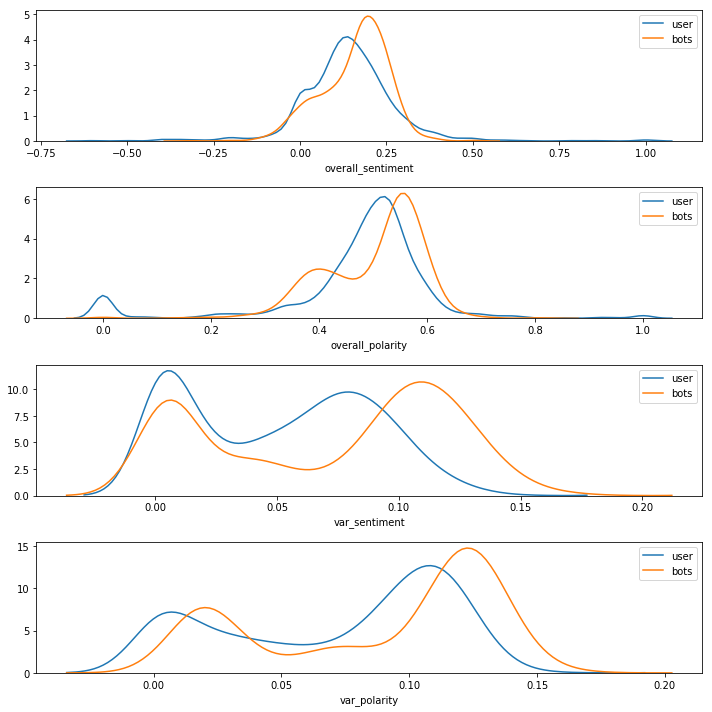

In [33]:
features = ['overall_sentiment', 'overall_polarity', 'var_sentiment', 'var_polarity']
fig, axes = plt.subplots(len(features),1, figsize = (10,10))
for i in range(len(features)):
    sns.kdeplot(legit_df[features[i]], ax = axes[i], label = 'user')
    sns.kdeplot(bots_df [features[i]], ax = axes[i], label = 'bots')
    axes[i].set_xlabel(features[i])
    axes[i].legend()

plt.tight_layout()
plt.show()

#### Text style based features

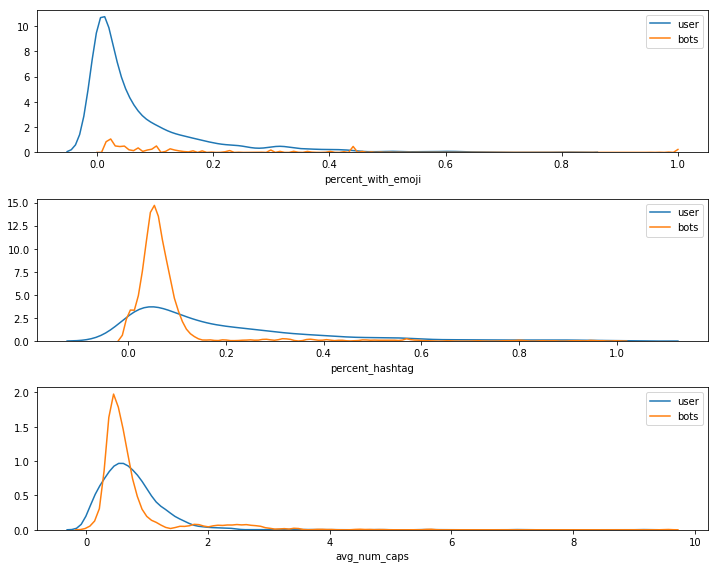

In [32]:
features = ['percent_with_emoji', 'percent_hashtag','avg_num_caps']
fig, axes = plt.subplots(len(features),1, figsize = (10,8))
for i in range(len(features)):
    sns.kdeplot(legit_df[features[i]], ax = axes[i], label = 'user')
    sns.kdeplot(bots_df [features[i]], ax = axes[i], label = 'bots')
    axes[i].set_xlabel(features[i])
    axes[i].legend()

plt.tight_layout()
plt.show()

#### Tweeting style (retweets, mentions) based features:

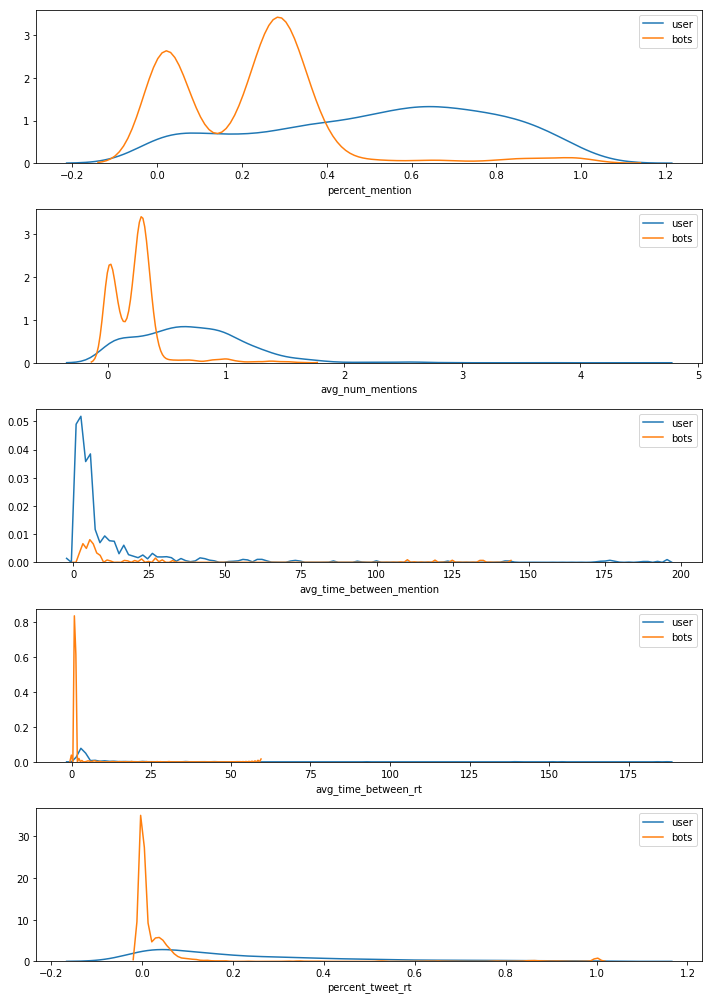

In [30]:
features = ['percent_mention', 'avg_num_mentions',
            'avg_time_between_mention',  
            'avg_time_between_rt','percent_tweet_rt']
fig, axes = plt.subplots(len(features),1, figsize = (10,14))
for i in range(len(features)):
    sns.kdeplot(legit_df[features[i]], ax = axes[i], label = 'user')
    sns.kdeplot(bots_df [features[i]], ax = axes[i], label = 'bots')
    axes[i].set_xlabel(features[i])
    axes[i].legend()

plt.tight_layout()
plt.show()


#### Natural Language-based features

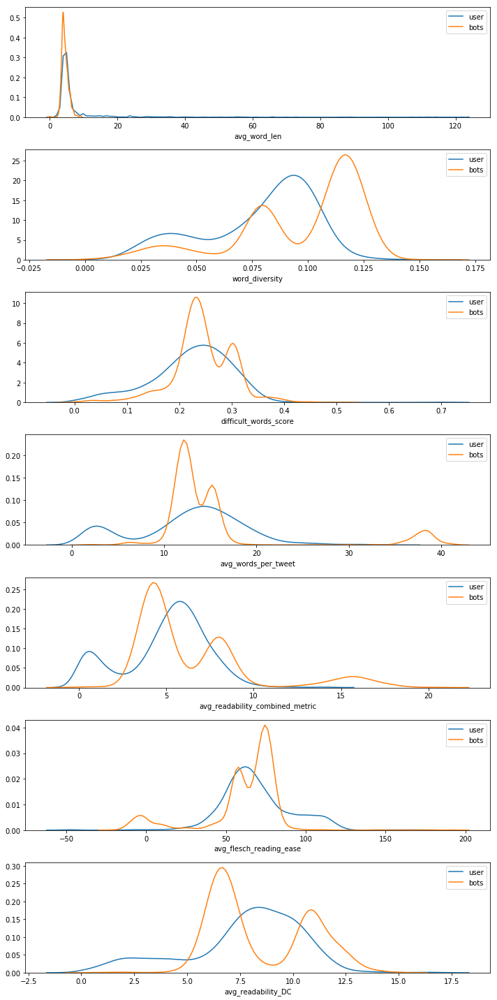

In [29]:
features = ['avg_word_len','word_diversity' ,'difficult_words_score', 
            'avg_words_per_tweet','avg_readability_combined_metric',  
            'avg_flesch_reading_ease', 'avg_readability_DC']
fig, axes = plt.subplots(len(features),1, figsize = (10,20))
for i in range(len(features)):
    sns.kdeplot(legit_df[features[i]], ax = axes[i], label = 'user')
    sns.kdeplot(bots_df [features[i]], ax = axes[i], label = 'bots')
    axes[i].set_xlabel(features[i])
    axes[i].legend()

plt.tight_layout()
plt.show()


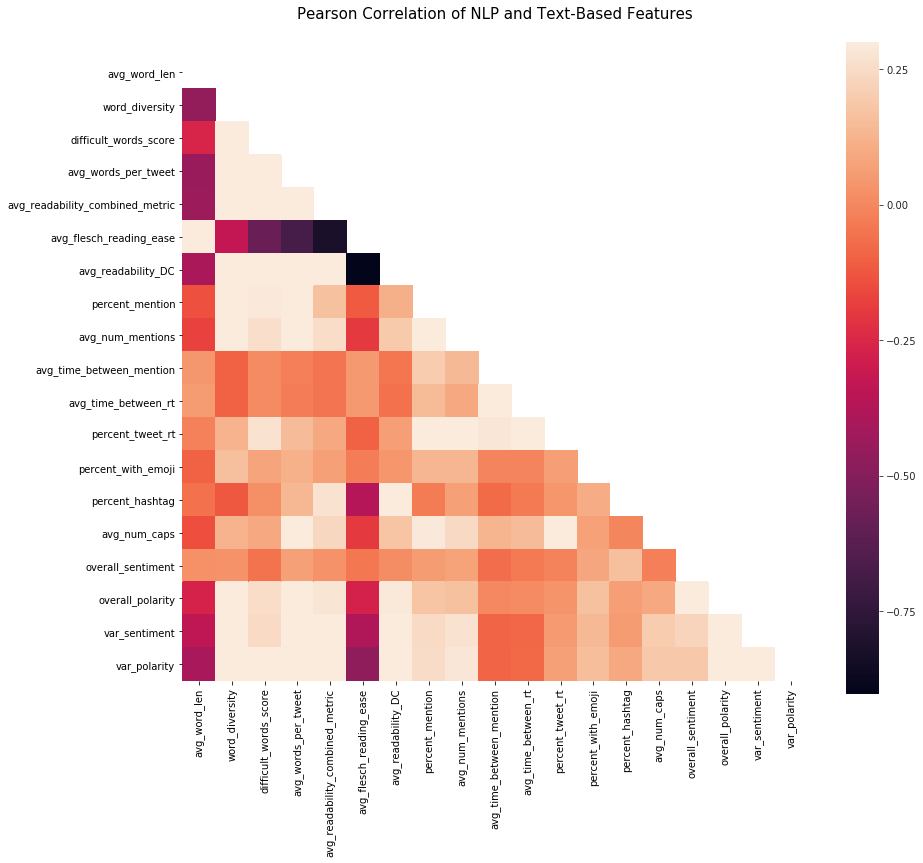

In [37]:
colormap = plt.cm.RdBu
plt.figure(figsize=(14,12))
plt.title('Pearson Correlation of NLP and Text-Based Features', y=1.05, size=15)

# Generate a mask for the upper triangle
corr = legit_df[['avg_word_len','word_diversity' ,'difficult_words_score', 
            'avg_words_per_tweet','avg_readability_combined_metric',  
            'avg_flesch_reading_ease', 'avg_readability_DC',
            'percent_mention', 'avg_num_mentions',
            'avg_time_between_mention',  
            'avg_time_between_rt','percent_tweet_rt',
            'percent_with_emoji', 'percent_hashtag','avg_num_caps',
            'overall_sentiment', 'overall_polarity', 'var_sentiment', 
            'var_polarity']].astype(float).corr()
mask = np.zeros_like(corr, dtype=np.bool)
mask[np.triu_indices_from(mask)] = True
with sns.axes_style("white"):
    ax = sns.heatmap(corr, mask=mask, vmax=.3, square=True)

# <img style="float: left; padding-right: 10px; width: 45px" src="https://raw.githubusercontent.com/Harvard-IACS/2018-CS109A/master/content/styles/iacs.png"> AC209a Twitter Project - Group 15

## Experiments with Twitter API

**Harvard University**<br/>
**Fall 2018**<br/>
**Project Authors**: Claire Stolz, Matthew Stewart, Yiming Qin & Tianning Zhao <br>
**Assigned Teaching Fellow**: Brandon Lee

<hr style="height:2pt">

In [1]:
%%capture
# RUN THIS CELL FOR FORMAT
import requests
from IPython.core.display import HTML
styles = requests.get("https://raw.githubusercontent.com/Harvard-IACS/2018-CS109A/master/content/styles/cs109.css").text
HTML(styles)

### Important packages

1. `Tweepy` - Twitter API - http://docs.tweepy.org/en/v3.5.0/api.html#tweepy-api-twitter-api-wrapper

2. `nltk` - Natural language processing library - http://www.nltk.org/howto/twitter.html

3. `twython` - Python wrapper for the Twitter API

4. `jsonpickle` - converts Python objects into JSON

5. `scikit-learn` - Python machine learning library

https://github.com/Jefferson-Henrique/GetOldTweets-python

In [2]:
%%capture
!pip install --upgrade jsonpickle tweepy

import sys
import jsonpickle
import os
import numpy as np
import pandas as pd
import tweepy
import nltk
import pandas as pd
import json
import sklearn
import datetime
from datetime import datetime
import statsmodels.api as sm
from statsmodels.api import OLS
from sklearn import preprocessing
from sklearn.preprocessing import PolynomialFeatures
from sklearn.metrics import r2_score
from sklearn.metrics import accuracy_score
from sklearn.linear_model import LogisticRegression
from sklearn.linear_model import LogisticRegressionCV
from sklearn.pipeline import make_pipeline
from sklearn.preprocessing import PolynomialFeatures
from sklearn.model_selection import train_test_split
from pandas.plotting import scatter_matrix
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis
from sklearn.discriminant_analysis import QuadraticDiscriminantAnalysis
from sklearn.ensemble import AdaBoostClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report,confusion_matrix
from sklearn.model_selection import GridSearchCV
from sklearn.ensemble import GradientBoostingClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report,confusion_matrix
from sklearn.model_selection import GridSearchCV
from sklearn.ensemble import GradientBoostingClassifier
import xgboost as xgb
from sklearn.metrics import confusion_matrix
from sklearn.neighbors import KNeighborsClassifier
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import KFold
from sklearn.svm import SVC

from sklearn import svm
import seaborn as sns
import matplotlib.pyplot as plt
import matplotlib
%matplotlib inline
from pandas.io.json import json_normalize

import warnings
warnings.filterwarnings('ignore')

# Baseline Model  with Multiple Features

In [3]:
bot_df = pd.read_csv(r"bot_df_final.csv",index_col='User ID')
user_df = pd.read_csv(r"user_df_final.csv",index_col='User ID')

In [4]:
bot_df['bot']=1
user_df['bot']=0

In [5]:
total_df = bot_df.append(user_df)

In [6]:
train_data, test_data = train_test_split(total_df, test_size = 0.3, random_state=99)

In [7]:
Y_train=train_data['bot']
Y_test=test_data['bot']
X_train=train_data.drop('bot',axis=1)
X_test=test_data.drop('bot',axis=1)

In [8]:
def normalize(df,df_train):
    result = df.copy()
    for feature_name in df_train.columns:
        max_value = df_train[feature_name].max()
        min_value = df_train[feature_name].min()
        result[feature_name] = (df[feature_name] - min_value) / (max_value - min_value)
    return result

In [9]:
X_train_scaled=normalize(X_train,X_train)
X_test_scaled=normalize(X_test,X_train)

## Logistic Regression

In [10]:
logreg = LogisticRegression(C=100000,fit_intercept=True).fit(X_train_scaled,Y_train)
logreg_train = logreg.score(X_train_scaled, Y_train)
#accuracy_score(Y_train,logreg.predict(X_train_scaled), normalize=True)
print('Accuracy of logistic regression model on training set is {:.3f}'.format(logreg_train))
# Classification error on test set
#logreg_test = accuracy_score(logreg.predict(X_test_scaled), Y_test, normalize=True)
logreg_test = logreg.score(X_test_scaled, Y_test)
print('Accuracy of logistic regression model on the test set is {:.3f}'.format(logreg_test))

Accuracy of logistic regression model on training set is 0.776
Accuracy of logistic regression model on the test set is 0.775


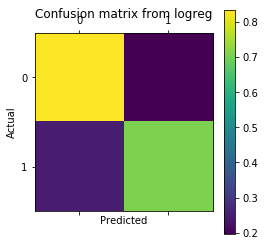

In [11]:
y_pred_logreg= logreg.predict(X_test_scaled)
df_confusion=pd.DataFrame(confusion_matrix(Y_test,y_pred_logreg))

df_conf_norm = df_confusion / df_confusion.sum(axis=1)
df_confusion.index.name='Actual'
df_confusion.columns.name='Predicted'

def plot_confusion_matrix(df_confusion, title='Confusion matrix from logreg', cmap=plt.cm.gray_r):
    plt.matshow(df_confusion) # imshow
    plt.title(title)
    plt.colorbar()
    tick_marks = np.arange(len(df_confusion.columns))
    plt.xticks(tick_marks, df_confusion.columns)
    plt.yticks(tick_marks, df_confusion.index)
    plt.ylabel(df_confusion.index.name)
    plt.xlabel(df_confusion.columns.name)

plot_confusion_matrix(df_conf_norm)

In [12]:
# Logistic regression w/ quadratic + interaction terms + regularization
polynomial_logreg_estimator = make_pipeline(
    PolynomialFeatures(degree=2, include_bias=True),
    LogisticRegressionCV(multi_class="ovr", penalty='l2', cv=5, max_iter=10000))
linearLogCVpoly = polynomial_logreg_estimator.fit(X_train_scaled, Y_train)
# Compare results
print('Polynomial-logistic accuracy: train={:.1%}, test={:.1%}'.format(
    linearLogCVpoly.score(X_train_scaled, Y_train), linearLogCVpoly.score(X_test_scaled, Y_test)))
linearLogCVpoly_train = linearLogCVpoly.score(X_train_scaled, Y_train)
linearLogCVpoly_test = linearLogCVpoly.score(X_test_scaled, Y_test)

Polynomial-logistic accuracy: train=80.9%, test=80.0%


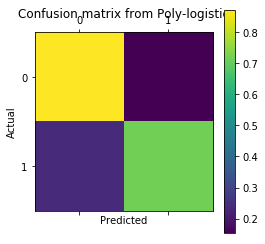

In [85]:
y_pred_PolyL = linearLogCVpoly.predict(X_test_scaled)

df_confusion=pd.DataFrame(confusion_matrix(Y_test,y_pred_PolyL))

df_conf_norm = df_confusion / df_confusion.sum(axis=1)
df_confusion.index.name='Actual'
df_confusion.columns.name='Predicted'

def plot_confusion_matrix(df_confusion, title='Confusion matrix from Poly-logistic', cmap=plt.cm.gray_r):
    plt.matshow(df_confusion) # imshow
    plt.title(title)
    plt.colorbar()
    tick_marks = np.arange(len(df_confusion.columns))
    plt.xticks(tick_marks, df_confusion.columns)
    plt.yticks(tick_marks, df_confusion.index)
    plt.ylabel(df_confusion.index.name)
    plt.xlabel(df_confusion.columns.name)

plot_confusion_matrix(df_conf_norm)

The logistic regression model does a pretty good job of separating bots from legimitate users with just two features. Once more features are used, the model should be able to predict bots with an even higher accuracy.

## LDA and QDA Model

In this section we run LDA and QDA models to classify the users into either bots or legitimate users.

In [86]:
lda = LinearDiscriminantAnalysis(store_covariance=True)
qda = QuadraticDiscriminantAnalysis(store_covariance=True)
lda.fit(X_train_scaled, Y_train)
qda.fit(X_train_scaled, Y_train)
lda.predict(X_test_scaled)
qda.predict(X_test_scaled)

print('LDA accuracy train={:.1%}, test: {:.1%}'.format(
    lda.score(X_train_scaled, Y_train), lda.score(X_test_scaled, Y_test)))

lda_train = lda.score(X_train_scaled, Y_train)
lda_test = lda.score(X_test_scaled, Y_test)

print('QDA accuracy train={:.1%}, test: {:.1%}'.format(
    qda.score(X_train_scaled, Y_train), qda.score(X_test_scaled, Y_test)))

qda_train = qda.score(X_train_scaled, Y_train)
qda_test = qda.score(X_test_scaled, Y_test)

LDA accuracy train=70.6%, test: 70.8%
QDA accuracy train=70.8%, test: 71.1%


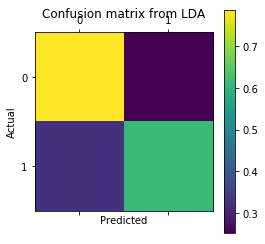

In [87]:
y_pred_lda = lda.predict(X_test_scaled)

df_confusion=pd.DataFrame(confusion_matrix(Y_test,y_pred_lda))

df_conf_norm = df_confusion / df_confusion.sum(axis=1)
df_confusion.index.name='Actual'
df_confusion.columns.name='Predicted'

def plot_confusion_matrix(df_confusion, title='Confusion matrix from LDA', cmap=plt.cm.gray_r):
    plt.matshow(df_confusion) # imshow
    plt.title(title)
    plt.colorbar()
    tick_marks = np.arange(len(df_confusion.columns))
    plt.xticks(tick_marks, df_confusion.columns)
    plt.yticks(tick_marks, df_confusion.index)
    plt.ylabel(df_confusion.index.name)
    plt.xlabel(df_confusion.columns.name)

plot_confusion_matrix(df_conf_norm)

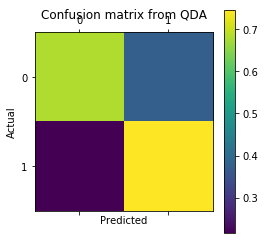

In [88]:
y_pred_qda = qda.predict(X_test_scaled)

df_confusion=pd.DataFrame(confusion_matrix(Y_test,y_pred_qda))

df_conf_norm = df_confusion / df_confusion.sum(axis=1)
df_confusion.index.name='Actual'
df_confusion.columns.name='Predicted'

def plot_confusion_matrix(df_confusion, title='Confusion matrix from QDA', cmap=plt.cm.gray_r):
    plt.matshow(df_confusion) # imshow
    plt.title(title)
    plt.colorbar()
    tick_marks = np.arange(len(df_confusion.columns))
    plt.xticks(tick_marks, df_confusion.columns)
    plt.yticks(tick_marks, df_confusion.index)
    plt.ylabel(df_confusion.index.name)
    plt.xlabel(df_confusion.columns.name)

plot_confusion_matrix(df_conf_norm)

We see here that the LDA and QDA models perform relatively well at separating this data. However, it did not perform as well as the logistic regression method.

## Random forest

In [89]:
ntrees = 50
rf = RandomForestClassifier(n_estimators=ntrees , max_depth=15, max_features='auto')
rf.fit(X_train_scaled, Y_train)
rf_train =rf.score(X_train_scaled, Y_train)
rf_test =rf.score(X_test_scaled, Y_test)

print('RF accuracy train={:.1%}, test: {:.1%}'.format(rf_train,rf_test))
y_pred = rf.predict(X_test_scaled)

df_confusion=pd.DataFrame(confusion_matrix(Y_test,y_pred  ))

df_conf_norm = df_confusion / df_confusion.sum(axis=1)
df_confusion.index.name='Actual'
df_confusion.columns.name='Predicted'

RF accuracy train=99.4%, test: 91.4%


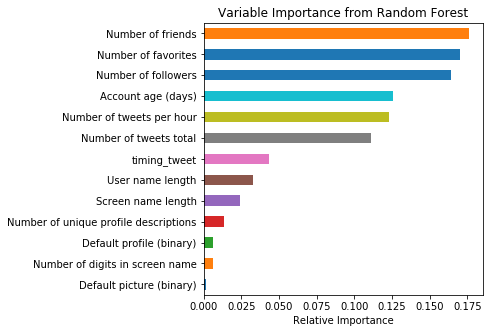

In [90]:
plt.figure(figsize=(5,5))
plt.title('Variable Importance from Random Forest')
plt.xlabel('Relative Importance')
pd.Series(rf.feature_importances_,index=list(X_train_scaled)).sort_values().plot(kind="barh")

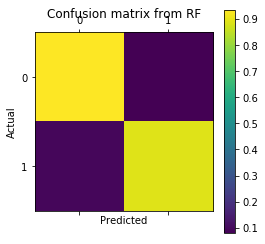

In [91]:
def plot_confusion_matrix(df_confusion, title='Confusion matrix from RF', cmap=plt.cm.gray_r):
    plt.matshow(df_confusion) # imshow
    plt.title(title)
    plt.colorbar()
    tick_marks = np.arange(len(df_confusion.columns))
    plt.xticks(tick_marks, df_confusion.columns)
    plt.yticks(tick_marks, df_confusion.index)
    plt.ylabel(df_confusion.index.name)
    plt.xlabel(df_confusion.columns.name)

plot_confusion_matrix(df_conf_norm)

## Adaboost

In [92]:
adaboost = AdaBoostClassifier(base_estimator=DecisionTreeClassifier(max_depth=5), n_estimators=800, learning_rate=0.01)
adaboost.fit(X_train_scaled, Y_train);

Adaboost Test Accuracy: 94.58%


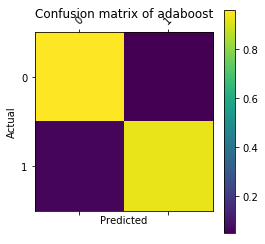

In [93]:
y_pred = adaboost.predict(X_test_scaled)
pred_adaboost = [round(value) for value in y_pred]
accuracy = accuracy_score(Y_test, pred_adaboost)

adaboost_train = adaboost.score(X_train_scaled, Y_train)
adaboost_test = adaboost.score(X_test_scaled, Y_test)

print("Adaboost Test Accuracy: %.2f%%" % (accuracy * 100.0))
df_confusion=pd.DataFrame(confusion_matrix(Y_test,y_pred  ))

df_conf_norm = df_confusion / df_confusion.sum(axis=1)
df_confusion.index.name='Actual'
df_confusion.columns.name='Predicted'

def plot_confusion_matrix(df_confusion, title='Confusion matrix of adaboost', cmap=plt.cm.gray_r):
    plt.matshow(df_confusion) # imshow
    plt.title(title)
    plt.colorbar()
    tick_marks = np.arange(len(df_confusion.columns))
    plt.xticks(tick_marks, df_confusion.columns, rotation=45)
    plt.yticks(tick_marks, df_confusion.index)
    plt.ylabel(df_confusion.index.name)
    plt.xlabel(df_confusion.columns.name)

plot_confusion_matrix(df_conf_norm)


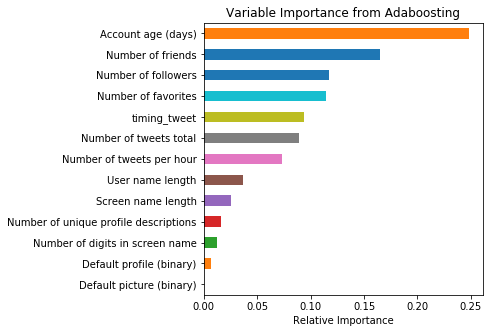

In [94]:
plt.figure(figsize=(5,5))
plt.title('Variable Importance from Adaboosting')
plt.xlabel('Relative Importance')
pd.Series(adaboost.feature_importances_,index=list(X_train_scaled)).sort_values().plot(kind="barh")

Accuracy: 92.22%


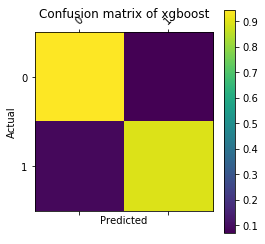

In [95]:
import xgboost as xgb
from sklearn.metrics import confusion_matrix

xgb = xgb.XGBClassifier(max_depth=5, n_estimators=300, learning_rate=0.01).fit(X_train_scaled, Y_train)
y_pred = xgb.predict(X_test_scaled)
predictions = [round(value) for value in y_pred]
accuracy = accuracy_score(Y_test, predictions)

xgb_train = xgb.score(X_train_scaled, Y_train)
xgb_test = xgb.score(X_test_scaled, Y_test)

print("Accuracy: %.2f%%" % (accuracy * 100.0))
df_confusion=pd.DataFrame(confusion_matrix(Y_test,predictions))

df_conf_norm = df_confusion / df_confusion.sum(axis=1)
df_confusion.index.name='Actual'
df_confusion.columns.name='Predicted'

def plot_confusion_matrix(df_confusion, title='Confusion matrix of xgboost', cmap=plt.cm.gray_r):
    plt.matshow(df_confusion) # imshow
    plt.title(title)
    plt.colorbar()
    tick_marks = np.arange(len(df_confusion.columns))
    plt.xticks(tick_marks, df_confusion.columns, rotation=45)
    plt.yticks(tick_marks, df_confusion.index)
    plt.ylabel(df_confusion.index.name)
    plt.xlabel(df_confusion.columns.name)

plot_confusion_matrix(df_conf_norm)

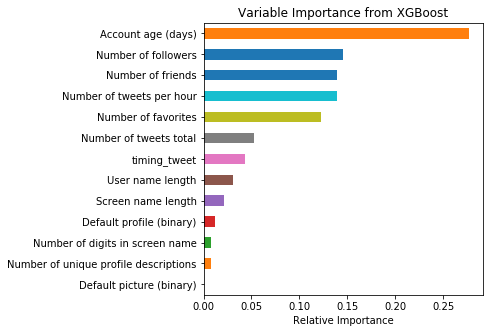

In [96]:
plt.figure(figsize=(5,5))
plt.title('Variable Importance from XGBoost')
plt.xlabel('Relative Importance')
pd.Series(xgb.feature_importances_,index=list(X_train_scaled)).sort_values().plot(kind="barh")

In [98]:
from sklearn.neighbors import KNeighborsClassifier
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import KFold

scores_mean=[]
scores_std=[]

k_number=np.arange(1,40)

for k in range(1,40):
    knn = KNeighborsClassifier(n_neighbors = k)
    score_mean= cross_val_score(knn,X_train_scaled,Y_train,cv=5).mean()
    score_std=cross_val_score(knn,X_train_scaled,Y_train,cv=5).std()
    scores_mean.append(score_mean)

In [99]:
max_score_k=max(scores_mean)
best_k=scores_mean.index(max(scores_mean))+1
print('Best K=',best_k, 'with a max CV score of',max_score_k)

knn_best_k = KNeighborsClassifier(n_neighbors = best_k)
knn_best_k.fit(X_train_scaled,Y_train);

pred_best_k = knn_best_k.predict(X_test_scaled)

print('test accuracy',accuracy_score(Y_test, pred_best_k))

knn_best_k_train = knn_best_k.score(X_train_scaled, Y_train)
knn_best_k_test = knn_best_k.score(X_test_scaled, Y_test)

Best K= 8 with a max CV score of 0.7114063374922827
test accuracy 0.718296224588577


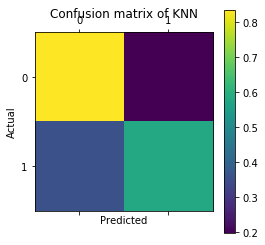

In [100]:
df_confusion=pd.DataFrame(confusion_matrix(Y_test,pred_best_k ))

df_conf_norm = df_confusion / df_confusion.sum(axis=1)
df_confusion.index.name='Actual'
df_confusion.columns.name='Predicted'

def plot_confusion_matrix(df_confusion, title='Confusion matrix of KNN', cmap=plt.cm.gray_r):
    plt.matshow(df_confusion) # imshow
    plt.title(title)
    plt.colorbar()
    tick_marks = np.arange(len(df_confusion.columns))
    plt.xticks(tick_marks, df_confusion.columns)
    plt.yticks(tick_marks, df_confusion.index)
    plt.ylabel(df_confusion.index.name)
    plt.xlabel(df_confusion.columns.name)

plot_confusion_matrix(df_conf_norm)

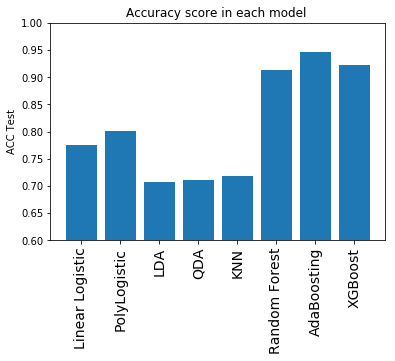

In [101]:
acc_scores=[accuracy_score(logreg.predict(X_test_scaled), Y_test),linearLogCVpoly.score(X_test_scaled, Y_test),lda.score(X_test_scaled, Y_test),qda.score(X_test_scaled, Y_test),accuracy_score(Y_test, pred_best_k),rf.score(X_test_scaled, Y_test),accuracy_score(Y_test, pred_adaboost),accuracy_score(Y_test, predictions)]

xx = [1,2,3,4,5,6,7,8]
index_name=['Linear Logistic','PolyLogistic', 'LDA','QDA','KNN','Random Forest','AdaBoosting','XGBoost']
plt.bar(xx, acc_scores)
plt.ylim(0.6,1)
plt.title('Accuracy score in each model ')
plt.ylabel('ACC Test')
plt.xticks(xx,index_name,rotation=90,fontsize = 14);

## Support Vector Machines

In this section we will use a support vector machine technique to separate the data.

In [29]:
def plot_decision_boundary(x, y, model, title, ax, bounds=(0, 6), poly_flag=False):
    # Plot data
    ax.scatter(x[y == 1, 0], x[y == 1, 1], c='green')
    ax.scatter(x[y == 0, 0], x[y == 0, 1], c='gray', alpha=0.3)
    
    # Create mesh
    interval = np.arange(bounds[0], bounds[1], 0.01)
    n = np.size(interval)
    x1, x2 = np.meshgrid(interval, interval)
    x1 = x1.reshape(-1, 1)
    x2 = x2.reshape(-1, 1)
    xx = np.concatenate((x1, x2), axis=1)

    # Predict on mesh points
    if(poly_flag):
        quad_features = preprocessing.PolynomialFeatures(degree=2)
        xx = quad_features.fit_transform(xx)
        
    yy = model.predict(xx)    
    yy = yy.reshape((n, n))

    # Plot decision surface
    x1 = x1.reshape(n, n)
    x2 = x2.reshape(n, n)
    ax.contourf(x1, x2, yy, alpha=0.1, cmap='Greens')
    
    # Label axes, set title
    ax.set_title(title)
    ax.set_xlabel('Latitude')
    ax.set_ylabel('Longitude')
    
    return ax

In [30]:
def fit_and_plot_svm_for_c(x_train, y_train, x_test, y_test, C):
    # Fit SVM model
    model = svm.SVC(C=C, kernel='linear')
    model.fit(x_train, y_train)
    
    # Train and test error
    tr_acc = model.score(x_train, y_train)
    ts_acc = model.score(x_test, y_test)

    # Plot decision boundary
    #plot_decision_boundary(x_train, y_train, model, \
    #                       'C = ' + str(C)\
    #                       + ', train acc = ' + str(tr_acc)\
    #                       + ', test acc = ' + str(ts_acc), ax, bounds)
    
    # Plot support vectors
    #sv_indices = model.support_ # retrieve the support vector indices
    #ax.scatter(x_train[sv_indices, 0], x_train[sv_indices, 1], color='red', alpha=0.15, s=100) # draw circles around SVs
    
    return tr_acc, ts_acc

In [ ]:
# Fit and plot for different 'C' values
tr1, ts1 = fit_and_plot_svm_for_c(X_train, Y_train, X_test, Y_test, 0.1)
print(tr1,ts1)

tr2, ts2 = fit_and_plot_svm_for_c(X_train, Y_train, X_test, Y_test, 0.5)
print(tr2,ts2)

tr3, ts3 = fit_and_plot_svm_for_c(X_train, Y_train, X_test, Y_test, 1)
print(tr3,ts3)

tr4, ts4 = fit_and_plot_svm_for_c(X_train, Y_train, X_test, Y_test, 10)
print(tr4,ts4)

tr5, ts5 = fit_and_plot_svm_for_c(X_train, Y_train, X_test, Y_test, 100)
print(tr5,ts5)

tr6, ts6 = fit_and_plot_svm_for_c(X_train, Y_train, X_test, Y_test, 1000)
print(tr6,ts6)

#plt.tight_layout()

In [ ]:
def fit_and_plot_svm_for_poly_c(X_train_log, Y_train, X_test_log, Y_test, C, degree = 2):
    # Fit SVM model
    model = svm.SVC(C=C, kernel='poly', degree=degree)
    model.fit(X_train, Y_train)
    
    # Train and test error
    tr_acc = model.score(X_train, Y_train)
    ts_acc = model.score(X_test, Y_test)

    # Plot decision boundary
    #plot_decision_boundary(X_train, Y_train, model, \
    #                       'C = ' + str(C)\
    ##                       + ', train acc = ' + str(tr_acc)\
     #                      + ', test acc = ' + str(ts_acc), ax, bounds)
    
    # Plot support vectors
    #sv_indices = model.support_ # retrieve the support vector indices
    #ax.scatter(X_train_log[sv_indices, 0], X_train[sv_indices, 1], color='red', alpha=0.15, s=100) # draw circles around SVs
    
    return tr_acc, ts_acc

In [ ]:
# Fit and plot for different 'C' values when polynomial degree is 2
#fig, ax = plt.subplots(2, 3, figsize = (15, 10))

deg = 4

tr7, ts7 = fit_and_plot_svm_for_poly_c(X_train, Y_train, X_test, Y_test, 0.5, degree = deg)
print(tr7,ts7)

tr8, ts8 = fit_and_plot_svm_for_poly_c(X_train, Y_train, X_test, Y_test, 1, degree = deg)
print(tr8,ts8)

tr9, ts9 = fit_and_plot_svm_for_poly_c(X_train, Y_train, X_test, Y_test, 10, degree = deg)
print(tr9,ts9)

tr10, ts10  = fit_and_plot_svm_for_poly_c(X_train, Y_train, X_test, Y_test, 100, degree = deg)
print(tr10,ts10)

tr11, ts11 = fit_and_plot_svm_for_poly_c(X_train, Y_train, X_test, Y_test, 1000, degree = deg)
print(tr11,ts11)

tr12, ts12 = fit_and_plot_svm_for_poly_c(X_train, Y_train, X_test, Y_test, 10000, degree = deg)
print(tr12,ts12)

#plt.tight_layout()

In [ ]:
# Fit and plot for different degrees for polynomial boundary...this takes a while
#fig, ax = plt.subplots(2, 2, figsize = (15, 10))

tr13,ts13 = fit_and_plot_svm_for_poly_c(X_train, Y_train, X_test, Y_test, 1000, degree = 1)
print(tr13,ts13)

tr14, ts14 = fit_and_plot_svm_for_poly_c(X_train, Y_train, X_test, Y_test, 1000, degree = 2)
print(tr14,ts14)

tr15, ts15 = fit_and_plot_svm_for_poly_c(X_train, Y_train, X_test, Y_test, 1000, degree = 3)
print(tr15,ts15)

tr16,ts16 = fit_and_plot_svm_for_poly_c(X_train, Y_train, X_test, Y_test, 1000, degree = 4)
print(tr16,ts16)

#plt.tight_layout()

In [ ]:
# What about other kernels?
def fit_and_plot_svm_for_kernels(x_train, y_train, x_test, y_test, C, kernel = 'rbf'):
    # Fit SVM model
    model = svm.SVC(C=C, kernel=kernel)
    model.fit(X_train, Y_train)
    
    # Train and test error
    tr_acc = model.score(X_train, Y_train)
    ts_acc = model.score(X_test, Y_test)

    # Plot decision boundary
    #plot_decision_boundary(x_train, y_train, model, \
    #                       'C = ' + str(C)\
    #                       + ', train acc = ' + str(tr_acc)\
    #                       + ', test acc = ' + str(ts_acc), ax, bounds)
   # 
    # Plot support vectors
    #sv_indices = model.support_ # retrieve the support vector indices
    #ax.scatter(x_train[sv_indices, 0], x_train[sv_indices, 1], color='red', alpha=0.15, s=100) # draw circles around SVs
    
    return tr_acc, ts_acc

In [ ]:
#fig, ax = plt.subplots(2, 3, figsize = (15, 10))

tr17, ts17 = fit_and_plot_svm_for_kernels(X_train, Y_train, X_test, Y_test, 100, kernel = "poly")
print(tr17,ts17)

tr18, ts18 = fit_and_plot_svm_for_kernels(X_train, Y_train, X_test, Y_test, 100, kernel = "rbf")
print(tr18,ts18)

tr19, ts19 = fit_and_plot_svm_for_kernels(X_train, Y_train, X_test, Y_test, 100, kernel = "sigmoid")
print(tr19,ts19)

tr20, ts20 = fit_and_plot_svm_for_kernels(X_train, Y_train, X_test, Y_test, 1000, kernel = "poly")
print(tr20,ts20)

tr21, ts21 = fit_and_plot_svm_for_kernels(X_train, Y_train, X_test, Y_test, 1000, kernel = "rbf")
print(tr21,ts21)

tr22, ts22 = fit_and_plot_svm_for_kernels(X_train, Y_train, X_test, Y_test, 1000, kernel = "sigmoid")
print(tr22, ts22)

#plt.tight_layout()

## Stacked Model

Model stacking is an efficient ensemble method in which the predictions, generated by using various machine learning algorithms, are used as inputs in a second-layer learning algorithm. This second-layer algorithm is trained to optimally combine the model predictions to form a new set of predictions. For example, when linear regression is used as second-layer modeling, it estimates these weights by minimizing the least square errors. However, the second-layer modeling is not restricted to only linear models; the relationship between the predictors can be more complex, opening the door to employing other machine learning algorithms.

![title](modelstacking.png)

Ensemble modeling and model stacking are especially popular in data science competitions, in which a sponsor posts a training set (which includes labels) and a test set (which does not include labels) and issues a global challenge to produce the best predictions of the test set for a specified performance criterion. The winning teams almost always use ensemble models instead of a single fine-tuned model. Often individual teams develop their own ensemble models in the early stages of the competition, and then join their forces in the later stages. 

Another popular data science competition is the KDD Cup. The following figure shows the winning solution for the 2015 competition, which used a three-stage stacked modeling approach. A similar approach will be trialed for this project to try and obtain maximal predictive capability.

![title](stackedapproach.png)

The figure shows that a diverse set of 64 single models were used to build the model library. These models are trained by using various machine learning algorithms. For example, the green boxes represent gradient boosting models (GBM), pink boxes represent neural network models (NN), and orange boxes represent factorization machines models (FM). You can see that there are multiple gradient boosting models in the model library; they probably vary in their use of different hyperparameter settings and/or feature sets.

A simple way to enhance diversity is to train models by using different machine learning algorithms. For example, adding a factorization model to a set of tree-based models (such as random forest and gradient boosting) provides a nice diversity because a factorization model is trained very differently than decision tree models are trained. For the same machine learning algorithm, you can enhance diversity by using different hyperparameter settings and subsets of variables. If you have many features, one efficient method is to choose subsets of the variables by simple random sampling.

Overfitting is an especially big problem in model stacking, because so many predictors that all predict the same target are combined. Overfitting is partially caused by this collinearity between the predictors. The most efficient techniques for training models (especially during the stacking stages) include using cross validation and some form of regularization. A good paper that outlines this procedure is [Stacked Ensemble Models for Improved Prediction Accuracy](https://support.sas.com/resources/papers/proceedings17/SAS0437-2017.pdf).

That paper also shows how you can generate a diverse set of models by various methods (such as forests, gradient boosted decision trees, factorization machines, and logistic regression) and then combine them with stacked ensemble techniques such regularized regression methods, gradient boosting, and hill climbing methods.

![title](levels.png)

Applying stacked models to real-world big data problems can produce greater prediction accuracy and robustness than do individual models. The model stacking approach is powerful and compelling enough to alter your initial data mining mindset from finding the single best model to finding a collection of really good complementary models. Of course, this method does involve additional cost both because you need to train a large number of models and because you need to use cross validation to avoid overfitting.

## Stacked Model

In this section we will try to implement a stacked model similar to that proposed in the "[Stacked Ensemble Models for Improved Prediction Accuracy](https://support.sas.com/resources/papers/proceedings17/SAS0437-2017.pdf)" paper.

In [102]:
# Going to use these 5 base models for the stacking
from sklearn.ensemble import (RandomForestClassifier, AdaBoostClassifier, 
                              GradientBoostingClassifier, ExtraTreesClassifier)
from sklearn.svm import SVC

### Pearson Correlation Heatmap

Let us generate some correlation plots of the features to see how related one feature is to the next. To do so, we will utilise the Seaborn plotting package which allows us to plot heatmaps very conveniently as follows

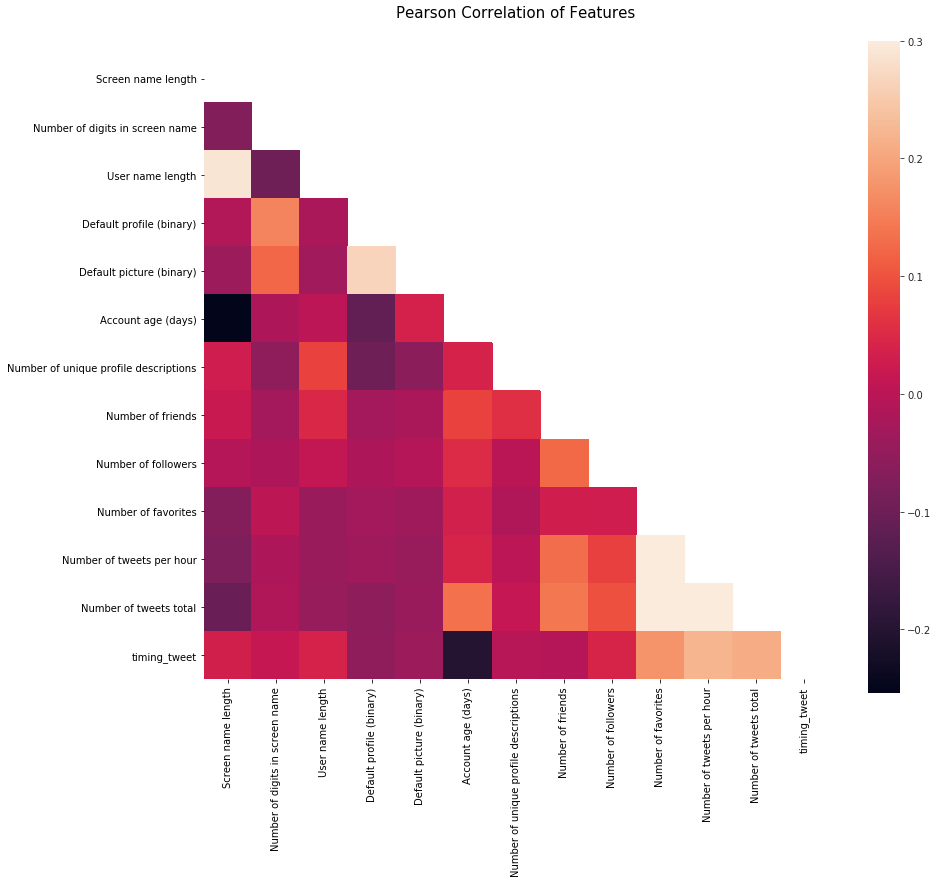

In [103]:
colormap = plt.cm.RdBu
plt.figure(figsize=(14,12))
plt.title('Pearson Correlation of Features', y=1.05, size=15)
# Generate a mask for the upper triangle
corr = X_train_scaled.astype(float).corr()
mask = np.zeros_like(corr, dtype=np.bool)
mask[np.triu_indices_from(mask)] = True
#mask = np.zeros_like(X_train_scaled)
#mask[np.triu_indices_from(mask)] = True
with sns.axes_style("white"):
    ax = sns.heatmap(corr, mask=mask, vmax=.3, square=True)
#sns.heatmap(X_train_scaled.astype(float).corr(),linewidths=0.1,vmax=1.0,
#            square=True, cmap=colormap, linecolor='white', annot=True)

One thing that that the Pearson Correlation plot can tell us is that there are not too many features strongly correlated with one another. This is good from a point of view of feeding these features into your learning model because this means that there isn't much redundant or superfluous data in our training set and we are happy that each feature carries with it some unique information. Here the most correlated features are that of `number of tweets per hour` and `number of tweets total` which are both correlated with `timing_tweet`. I'll still leave both features in because this correlation is still relatively low.

### Pairplots

Now let us generate some pairplots to observe the distribution of data from one feature to the other. Once again we use Seaborn to help us.

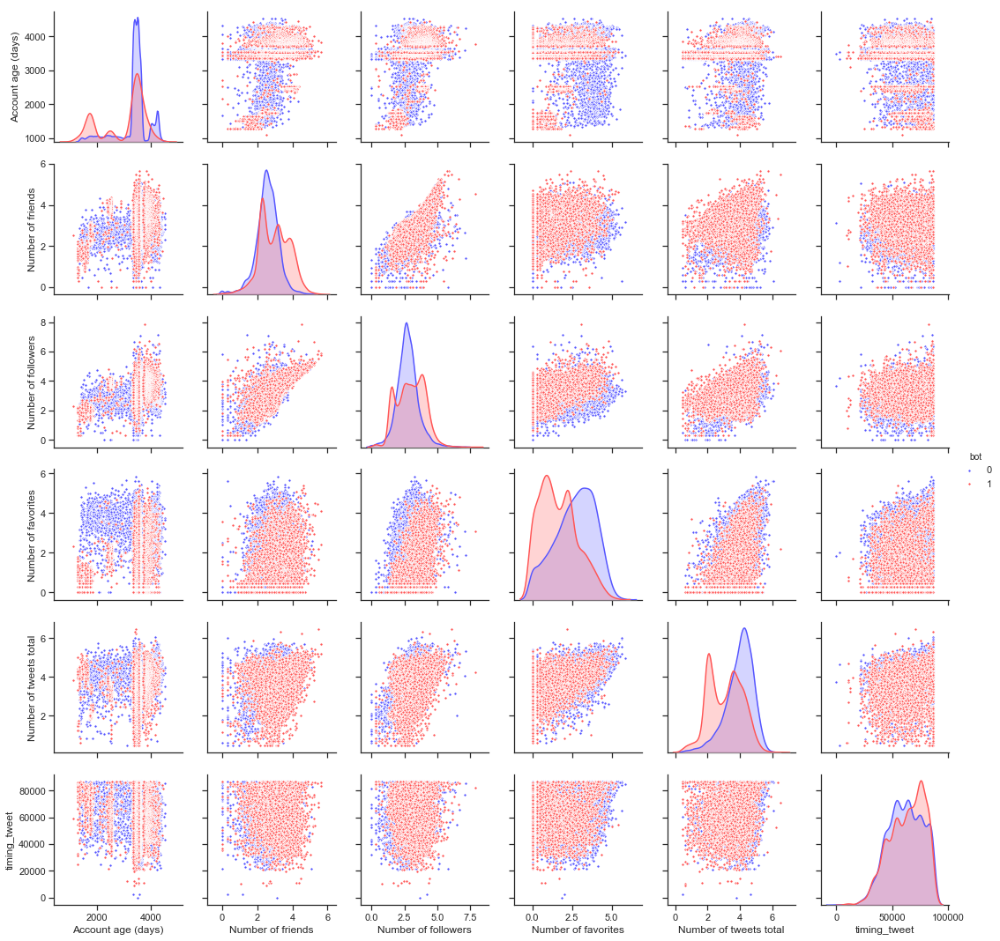

In [104]:
pairplot_df = total_df.copy()
pairplot_df['Number of friends'] = np.log10(pairplot_df['Number of friends'])
pairplot_df['Number of followers'] = np.log10(pairplot_df['Number of followers'])
pairplot_df['Number of favorites'] = np.log10(pairplot_df['Number of favorites'])
pairplot_df['Number of tweets total'] = np.log10(pairplot_df['Number of tweets total'])

sns.set(style="ticks", color_codes=True)
g = sns.pairplot(pairplot_df, vars=[u'Account age (days)', 'Number of friends', u'Number of followers', u'Number of favorites', u'Number of tweets total', u'timing_tweet'],
                 hue='bot', palette = 'seismic',diag_kind = 'kde',diag_kws=dict(shade=True),plot_kws=dict(s=10))
#g.set(xticklabels=[])

## Helpers via Python Classes

In the section of code below, we essentially write a class SklearnHelper that allows one to extend the inbuilt methods (such as train, predict and fit) common to all the Sklearn classifiers. Therefore this cuts out redundancy as won't need to write the same methods five times if we wanted to invoke five different classifiers.

In [105]:
# Some useful parameters which will come in handy later on
ntrain = X_train_scaled.shape[0]
ntest = X_test_scaled.shape[0]
SEED = 99 # for reproducibility
NFOLDS = 5 # set folds for out-of-fold prediction

kf = KFold(n_splits = NFOLDS, random_state=SEED)

# Class to extend the Sklearn classifier
class SklearnHelper(object):
    def __init__(self, clf, seed=0, params=None):
        params['random_state'] = seed
        self.clf = clf(**params)

    def train(self, x_train, y_train):
        self.clf.fit(x_train, y_train)

    def predict(self, x):
        return self.clf.predict(x)
    
    def fit(self,x,y):
        return self.clf.fit(x,y)
    
    def feature_importances(self,x,y):
            print(self.clf.fit(x,y).feature_importances_)
    
# Class to extend XGboost classifer

**def init :** Python standard for invoking the default constructor for the class. This means that when you want to create an object (classifier), you have to give it the parameters of clf (what sklearn classifier you want), seed (random seed) and params (parameters for the classifiers).

The rest of the code are simply methods of the class which simply call the corresponding methods already existing within the sklearn classifiers. Essentially, we have created a wrapper class to extend the various Sklearn classifiers so that this should help us reduce having to write the same code over and over when we implement multiple learners to our stacker.

### Out-of-Fold Predictions

Stacking uses predictions of base classifiers as input for training to a second-level model. However one cannot simply train the base models on the full training data, generate predictions on the full test set and then output these for the second-level training. This runs the risk of your base model predictions already having "seen" the test set and therefore overfitting when feeding these predictions.

In [106]:
def get_oof(clf, x_train, y_train, x_test):
    oof_train = np.zeros((ntrain,))
    oof_test = np.zeros((ntest,))
    oof_test_skf = np.empty((NFOLDS, ntest))

    for i, (train_index, test_index) in enumerate(kf.split(x_train)):

        x_tr = x_train.iloc[train_index]
        y_tr = y_train.iloc[train_index]
        x_te = x_train.iloc[test_index]
        clf.train(x_tr, y_tr)

        oof_train[test_index] = clf.predict(x_te)
        oof_test_skf[i, :] = clf.predict(x_test)

    oof_test[:] = oof_test_skf.mean(axis=0)
    return oof_train.reshape(-1, 1), oof_test.reshape(-1, 1)

### Generating our Base First-Level Models

So now let us prepare five learning models as our first level classification. These models can all be conveniently invoked via the Sklearn library and are listed as follows:

- **Random Forest classifier**
- **Extra Trees classifier**
- **AdaBoost classifer**
- **Gradient Boosting classifer**
- **Support Vector Machine**

**Parameters**

**n_jobs :** Number of cores used for the training process. If set to -1, all cores are used.

**n_estimators :** Number of classification trees in your learning model ( set to 10 per default)

**max_depth :** Maximum depth of tree, or how much a node should be expanded. Beware if set to too high a number would run the risk of overfitting as one would be growing the tree too deep

**verbose :** Controls whether you want to output any text during the learning process. A value of 0 suppresses all text while a value of 3 outputs the tree learning process at every iteration.

In [107]:
# Put in our parameters for said classifiers
# Random Forest parameters
rf_params = {
    'n_jobs': -1,
    'n_estimators': 500,
     'warm_start': True, 
     #'max_features': 0.2,
    'max_depth': 6,
    'min_samples_leaf': 2,
    'max_features' : 'sqrt',
    'verbose': 0
}

# Extra Trees Parameters
et_params = {
    'n_jobs': -1,
    'n_estimators':500,
    #'max_features': 0.5,
    'max_depth': 4,
    'min_samples_leaf': 2,
    'verbose': 0
}

# AdaBoost parameters
ada_params = {
    'n_estimators': 500,
    'learning_rate' : 0.75
}

# Gradient Boosting parameters
gb_params = {
    'n_estimators': 500,
     #'max_features': 0.2,
    'max_depth': 5,
    'min_samples_leaf': 2,
    'verbose': 0
}

# Support Vector Classifier parameters 
svc_params = {
    'kernel' : 'sigmoid',
    'C' : 0.1
    }

logreg_params = {'C':100000, 'fit_intercept': True}
lda_params = {'store_covariance': True}
qda_params = {'store_covariance': True}
polylogreg_params = {}

Let us now create 5 objects that represent our 5 learning models via our Helper Sklearn Class we defined earlier.

In [108]:
# Create 5 objects that represent our 4 models
rf = SklearnHelper(clf=RandomForestClassifier, seed=SEED, params=rf_params)
et = SklearnHelper(clf=ExtraTreesClassifier, seed=SEED, params=et_params)
ada = SklearnHelper(clf=AdaBoostClassifier, seed=SEED, params=ada_params)
gb = SklearnHelper(clf=GradientBoostingClassifier, seed=SEED, params=gb_params)
svc = SklearnHelper(clf=SVC, seed=SEED, params=svc_params)
logreg_stack = SklearnHelper(clf=LogisticRegression, seed=SEED, params=logreg_params)
#lda_stack = SklearnHelper(clf=LinearDiscriminantAnalysis, params=lda_params)
#qda_stack = SklearnHelper(clf=QuadraticDiscriminantAnalysis, params=qda_params)
#polylogreg_stack = SklearnHelper(clf=polynomial_logreg_estimator, seed=SEED, params=polylogreg_params)

### Output of the First level Predictions

We now feed the training and test data into our 5 base classifiers and use the Out-of-Fold prediction function we defined earlier to generate our first level predictions. Allow a handful of minutes for the chunk of code below to run.

In [109]:
# Create our OOF train and test predictions. These base results will be used as new features
et_oof_train, et_oof_test = get_oof(et, X_train_scaled, Y_train, X_test_scaled) # Extra Trees
rf_oof_train, rf_oof_test = get_oof(rf,X_train_scaled, Y_train, X_test_scaled) # Random Forest
ada_oof_train, ada_oof_test = get_oof(ada, X_train_scaled, Y_train, X_test_scaled) # AdaBoost 
gb_oof_train, gb_oof_test = get_oof(gb,X_train_scaled, Y_train, X_test_scaled) # Gradient Boost
svc_oof_train, svc_oof_test = get_oof(svc,X_train_scaled, Y_train, X_test_scaled) # Support Vector Classifier
logreg_oof_train, logreg_oof_test = get_oof(logreg_stack,X_train_scaled, Y_train, X_test_scaled) # Linear Logistic Regression
#lda_oof_train, lda_oof_test = get_oof(lda_stack,X_train_scaled, Y_train, X_test_scaled) # LDA
#qda_oof_train, qda_oof_test = get_oof(qda_stack,X_train_scaled, Y_train, X_test_scaled) # QDA
#polylogreg_oof_train, polylogreg_oof_test = get_oof(polylogreg_stack,X_train_scaled, Y_train, X_test_scaled) # Polynomial Logistic Regression

print("Training is complete")

Training is complete


### Feature importances generated from the different classifiers

Now having learned our the first-level classifiers, we can utilise a very nifty feature of the Sklearn models and that is to output the importances of the various features in the training and test sets with one very simple line of code.

As per the Sklearn documentation, most of the classifiers are built in with an attribute which returns feature importances by simply typing in .featureimportances. Therefore we will invoke this very useful attribute via our function earliand plot the feature importances as such

In [110]:
rf_feature = rf.feature_importances(X_train_scaled,Y_train);
et_feature = et.feature_importances(X_train_scaled, Y_train);
ada_feature = ada.feature_importances(X_train_scaled, Y_train);
gb_feature = gb.feature_importances(X_train_scaled,Y_train);

[0.01040077 0.00271345 0.02571925 0.00269657 0.00062294 0.11067271
 0.00524144 0.19651664 0.15383554 0.22888341 0.13083209 0.11240919
 0.01945599]
[0.1851489  0.02698042 0.11626441 0.02168347 0.00496865 0.31242358
 0.02762129 0.07809107 0.00762381 0.07623999 0.04850533 0.06264847
 0.03180063]
[0.008 0.014 0.012 0.002 0.    0.666 0.016 0.06  0.038 0.03  0.06  0.06
 0.034]
[5.58484420e-03 2.58457182e-03 6.06856077e-03 1.18974807e-03
 1.64445226e-04 2.16018516e-01 2.26869048e-03 2.54855733e-01
 1.05620892e-01 2.65655795e-01 7.26437428e-02 5.64419007e-02
 1.09025601e-02]


In [111]:
rf_feature = [0.01040077, 0.00271345, 0.02571925, 0.00269657, 0.00062294, 0.11067271, 0.00524144,
              0.19651664, 0.15383554, 0.22888341, 0.13083209, 0.11240919, 0.01945599]
et_feature = [0.1851489,  0.02698042, 0.11626441, 0.02168347, 0.00496865, 0.31242358, 0.02762129,
              0.07809107, 0.00762381, 0.07623999, 0.04850533, 0.06264847, 0.03180063]
ada_feature = [0.008, 0.014, 0.012, 0.002, 0.,    0.666, 0.016, 0.06,  0.038, 0.03,  0.06,  0.06, 0.034]
gb_feature = [5.58484420e-03, 2.58457182e-03, 6.06856077e-03, 1.18974807e-03, 1.64445226e-04,
              2.16018516e-01, 2.26869048e-03, 2.54855733e-01, 1.05620892e-01, 2.65655795e-01,
              7.26437428e-02, 5.64419007e-02, 1.09025601e-02]

In [112]:
cols = X_train_scaled.columns.values
display(cols)
# Create a dataframe with features
feature_dataframe = pd.DataFrame( {'features': cols,
     'Random Forest feature importances': rf_feature,
     'Extra Trees  feature importances': et_feature,
      'AdaBoost feature importances': ada_feature,
    'Gradient Boost feature importances': gb_feature
    })

feature_dataframe

array(['Screen name length', 'Number of digits in screen name',
       'User name length', 'Default profile (binary)',
       'Default picture (binary)', 'Account age (days)',
       'Number of unique profile descriptions', 'Number of friends',
       'Number of followers', 'Number of favorites',
       'Number of tweets per hour', 'Number of tweets total',
       'timing_tweet'], dtype=object)

,AdaBoost feature importances,Extra Trees feature importances,Gradient Boost feature importances,Random Forest feature importances,features
0,0.008,0.185149,0.005585,0.010401,Screen name length
1,0.014,0.026980,0.002585,0.002713,Number of digits in screen name
2,0.012,0.116264,0.006069,0.025719,User name length
3,0.002,0.021683,0.001190,0.002697,Default profile (binary)
4,0.000,0.004969,0.000164,0.000623,Default picture (binary)
5,0.666,0.312424,0.216019,0.110673,Account age (days)
6,0.016,0.027621,0.002269,0.005241,Number of unique profile descriptions
7,0.060,0.078091,0.254856,0.196517,Number of friends
8,0.038,0.007624,0.105621,0.153836,Number of followers
9,0.030,0.076240,0.265656,0.228883,Number of favorites


In [113]:
import plotly
import plotly.offline as py
py.init_notebook_mode(connected=True)
import plotly.graph_objs as go
import plotly.tools as tls

In [114]:
# Scatter plot 
trace = go.Scatter(
    y = feature_dataframe['Random Forest feature importances'].values,
    x = feature_dataframe['features'].values,
    mode='markers',
    marker=dict(
        sizemode = 'diameter',
        sizeref = 1,
        size = 25,
#       size= feature_dataframe['AdaBoost feature importances'].values,
        #color = np.random.randn(500), #set color equal to a variable
        color = feature_dataframe['Random Forest feature importances'].values,
        colorscale='Portland',
        showscale=True
    ),
    text = feature_dataframe['features'].values
)
data = [trace]


layout= go.Layout(
    autosize= True,
    title= 'Random Forest Feature Importance',
    hovermode= 'closest',
#     xaxis= dict(
#         title= 'Pop',
#         ticklen= 5,
#         zeroline= False,
#         gridwidth= 2,
#     ),
    yaxis=dict(
        title= 'Feature Importance',
        ticklen= 5,
        gridwidth= 2
    ),
    showlegend= False
)
fig = go.Figure(data=data, layout=layout)
py.iplot(fig,filename='scatter2010')

# Scatter plot 
trace = go.Scatter(
    y = feature_dataframe['Extra Trees  feature importances'].values,
    x = feature_dataframe['features'].values,
    mode='markers',
    marker=dict(
        sizemode = 'diameter',
        sizeref = 1,
        size = 25,
#       size= feature_dataframe['AdaBoost feature importances'].values,
        #color = np.random.randn(500), #set color equal to a variable
        color = feature_dataframe['Extra Trees  feature importances'].values,
        colorscale='Portland',
        showscale=True
    ),
    text = feature_dataframe['features'].values
)
data = [trace]

layout= go.Layout(
    autosize= True,
    title= 'Extra Trees Feature Importance',
    hovermode= 'closest',
#     xaxis= dict(
#         title= 'Pop',
#         ticklen= 5,
#         zeroline= False,
#         gridwidth= 2,
#     ),
    yaxis=dict(
        title= 'Feature Importance',
        ticklen= 5,
        gridwidth= 2
    ),
    showlegend= False
)
fig = go.Figure(data=data, layout=layout)
py.iplot(fig,filename='scatter2010')

# Scatter plot 
trace = go.Scatter(
    y = feature_dataframe['AdaBoost feature importances'].values,
    x = feature_dataframe['features'].values,
    mode='markers',
    marker=dict(
        sizemode = 'diameter',
        sizeref = 1,
        size = 25,
#       size= feature_dataframe['AdaBoost feature importances'].values,
        #color = np.random.randn(500), #set color equal to a variable
        color = feature_dataframe['AdaBoost feature importances'].values,
        colorscale='Portland',
        showscale=True
    ),
    text = feature_dataframe['features'].values
)
data = [trace]

layout= go.Layout(
    autosize= True,
    title= 'AdaBoost Feature Importance',
    hovermode= 'closest',
#     xaxis= dict(
#         title= 'Pop',
#         ticklen= 5,
#         zeroline= False,
#         gridwidth= 2,
#     ),
    yaxis=dict(
        title= 'Feature Importance',
        ticklen= 5,
        gridwidth= 2
    ),
    showlegend= False
)
fig = go.Figure(data=data, layout=layout)
py.iplot(fig,filename='scatter2010')

# Scatter plot 
trace = go.Scatter(
    y = feature_dataframe['Gradient Boost feature importances'].values,
    x = feature_dataframe['features'].values,
    mode='markers',
    marker=dict(
        sizemode = 'diameter',
        sizeref = 1,
        size = 25,
#       size= feature_dataframe['AdaBoost feature importances'].values,
        #color = np.random.randn(500), #set color equal to a variable
        color = feature_dataframe['Gradient Boost feature importances'].values,
        colorscale='Portland',
        showscale=True
    ),
    text = feature_dataframe['features'].values
)
data = [trace]

layout= go.Layout(
    autosize= True,
    title= 'Gradient Boosting Feature Importance',
    hovermode= 'closest',
#     xaxis= dict(
#         title= 'Pop',
#         ticklen= 5,
#         zeroline= False,
#         gridwidth= 2,
#     ),
    yaxis=dict(
        title= 'Feature Importance',
        ticklen= 5,
        gridwidth= 2
    ),
    showlegend= False
)
fig = go.Figure(data=data, layout=layout)
py.iplot(fig,filename='scatter2010')

In [115]:
# Create the new column containing the average of values
feature_dataframe['mean'] = feature_dataframe.mean(axis= 1) # axis = 1 computes the mean row-wise
feature_dataframe.head(3)

,AdaBoost feature importances,Extra Trees feature importances,Gradient Boost feature importances,Random Forest feature importances,features,mean
0,0.008,0.185149,0.005585,0.010401,Screen name length,0.052284
1,0.014,0.026980,0.002585,0.002713,Number of digits in screen name,0.011570
2,0.012,0.116264,0.006069,0.025719,User name length,0.040013


### Plotly Barplot of Average Feature Importances

Having obtained the mean feature importance across all our classifiers, we can plot them into a Plotly bar plot as follows:

In [116]:
y = feature_dataframe['mean'].values
x = feature_dataframe['features'].values
data = [go.Bar(
            x= x,
             y= y,
            width = 0.5,
            marker=dict(
               color = feature_dataframe['mean'].values,
            colorscale='Portland',
            showscale=True,
            reversescale = False
            ),
            opacity=0.6
        )]

layout= go.Layout(
    autosize= True,
    title= 'Barplots of Mean Feature Importance',
    hovermode= 'closest',
#     xaxis= dict(
#         title= 'Pop',
#         ticklen= 5,
#         zeroline= False,
#         gridwidth= 2,
#     ),
    yaxis=dict(
        title= 'Feature Importance',
        ticklen= 5,
        gridwidth= 2
    ),
    showlegend= False
)
fig = go.Figure(data=data, layout=layout)
py.iplot(fig, filename='bar-direct-labels')

## Second-Level Predictions from the First-level Output

### First-level output as new features

Having now obtained our first-level predictions, one can think of it as essentially building a new set of features to be used as training data for the next classifier. As per the code below, we are therefore having as our new columns the first-level predictions from our earlier classifiers and we train the next classifier on this.

In [117]:
base_predictions_train = pd.DataFrame( {'RandomForest': rf_oof_train.ravel(),
     'ExtraTrees': et_oof_train.ravel(),
     'AdaBoost': ada_oof_train.ravel(),
      'GradientBoost': gb_oof_train.ravel(),
        'Logistic Regression': logreg_oof_train.ravel()
    })
display(base_predictions_train.head())

base_predictions_test = pd.DataFrame( {'RandomForest': rf_oof_test.ravel(),
     'ExtraTrees': et_oof_test.ravel(),
     'AdaBoost': ada_oof_test.ravel(),
      'GradientBoost': gb_oof_test.ravel(),
        'Logistic Regression': logreg_oof_test.ravel()
    })
base_predictions_test.head()


,AdaBoost,ExtraTrees,GradientBoost,Logistic Regression,RandomForest
0,0.0,0.0,0.0,0.0,0.0
1,0.0,0.0,0.0,0.0,0.0
2,0.0,0.0,0.0,0.0,0.0
3,0.0,0.0,0.0,0.0,0.0
4,0.0,0.0,0.0,0.0,0.0


,AdaBoost,ExtraTrees,GradientBoost,Logistic Regression,RandomForest
0,0.0,0.0,0.0,0.0,0.0
1,1.0,0.0,1.0,1.0,1.0
2,0.0,0.0,0.0,0.0,0.0
3,1.0,0.0,1.0,0.0,0.0
4,0.0,0.0,0.0,0.0,0.0


### Correlation Heatmap of the Second Level Training set

In [118]:
data = [
    go.Heatmap(
        z= base_predictions_train.astype(float).corr().values ,
        x=base_predictions_train.columns.values,
        y= base_predictions_train.columns.values,
          colorscale='Viridis',
            showscale=True,
            reversescale = True
    )
]
py.iplot(data, filename='labelled-heatmap')

In [191]:
#x_train = np.concatenate(( rf_oof_train, ada_oof_train, gb_oof_train, svc_oof_train, logreg_oof_train), axis=1)
#x_test = np.concatenate(( rf_oof_test, ada_oof_test, gb_oof_test, svc_oof_test, logreg_oof_test), axis=1)
#x_train = base_predictions_train.mean(axis=1)
#x_test = base_predictions_test.mean(axis=1)
x_train = np.concatenate((0.4*ada_oof_train, 0.2*svc_oof_train, 0.2*rf_oof_train, 0.35*logreg_oof_train), axis=1)
x_test = np.concatenate((0.4*ada_oof_test, 0.2*svc_oof_test, 0.2*rf_oof_test, 0.35*logreg_oof_test), axis=1)
x_train = x_train.mean(axis=1).reshape(-1,1)
x_test = x_test.mean(axis=1).reshape(-1,1)

There have been quite a few articles and Kaggle competition winner stories about the merits of having trained models that are more uncorrelated with one another producing better scores. Having now concatenated and joined both the first-level train and test predictions as x_train and x_test, we can now fit a second-level learning model.

### Second level learning model via XGBoost

Here we choose the eXtremely famous library for boosted tree learning model, XGBoost. It was built to optimize large-scale boosted tree algorithms. For further information about the algorithm, check out the official documentation.

Anyways, we call an XGBClassifier and fit it to the first-level train and target data and use the learned model to predict the test data as follows:

In [192]:
import xgboost as xgb
gbm = xgb.XGBClassifier(
    learning_rate = 0.001,
 n_estimators= 1000,
 max_depth= 5,
 min_child_weight= 1,
 gamma=0.8,                      
 subsample=0.7,
 colsample_bytree=0.9,
 objective= 'binary:hinge',
 nthread= -1,
 scale_pos_weight=1).fit(x_train, Y_train)
predictions = gbm.predict(x_test)

Just a quick run down of the XGBoost parameters used in the model:

**max_depth :** How deep you want to grow your tree. Beware if set to too high a number might run the risk of overfitting.

**gamma :** minimum loss reduction required to make a further partition on a leaf node of the tree. The larger, the more conservative the algorithm will be.

**eta :** step size shrinkage used in each boosting step to prevent overfitting

In [193]:
gbm_train = gbm.score(x_train, Y_train)
gbm_test = gbm.score(x_test, Y_test)
print(gbm_test)

0.9286866731203615


## Blending

In this section we utilize the `mlens` package to develop a blended ensemble with 3 layers and more than 20 different classification techniques in order to achieve a truly superior predictive capability to the previous models. The blended model is also surprisingly fast given that it contains so many different methods, including many not previously discussed in AC209a such as gaussian process classifiers, MLP classifiers, extremely randomized tree classifiers, naive Bayes classifiers, and more.

The purpose of showing the blended model is to see what happens when you (quite literally) throw everything you have at the problem and see how well you do. In this case, we do surprisingly well, but trying to optimize the hyperparameters of this model would be a truly daunting task, and there is essentially no interpretability in this model. It is purely to obtain maximal accuracy for the given input data.

In [295]:
import xgboost as xgb
from sklearn.ensemble import VotingClassifier
from sklearn.cluster import KMeans
from mlens.ensemble import BlendEnsemble
from sklearn.ensemble import ExtraTreesClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import GradientBoostingRegressor
from xgboost import XGBRegressor
from sklearn.neural_network import MLPClassifier
from sklearn.gaussian_process import GaussianProcessClassifier
from sklearn.naive_bayes import GaussianNB
from sklearn.svm import SVR
from sklearn.ensemble import RandomForestClassifier

ensemble = BlendEnsemble()
ensemble.add([SVR(C=.1), RandomForestClassifier(n_estimators=200, random_state=SEED), LogisticRegression(C=1),  ExtraTreesClassifier(max_depth=10,random_state=SEED), GradientBoostingClassifier(random_state=SEED), AdaBoostClassifier(random_state=SEED)])
#ensemble.add([SVC(C=1),GaussianProcessClassifier(random_state=SEED),LogisticRegression(C=1000000), GradientBoostingClassifier(random_state=SEED), AdaBoostClassifier(random_state=SEED)])
#ensemble.add([ RandomForestClassifier(n_estimators=100, random_state=SEED), GradientBoostingClassifier(random_state=SEED),GaussianProcessClassifier(random_state=SEED)])
#ensemble.add([SVC(C=1), AdaBoostClassifier(random_state=SEED)])
ensemble.add([xgb.XGBClassifier(random_state=SEED), RandomForestClassifier(n_estimators=200, random_state=SEED), GradientBoostingClassifier(random_state=SEED)])
ensemble.add_meta(xgb.XGBClassifier(random_state=SEED))

ensemble.fit(X_train_scaled, Y_train)
preds = ensemble.predict(X_test_scaled)
ensemble_test = accuracy_score(Y_test, preds)
ensemble_train = accuracy_score(Y_train, ensemble.predict(X_train_scaled))
print(ensemble_test)

0.9474023878670539


## Summary of Models

The following dataframe shows each of the tested models and its corresponding accuracy on the testing set.

In [296]:
dict_var = {#"training time": [dec_1_fit_time,random_1_fit_time,model_1_fit_time,model_xg1_fit_time,clf_1_fit_time,cat_1_fit_time],
            #"inference time": [dec_1_predict_time,random_1_predict_time,model_1_predict_time,model_xg1_predict_time,clf_1_predict_time,cat_1_predict_time],
            "test accuracy": [logreg_test, linearLogCVpoly_test, rf_test, knn_best_k_test ,lda_test,qda_test, adaboost_test, xgb_test, gbm_test, ensemble_test],
            "training accuracy": [logreg_train, linearLogCVpoly_train, rf_train, knn_best_k_train ,lda_train,qda_train, adaboost_train, xgb_train, gbm_train, ensemble_train],
            #"Cross validation": ['No','No','No','No','No','No']
           }
print("Performance comparison of the six methods:")
df_var = pd.DataFrame.from_dict(dict_var)
df_var.index= ['Linear LR', 'Polynomial LR', 'Random Forest', 'kNN', 'LDA', 'QDA', 'AdaBoost', 'XGBoost', 'Stacking (2nd-Level Model)', 'Blending (3rd-Level Model)']
display(df_var)

Performance comparison of the six methods:


,test accuracy,training accuracy
Linear LR,0.775411,0.776148
Polynomial LR,0.800581,0.808937
Random Forest,0.913520,0.993774
kNN,0.718296,0.772690
LDA,0.707648,0.705728
QDA,0.711197,0.708080
AdaBoost,0.945789,0.987548
XGBoost,0.922233,0.936359
Stacking (2nd-Level Model),0.928687,0.935667
Blending (3rd-Level Model),0.947402,0.954759


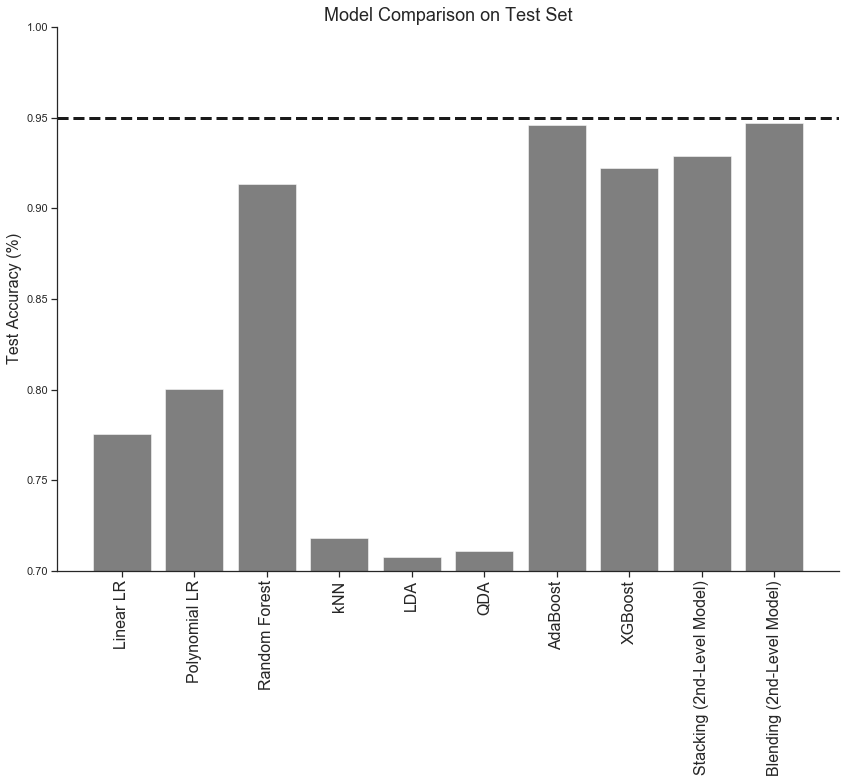

In [290]:
plt.figure(figsize=(14,10))
xx = range(len(df_var))
index_name=df_var.index
plt.bar(xx, df_var['test accuracy'], color='black', alpha=0.5)
plt.ylim(0.7,1)
plt.title('Model Comparison on Test Set', fontsize=18)
plt.ylabel('Test Accuracy (%)', fontsize=16)
plt.xticks(xx,index_name,rotation=90,fontsize = 16);
sns.despine()

plt.axhline(0.95, c='k', linewidth=3, linestyle='--');

The weighted stacked model performed the best on the test set, achieving an accuracy of 85.7%, a value more than 1% higher than that achieved by the other best models: logistic regression and random forest. With extra tuning of hyperparameters and model weightings it is likely that this could be increased further.

## Netrual network


In [13]:
from sklearn.model_selection import cross_val_score
from sklearn.utils import resample
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.ensemble import AdaBoostClassifier
from sklearn.linear_model import LogisticRegressionCV

import tensorflow.keras 
from tensorflow.keras import models
from tensorflow.keras import layers


from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense
from tensorflow.keras import regularizers

from sklearn.metrics import r2_score as r2

from sklearn.utils import shuffle
from tensorflow.keras.layers import Dropout
from tensorflow.keras.wrappers.scikit_learn import KerasClassifier

import tensorflow.contrib.eager as tfe
from sklearn.grid_search import GridSearchCV
from sklearn.datasets import make_classification
from sklearn.model_selection import cross_val_score

In [14]:
model_NN = models.Sequential()

model_NN.add(layers.Dense(1000, input_shape=(X_train_scaled.shape[1],),
                activation='relu'))

model_NN.add(layers.Dense(350, input_shape=(X_train_scaled.shape[1],),
                activation='relu', 
                kernel_regularizer=regularizers.l2(0.01)))
model_NN.add(Dropout(0.5))
           
model_NN.add(layers.Dense(350,   
                activation='relu', 
                kernel_regularizer=regularizers.l2(0.01)))
model_NN.add(Dropout(0.5))


model_NN.add(layers.Dense(1,  
                activation='sigmoid')) 

model_NN.summary()

_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense (Dense)                (None, 1000)              14000     
_________________________________________________________________
dense_1 (Dense)              (None, 350)               350350    
_________________________________________________________________
dropout (Dropout)            (None, 350)               0         
_________________________________________________________________
dense_2 (Dense)              (None, 350)               122850    
_________________________________________________________________
dropout_1 (Dropout)          (None, 350)               0         
_________________________________________________________________
dense_3 (Dense)              (None, 1)                 351       
Total params: 487,551
Trainable params: 487,551
Non-trainable params: 0
_________________________________________________________________


In [16]:
tensorflow.keras.optimizers.Adam(lr=0.001, beta_1=0.9, beta_2=0.999, epsilon=None, decay=0.0, amsgrad=False)
model_NN.compile(loss='binary_crossentropy', optimizer='Adam', metrics=['accuracy'])

In [18]:
%%capture
ANN_history = model_NN.fit(X_train_scaled, Y_train,batch_size=128,epochs=3000,validation_split=0.2)

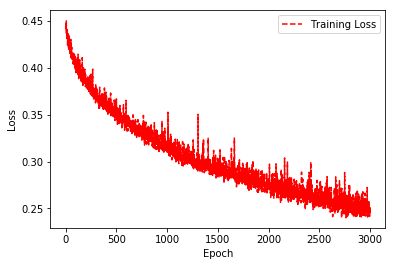

In [20]:
training_loss = ANN_history.history['loss']
epoch_count = range(1, len(training_loss) + 1)
plt.plot(epoch_count, training_loss, 'r--')
plt.legend(['Training Loss'])
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.show();

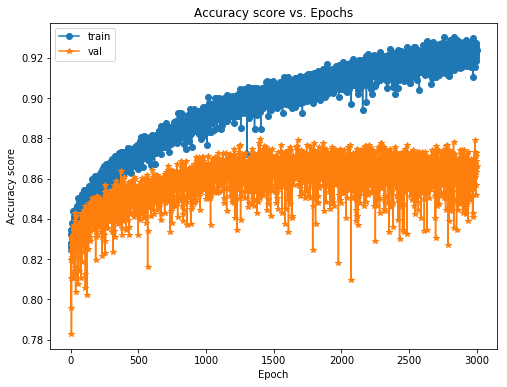

In [22]:
fig, axs = plt.subplots(figsize=(8, 6))
plt.plot(ANN_history.history['acc'], '-o', label='train')
plt.plot(ANN_history.history['val_acc'], '-*', label='val')

plt.ylabel("Accuracy score")
plt.xlabel("Epoch")
plt.title("Accuracy score vs. Epochs")

plt.legend()
plt.show() 

In [23]:
test_loss,test_acc = model_NN.evaluate(X_test_scaled, Y_test, verbose=1)
print('Test loss:', test_loss)
print('Test ACC:', test_acc)

3099/3099 [==============================] - 0s 88us/step
Test loss: 0.44289736228052284
Test ACC: 0.8725395289379845


### Steps for Further Improvement

As a closing remark it must be noted that the steps taken above just show a very simple way of producing an ensemble stacker. You hear of ensembles created at the highest level of Kaggle competitions which involves monstrous combinations of stacked classifiers as well as levels of stacking which go to more than 2 levels.

Some additional steps that may be taken to improve one's score could be:

- Implementing a good cross-validation strategy in training the models to find optimal parameter values
- Introduce a greater variety of base models for learning. The more uncorrelated the results, the better the final score.

 AC209a Twitter Project - Group 15

## Advance models with NLP features

<hr style="height:2pt">

In [125]:
%%capture
# RUN THIS CELL FOR FORMAT
import requests
from IPython.core.display import HTML
styles = requests.get("https://raw.githubusercontent.com/Harvard-IACS/2018-CS109A/master/content/styles/cs109.css").text
HTML(styles)

### Important packages

1. `Tweepy` - Twitter API - http://docs.tweepy.org/en/v3.5.0/api.html#tweepy-api-twitter-api-wrapper

2. `nltk` - Natural language processing library - http://www.nltk.org/howto/twitter.html

3. `twython` - Python wrapper for the Twitter API

4. `jsonpickle` - converts Python objects into JSON

5. `scikit-learn` - Python machine learning library

https://github.com/Jefferson-Henrique/GetOldTweets-python

In [532]:
%%capture
!pip install --upgrade jsonpickle tweepy

import sys
import jsonpickle
import os
import numpy as np
import pandas as pd
import tweepy
import nltk
import pandas as pd
import json
import sklearn
import datetime
from datetime import datetime
import statsmodels.api as sm
from statsmodels.api import OLS
from sklearn import preprocessing
from sklearn.preprocessing import PolynomialFeatures
from sklearn.metrics import r2_score
from sklearn.metrics import accuracy_score
from sklearn.linear_model import LogisticRegression
from sklearn.linear_model import LogisticRegressionCV
from sklearn.pipeline import make_pipeline
from sklearn.preprocessing import PolynomialFeatures
from sklearn.model_selection import train_test_split
from pandas.plotting import scatter_matrix
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis
from sklearn.discriminant_analysis import QuadraticDiscriminantAnalysis
from sklearn.ensemble import AdaBoostClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report,confusion_matrix
from sklearn.model_selection import GridSearchCV
from sklearn.ensemble import GradientBoostingClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report,confusion_matrix
from sklearn.model_selection import GridSearchCV
from sklearn.ensemble import GradientBoostingClassifier
import xgboost as xgb
from sklearn.metrics import confusion_matrix
from sklearn.neighbors import KNeighborsClassifier
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import KFold
from sklearn.svm import SVC
from sklearn import metrics
from sklearn.neighbors import KNeighborsClassifier
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import KFold
import xgboost as xgb
from sklearn.ensemble import VotingClassifier
from sklearn.cluster import KMeans
from mlens.ensemble import BlendEnsemble
from sklearn.ensemble import ExtraTreesClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import GradientBoostingRegressor
from xgboost import XGBRegressor
from sklearn.neural_network import MLPClassifier
from sklearn.gaussian_process import GaussianProcessClassifier
from sklearn.naive_bayes import GaussianNB
from sklearn.svm import SVR
from sklearn.ensemble import RandomForestClassifier
from sklearn import svm
import seaborn as sns
import matplotlib.pyplot as plt
import matplotlib
%matplotlib inline
from pandas.io.json import json_normalize

from sklearn.ensemble import (RandomForestClassifier, AdaBoostClassifier, 
                              GradientBoostingClassifier, ExtraTreesClassifier)
from sklearn.svm import SVC
from sklearn.model_selection import cross_val_score
from sklearn.utils import resample
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.ensemble import AdaBoostClassifier
from sklearn.linear_model import LogisticRegressionCV

import tensorflow.keras 
from tensorflow.keras import models
from tensorflow.keras import layers


from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense
from tensorflow.keras import regularizers

from sklearn.metrics import r2_score as r2

from sklearn.utils import shuffle
from tensorflow.keras.layers import Dropout
from tensorflow.keras.wrappers.scikit_learn import KerasClassifier

import tensorflow.contrib.eager as tfe
from sklearn.grid_search import GridSearchCV
from sklearn.datasets import make_classification
from sklearn.model_selection import cross_val_score
import plotly
import plotly.offline as py
py.init_notebook_mode(connected=True)
import plotly.graph_objs as go
import plotly.tools as tls

import warnings
warnings.filterwarnings('ignore')
import time

## Data cleaning

In this part, we import datasets from previous section, split the dataset into training and test set and do data cleaning  by normalizing data in each columns. The feature we used here include feature we extracted from NLP.

In [410]:
user_df = pd.read_csv(r"merged_mean_imputed_legit.csv",index_col='User ID')
bot_df = pd.read_csv(r"merged_mean_imputed_bots.csv",index_col='User ID')
# pre_df=pd.read_csv(r"pred_dataframe.csv",index_col='User ID')
bot_df['bot']=1
user_df['bot']=0
total_df = bot_df.append(user_df)

In [411]:
total_df=total_df.drop(['bot_bool','Account age (days)','avg_num_caps', 'avg_words_per_tweet','word_diversity', 'difficult_words_score','avg_readability_combined_metric','avg_flesch_reading_ease', 'avg_readability_DC', 'full_tweet_text','avg_num_hashtags.1','percent_with_p_emoji','percent_with_n_emoji','percent_with_pn_emoji','avg_num_exclamation','avg_num_ellipses'],axis=1)
total_df=pd.get_dummies(total_df, prefix=['overall_language'], columns=['overall_language'])

In [412]:
train_data, test_data = train_test_split(total_df, test_size = 0.3, random_state=99)
Y_train=train_data['bot']
Y_test=test_data['bot']
X_train=train_data.drop('bot',axis=1)
X_test=test_data.drop('bot',axis=1)

In [413]:
X_test=X_test.replace([np.inf, -np.inf], np.nan).dropna()
X_train=X_train.replace([np.inf, -np.inf], np.nan).dropna()

In [414]:
def normalize(df,df_train):
    result = df.copy()
    for feature_name in df_train.columns:
        max_value = df_train[feature_name].max()
        min_value = df_train[feature_name].min()
        result[feature_name] = (df[feature_name] - min_value) / (max_value - min_value)
    return result

In [415]:
X_train_scaled=normalize(X_train,X_train)
X_test_scaled=normalize(X_test,X_train)
X_train_scaled=X_train_scaled.drop(['overall_language_bg','overall_language_fa','overall_language_lv','overall_language_lv','overall_language_sw'],axis=1)
X_test_scaled=X_test_scaled.drop(['overall_language_bg','overall_language_fa','overall_language_lv','overall_language_lv','overall_language_sw'],axis=1)

# Models  with  NLP Features

Similar to the that in the model development,we also use Logistic Regression, LDA/QDA, Random Forest,Boosting, and Support Vector Machines models. 

Two major improvements from what we did in the model development section are:

* Include features from NLP into these models;

* Include Feed Forward Artificial Neural Network; Stacking (Meta Ensembling) and Blended Ensemble Methods in the model.

## Logistic Regression

In [417]:
start_time = time.time()
logreg = LogisticRegression(C=100000,fit_intercept=True).fit(X_train_scaled,Y_train)
time_logistic=time.time() - start_time
logreg_train = logreg.score(X_train_scaled, Y_train)
logreg_test = logreg.score(X_test_scaled, Y_test)
print('Accuracy of logistic regression model on the test set is {:.3f}'.format(logreg_test))

Accuracy of logistic regression model on the test set is 0.972


In [418]:
# Logistic regression w/ quadratic + interaction terms + regularization
start_time = time.time()
polynomial_logreg_estimator = make_pipeline(
    PolynomialFeatures(degree=2, include_bias=True),
    LogisticRegressionCV(multi_class="ovr", penalty='l2', cv=5, max_iter=10000))
linearLogCVpoly = polynomial_logreg_estimator.fit(X_train_scaled, Y_train)
time_linearLogCVpoly=time.time() - start_time

# Compare results
print('Polynomial-logistic accuracy:test={:.1%}'.format( linearLogCVpoly.score(X_test_scaled, Y_test)))

linearLogCVpoly_train = linearLogCVpoly.score(X_train_scaled, Y_train)
linearLogCVpoly_test = linearLogCVpoly.score(X_test_scaled, Y_test)

Polynomial-logistic accuracy:test=96.9%


In [420]:
y_pred_logreg= logreg.predict(X_test_scaled)
y_pred_logreg_proba=logreg.predict_proba(X_test_scaled)[:,1]
y_pred_linearLogCVpoly= linearLogCVpoly.predict(X_test_scaled)
y_pred_linearLogCVpoly_proba=linearLogCVpoly.predict_proba(X_test_scaled)[:,1]

## LDA and QDA Model

In [318]:
start_time = time.time()
lda = LinearDiscriminantAnalysis(store_covariance=True)
lda.fit(X_train_scaled, Y_train)
time_lda=time.time() - start_time
print("---lda %s seconds ---" % (time_lda))

start_time = time.time()
qda = QuadraticDiscriminantAnalysis(store_covariance=True)
qda.fit(X_train_scaled, Y_train)
time_qda=time.time() - start_time
print("--- qda %s seconds ---" % (time_qda))

y_pred_lda=lda.predict(X_test_scaled)
y_pred_lda_proba=lda.predict_proba(X_test_scaled)[:,1]

y_pred_qda=qda.predict(X_test_scaled)
lda_train = lda.score(X_train_scaled, Y_train)
lda_test = lda.score(X_test_scaled, Y_test)
qda_train = qda.score(X_train_scaled, Y_train)
y_pred_qda_proba=qda.predict_proba(X_test_scaled)[:,1]

qda_test = qda.score(X_test_scaled, Y_test)

print('LDA accuracy train={:.1%}, test: {:.1%}'.format(
    lda.score(X_train_scaled, Y_train), lda.score(X_test_scaled, Y_test)))

print('QDA accuracy train={:.1%}, test: {:.1%}'.format(
    qda.score(X_train_scaled, Y_train), qda.score(X_test_scaled, Y_test)))

---lda 0.013133764266967773 seconds ---
--- qda 0.008303165435791016 seconds ---
LDA accuracy train=94.5%, test: 93.2%
QDA accuracy train=72.8%, test: 72.3%


## Random forest

In [324]:
start_time = time.time()
ntrees = 50
rf = RandomForestClassifier(n_estimators=ntrees , max_depth=15, max_features='auto')
rf.fit(X_train_scaled, Y_train)

time_rf=time.time() - start_time
print("--- %s seconds ---" % (time_rf))

rf_train =rf.score(X_train_scaled, Y_train)
rf_test =rf.score(X_test_scaled, Y_test)
rf_y_test_proba =rf.predict_proba(X_test_scaled)[:,1]
rf_y_test =rf.predict(X_test_scaled)
print('RF accuracy train={:.1%}, test: {:.1%}'.format(rf_train,rf_test))
# y_pre_df_rf = rf.predict(pre_df_scaled)

--- 0.20110392570495605 seconds ---
RF accuracy train=100.0%, test: 98.4%


## Adaboost

In [75]:
start_time = time.time()

adaboost = AdaBoostClassifier(base_estimator=DecisionTreeClassifier(max_depth=8), n_estimators=800, learning_rate=0.01)
adaboost.fit(X_train_scaled, Y_train);
time_adaboost=time.time() - start_time
print("--- %s seconds ---" % (time_adaboost))

--- 22.391461849212646 seconds ---


In [328]:
y_pred_test = adaboost.predict(X_test_scaled)
pred_adaboost = [round(value) for value in y_pred_test]
test_adaboost = accuracy_score(Y_test, pred_adaboost)
print('test acc:',test_adaboost )
y_train_adaboost = adaboost.predict(X_train_scaled)
train_adaboost = accuracy_score(Y_train,y_train_adaboost)
y_test_adaboost = adaboost.predict(X_test_scaled)
y_test_adaboost_proba = adaboost.predict_proba(X_test_scaled)[:,1]


test acc: 0.9715346534653465


In [77]:
# y_pre_df_adaboost = adaboost.predict(pre_df_scaled)

## XGBoost

In [329]:
start_time = time.time()
xgb = xgb.XGBClassifier(max_depth=5, n_estimators=300, learning_rate=0.01).fit(X_train_scaled, Y_train)
time_xgb=time.time() - start_time
print("--- %s seconds ---" % (time_xgb))

y_pred_train_xgb = xgb.predict(X_train_scaled)
y_pred_test_xgb = xgb.predict(X_test_scaled)
y_pred_test_xgb_proba = xgb.predict_proba(X_test_scaled)[:,1]

test_xgb = accuracy_score(Y_test, y_pred_test_xgb)
train_xgb = accuracy_score(Y_test, y_pred_test_xgb)

print("test Accuracy: %.2f%%" % (accuracy_xgb * 100.0))

# y_pre_df_xgboost = xgb.predict(pre_df_scaled)

--- 2.7918081283569336 seconds ---
test Accuracy: 98.27%


## K-NN

In [331]:
start_time = time.time()

scores_mean=[]
scores_std=[]
k_number=np.arange(1,40)
for k in range(1,40):
    knn = KNeighborsClassifier(n_neighbors = k)
    score_mean= cross_val_score(knn,X_train_scaled,Y_train,cv=5).mean()
    score_std=cross_val_score(knn,X_train_scaled,Y_train,cv=5).std()
    scores_mean.append(score_mean)
max_score_k=max(scores_mean)
best_k=scores_mean.index(max(scores_mean))+1
print('Best K=',best_k, 'with a max CV score of',max_score_k)

knn_best_k = KNeighborsClassifier(n_neighbors = best_k)
knn_best_k.fit(X_train_scaled,Y_train);

time_knn_best_k=time.time() - start_time
print("--- %s seconds ---" % (time_knn_best_k))

y_test_pred_best_k = knn_best_k.predict(X_test_scaled)
y_train_pred_best_k = knn_best_k.predict(X_train_scaled)
y_test_pred_best_k_proba = knn_best_k.predict_proba(X_test_scaled)[:,1]

train_knn_best_k= knn_best_k.score(X_train_scaled, Y_train)
test_knn_best_k= knn_best_k.score(X_test_scaled, Y_test)

print('train accuracy',accuracy_score(Y_train, y_train_pred_best_k))
print('test accuracy',accuracy_score(Y_test, y_test_pred_best_k))

Best K= 4 with a max CV score of 0.9522094926350245
--- 15.47924017906189 seconds ---
train accuracy 0.9681359532660648
test accuracy 0.9492574257425742


## Support Vector Machines

In [341]:
def fit_and_plot_svm_for_c(x_train, y_train, x_test, y_test,pre_df, C):
    # Fit SVM model
    model = svm.SVC(C=C, kernel='linear',probability=True)
    model.fit(x_train, y_train)
    
    # Train and test error

    tr_acc = model.score(x_train, y_train)
    ts_acc = model.score(x_test, y_test)
    y_pre_svm = model.predict(pre_df)
    y_pre_svm_proba = model.predict_proba(pre_df)[:,1]

    return tr_acc, ts_acc,y_pre_svm,y_pre_svm_proba

In [344]:
# Fit and plot for different 'C' values
start_time = time.time()
tr_acc, ts_acc,y_pre_test_svm,y_pre_svm_proba = fit_and_plot_svm_for_c(X_train_scaled, Y_train,X_test_scaled, Y_test, X_test_scaled, 0.1)
time_svm=time.time() - start_time
print("--- %s seconds ---" % (time_svm))

--- 0.4933969974517822 seconds ---


In [88]:
print('train accuracy',tr_acc)
print('test accuracy',ts_acc)

train accuracy 0.9251194901752523
test accuracy 0.9133663366336634


## Artificial Neural network (ANN)


In this section, we development Artificial neural network based on TensorFlow.
Neural Networks consist of the following components:
* An input layer, x
* An arbitrary amount of hidden layers
* An output layer, ŷ
* A set of weights and biases between each layer, W and b
* A choice of activation function for each hidden layer, σ.


Here we built a three-layers ANN based on GridsearchCV results :
1. Nodes per Layer: 500,300,2 
2. Activation function: reLU
3. Loss function: binary_crossentropy
4. Output unit: Sigmoid 
5. Optimizer: Adam
6. Epochs: 500
7. Batch size: 128
8. Validation size: .2


In [477]:
start_time=time.time()
model_NN = models.Sequential()

model_NN.add(layers.Dense(500, input_shape=(X_train_scaled.shape[1],),
                activation='relu'))

model_NN.add(layers.Dense(300, input_shape=(X_train_scaled.shape[1],),
                activation='relu', 
                kernel_regularizer=regularizers.l2(0.01)))
model_NN.add(Dropout(0.5))

model_NN.add(layers.Dense(1,  
                activation='sigmoid')) 

print(model_NN.summary())
tensorflow.keras.optimizers.Adam(lr=0.01, beta_1=0.9, beta_2=0.999, epsilon=None, decay=0.0, amsgrad=False)
model_NN.compile(loss='binary_crossentropy', optimizer='Adam', metrics=['accuracy'])

_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_13 (Dense)             (None, 500)               25500     
_________________________________________________________________
dense_14 (Dense)             (None, 300)               150300    
_________________________________________________________________
dropout_5 (Dropout)          (None, 300)               0         
_________________________________________________________________
dense_15 (Dense)             (None, 1)                 301       
Total params: 176,101
Trainable params: 176,101
Non-trainable params: 0
_________________________________________________________________
None


In [478]:
%%capture
start_time=time.time()
ANN_history = model_NN.fit(X_train_scaled, Y_train,batch_size=128,epochs=500,validation_split=0.2)
time_ANN=time.time() - start_time

808/808 [==============================] - 0s 42us/step
Test loss: 0.13090957977836676
Test ACC: 0.9789603960396039


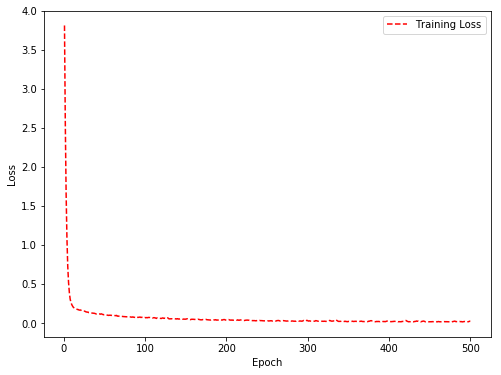

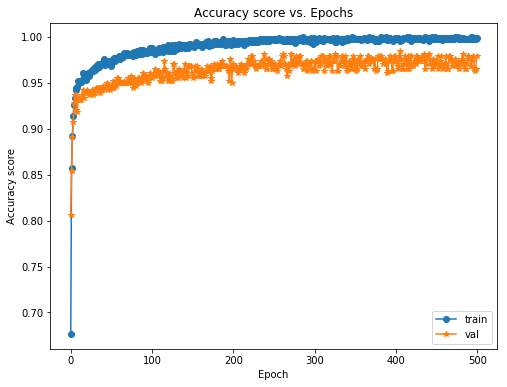

In [480]:
train_loss,train_acc = model_NN.evaluate(X_train_scaled, Y_train, verbose=1)
test_loss,test_acc = model_NN.evaluate(X_test_scaled, Y_test, verbose=1)
print('Test loss:', test_loss)
print('Test ACC:', test_acc)
y_pre_test_NN_proba = model_NN.predict(X_test_scaled)
y_pre_test_NN= np.array((y_pre_test_NN_proba>0.5).astype(np.int))[:,0]
training_loss = ANN_history.history['loss']
epoch_count = range(1, len(training_loss) + 1)
fig, axs = plt.subplots(figsize=(8, 6))

plt.plot(epoch_count, training_loss, 'r--')
plt.legend(['Training Loss'])
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.show();
fig, axs = plt.subplots(figsize=(8, 6))
plt.plot(ANN_history.history['acc'], '-o', label='train')
plt.plot(ANN_history.history['val_acc'], '-*', label='val')

plt.ylabel("Accuracy score")
plt.xlabel("Epoch")
plt.title("Accuracy score vs. Epochs")

plt.legend()
plt.show() 

## Stacked Model

Model stacking is an efficient ensemble method in which the predictions, generated by using various machine learning algorithms, are used as inputs in a second-layer learning algorithm. This second-layer algorithm is trained to optimally combine the model predictions to form a new set of predictions. For example, when linear regression is used as second-layer modeling, it estimates these weights by minimizing the least square errors. However, the second-layer modeling is not restricted to only linear models; the relationship between the predictors can be more complex, opening the door to employing other machine learning algorithms.

![title](modelstacking.png)

Ensemble modeling and model stacking are especially popular in data science competitions, in which a sponsor posts a training set (which includes labels) and a test set (which does not include labels) and issues a global challenge to produce the best predictions of the test set for a specified performance criterion. The winning teams almost always use ensemble models instead of a single fine-tuned model. Often individual teams develop their own ensemble models in the early stages of the competition, and then join their forces in the later stages. 

Another popular data science competition is the KDD Cup. The following figure shows the winning solution for the 2015 competition, which used a three-stage stacked modeling approach. A similar approach will be trialed for this project to try and obtain maximal predictive capability.

![title](stackedapproach.png)

The figure shows that a diverse set of 64 single models were used to build the model library. These models are trained by using various machine learning algorithms. For example, the green boxes represent gradient boosting models (GBM), pink boxes represent neural network models (NN), and orange boxes represent factorization machines models (FM). You can see that there are multiple gradient boosting models in the model library; they probably vary in their use of different hyperparameter settings and/or feature sets.

A simple way to enhance diversity is to train models by using different machine learning algorithms. For example, adding a factorization model to a set of tree-based models (such as random forest and gradient boosting) provides a nice diversity because a factorization model is trained very differently than decision tree models are trained. For the same machine learning algorithm, you can enhance diversity by using different hyperparameter settings and subsets of variables. If you have many features, one efficient method is to choose subsets of the variables by simple random sampling.

Overfitting is an especially big problem in model stacking, because so many predictors that all predict the same target are combined. Overfitting is partially caused by this collinearity between the predictors. The most efficient techniques for training models (especially during the stacking stages) include using cross validation and some form of regularization. A good paper that outlines this procedure is [Stacked Ensemble Models for Improved Prediction Accuracy](https://support.sas.com/resources/papers/proceedings17/SAS0437-2017.pdf).

That paper also shows how you can generate a diverse set of models by various methods (such as forests, gradient boosted decision trees, factorization machines, and logistic regression) and then combine them with stacked ensemble techniques such regularized regression methods, gradient boosting, and hill climbing methods.

![title](levels.png)

Applying stacked models to real-world big data problems can produce greater prediction accuracy and robustness than do individual models. The model stacking approach is powerful and compelling enough to alter your initial data mining mindset from finding the single best model to finding a collection of really good complementary models. Of course, this method does involve additional cost both because you need to train a large number of models and because you need to use cross validation to avoid overfitting.

## Stacked Model

In this section we will try to implement a stacked model similar to that proposed in the "[Stacked Ensemble Models for Improved Prediction Accuracy](https://support.sas.com/resources/papers/proceedings17/SAS0437-2017.pdf)" paper.

## Helpers via Python Classes

In the section of code below, we essentially write a class SklearnHelper that allows one to extend the inbuilt methods (such as train, predict and fit) common to all the Sklearn classifiers. Therefore this cuts out redundancy as won't need to write the same methods five times if we wanted to invoke five different classifiers.

In [139]:
# Some useful parameters which will come in handy later on
ntrain = X_train_scaled.shape[0]
ntest = X_test_scaled.shape[0]
# n_pre_df=pre_df_scaled.shape[0]
SEED = 99 # for reproducibility
NFOLDS = 5 # set folds for out-of-fold prediction

kf = KFold(n_splits = NFOLDS, random_state=SEED)

# Class to extend the Sklearn classifier
class SklearnHelper(object):
    def __init__(self, clf, seed=0, params=None):
        params['random_state'] = seed
        self.clf = clf(**params)

    def train(self, x_train, y_train):
        self.clf.fit(x_train, y_train)

    def predict(self, x):
        return self.clf.predict(x)
    
    def fit(self,x,y):
        return self.clf.fit(x,y)
    
    def feature_importances(self,x,y):
            print(self.clf.fit(x,y).feature_importances_)

**def init :** Python standard for invoking the default constructor for the class. This means that when you want to create an object (classifier), you have to give it the parameters of clf (what sklearn classifier you want), seed (random seed) and params (parameters for the classifiers).

The rest of the code are simply methods of the class which simply call the corresponding methods already existing within the sklearn classifiers. Essentially, we have created a wrapper class to extend the various Sklearn classifiers so that this should help us reduce having to write the same code over and over when we implement multiple learners to our stacker.

### Out-of-Fold Predictions

Stacking uses predictions of base classifiers as input for training to a second-level model. However one cannot simply train the base models on the full training data, generate predictions on the full test set and then output these for the second-level training. This runs the risk of your base model predictions already having "seen" the test set and therefore overfitting when feeding these predictions.

In [140]:
def get_oof(clf, x_train, y_train, x_test):
    oof_train = np.zeros((ntrain,))
    oof_test = np.zeros((ntest,))
    oof_test_skf = np.empty((NFOLDS, ntest))

    for i, (train_index, test_index) in enumerate(kf.split(x_train)):

        x_tr = x_train.iloc[train_index]
        y_tr = y_train.iloc[train_index]
        x_te = x_train.iloc[test_index]
        clf.train(x_tr, y_tr)

        oof_train[test_index] = clf.predict(x_te)
        oof_test_skf[i, :] = clf.predict(x_test)

    oof_test[:] = oof_test_skf.mean(axis=0)
    return oof_train.reshape(-1, 1), oof_test.reshape(-1, 1)

### Generating our Base First-Level Models

So now let us prepare five learning models as our first level classification. These models can all be conveniently invoked via the Sklearn library and are listed as follows:

- **Random Forest classifier**
- **Extra Trees classifier**
- **AdaBoost classifer**
- **Gradient Boosting classifer**
- **Support Vector Machine**

**Parameters**

**n_jobs :** Number of cores used for the training process. If set to -1, all cores are used.

**n_estimators :** Number of classification trees in your learning model ( set to 10 per default)

**max_depth :** Maximum depth of tree, or how much a node should be expanded. Beware if set to too high a number would run the risk of overfitting as one would be growing the tree too deep

**verbose :** Controls whether you want to output any text during the learning process. A value of 0 suppresses all text while a value of 3 outputs the tree learning process at every iteration.

In [141]:
# Create 5 objects that represent our 4 models
# Put in our parameters for said classifiers
# Random Forest parameters

rf_params = {
    'n_jobs': -1,
    'n_estimators': 50,
     'warm_start': True, 
     #'max_features': 0.2,
    'max_depth': 15,
    'min_samples_leaf': 2,
    'max_features' : 'sqrt',
    'verbose': 0
}


# Extra Trees Parameters
et_params = {
    'n_jobs': -1,
    'n_estimators':500,
    #'max_features': 0.5,
    'max_depth': 4,
    'min_samples_leaf': 2,
    'verbose': 0
}

# AdaBoost parameters
ada_params = {
    'base_estimator': DecisionTreeClassifier(max_depth=5),
    'n_estimators': 800,
    'learning_rate' : 0.01
}

# Gradient Boosting parameters
gb_params = {
    'n_estimators': 500,
     #'max_features': 0.2,
    'max_depth': 5,
    'min_samples_leaf': 2,
    'verbose': 0
}

# Support Vector Classifier parameters 
svc_params = {
    'kernel' : 'sigmoid',
    'C' : 0.1
    }

Let us now create 5 objects that represent our 5 learning models via our Helper Sklearn Class we defined earlier.

In [142]:
# Create 5 objects that represent our 4 models
rf = SklearnHelper(clf=RandomForestClassifier, seed=SEED, params=rf_params)
et = SklearnHelper(clf=ExtraTreesClassifier, seed=SEED, params=et_params)
ada = SklearnHelper(clf=AdaBoostClassifier, seed=SEED, params=ada_params)
gb = SklearnHelper(clf=GradientBoostingClassifier, seed=SEED, params=gb_params)
svc = SklearnHelper(clf=SVC, seed=SEED, params=svc_params)
logreg_stack = SklearnHelper(clf=LogisticRegression, seed=SEED, params=logreg_params)


### Output of the First level Predictions

We now feed the training and test data into our 5 base classifiers and use the Out-of-Fold prediction function we defined earlier to generate our first level predictions. Allow a handful of minutes for the chunk of code below to run.

In [144]:
# Create our OOF train and test predictions. These base results will be used as new features
start_time = time.time()
et_oof_train, et_oof_test = get_oof(et, X_train_scaled, Y_train, X_test_scaled) # Extra Trees
rf_oof_train, rf_oof_test = get_oof(rf,X_train_scaled, Y_train, X_test_scaled) # Random Forest
ada_oof_train, ada_oof_test = get_oof(ada, X_train_scaled, Y_train, X_test_scaled) # AdaBoost 
gb_oof_train, gb_oof_test = get_oof(gb,X_train_scaled, Y_train, X_test_scaled) # Gradient Boost
svc_oof_train, svc_oof_test = get_oof(svc,X_train_scaled, Y_train, X_test_scaled) # Support Vector Classifier
logreg_oof_train, logreg_oof_test = get_oof(logreg_stack,X_train_scaled, Y_train, X_test_scaled) # Linear Logistic 
print("Training is complete")

Training is complete


### Feature importances generated from the different classifiers

Now having learned our the first-level classifiers, we can utilise a very nifty feature of the Sklearn models and that is to output the importances of the various features in the training and test sets with one very simple line of code.

As per the Sklearn documentation, most of the classifiers are built in with an attribute which returns feature importances by simply typing in .featureimportances. Therefore we will invoke this very useful attribute via our function earliand plot the feature importances as such

In [530]:
# rf_feature = rf.feature_importances(X_train_scaled,Y_train);
# et_feature = et.feature_importances(X_train_scaled, Y_train);
# ada_feature = ada.feature_importances(X_train_scaled, Y_train);
# gb_feature = gb.feature_importances(X_train_scaled,Y_train);

In [99]:
rf_feature =[3.81328983e-03, 1.12093493e-02, 7.37999319e-03, 1.30421548e-02,
 1.00777020e-01, 3.29523904e-02, 1.92336937e-02, 7.14541672e-02,
 8.03046147e-02 ,3.05345301e-02, 5.89145974e-03, 5.17977783e-02,
 4.99630854e-02, 3.15265206e-03, 2.33637369e-02, 3.74939698e-04,
 6.61086320e-03, 7.93520137e-04, 2.64117914e-04, 1.15063417e-03,
 2.67447947e-02, 4.58271777e-02, 1.70301831e-01, 5.01417684e-02,
 1.16617965e-01, 9.87864001e-03, 0.00000000e+00 ,0.00000000e+00,
 0.00000000e+00, 0.00000000e+00, 0.00000000e+00, 5.16266505e-03,
 1.08441505e-04, 1.40491858e-04, 0.00000000e+00, 0.00000000e+00,
 0.00000000e+00, 4.50337922e-02, 1.44616427e-02, 0.00000000e+00,
 0.00000000e+00, 0.00000000e+00, 0.00000000e+00, 1.36262818e-03,
 0.00000000e+00, 1.54169690e-04, 0.00000000e+00, 0.00000000e+00,
 0.00000000e+00, 0.00000000e+00]
et_feature=[3.19967530e-03, 7.96960790e-03, 3.99422961e-02, 3.11006708e-02,
 3.75669362e-02, 3.74854784e-02, 7.91793709e-03, 1.20351006e-01,
 7.71089405e-02, 4.11318717e-03, 9.81627326e-03, 7.70681888e-03,
 6.17586601e-02, 1.33281864e-03, 1.22468001e-01, 7.98226730e-04,
 1.08759426e-02, 3.19988769e-03, 4.72262053e-04, 3.57856979e-04,
 3.69540415e-03, 5.78111044e-04, 1.10954292e-02, 1.87982780e-02,
 2.60338448e-02, 3.16483389e-02, 3.06311170e-05, 0.00000000e+00,
 0.00000000e+00, 0.00000000e+00, 1.67497286e-03, 4.12170983e-02,
 2.34659506e-02, 1.27499698e-03, 1.63768248e-05, 3.72145955e-05,
 1.20130405e-04, 1.14860536e-01, 1.10215255e-01, 5.97077821e-06,
 0.00000000e+00, 2.86134822e-03, 1.49524123e-05, 2.63767373e-02,
 1.08899977e-05, 3.27083383e-04, 9.34956424e-05, 0.00000000e+00,
 0.00000000e+00, 4.46945822e-06]
ada_feature =[3.81057788e-04, 3.60372635e-04, 1.30099357e-04, 2.71829901e-02,
 2.64642858e-01, 7.23177723e-02, 1.40199614e-04, 1.68003402e-03,
 1.12020611e-01, 5.20216522e-02, 1.80898351e-03 ,1.03049650e-01,
 2.40922690e-03, 4.26744331e-02, 5.05083504e-02, 3.97108595e-05,
 3.11618686e-04, 4.49567395e-06, 0.00000000e+00, 4.61894175e-09,
 7.03622416e-04, 1.31046369e-03, 1.42672374e-01, 3.33041939e-04,
 1.03393521e-02, 5.43852998e-04, 0.00000000e+00, 0.00000000e+00,
 0.00000000e+00, 0.00000000e+00, 0.00000000e+00, 1.85397082e-09,
 2.24592396e-02, 0.00000000e+00, 0.00000000e+00, 0.00000000e+00,
 1.89794626e-09 ,7.60133087e-03, 4.08833329e-02, 0.00000000e+00,
 0.00000000e+00 ,0.00000000e+00, 0.00000000e+00, 4.14692657e-02,
 0.00000000e+00 ,0.00000000e+00, 0.00000000e+00, 0.00000000e+00,
 0.00000000e+00 ,0.00000000e+00]
gb_feature=[2.97550337e-03, 3.28845496e-03, 8.09909425e-03, 3.45364760e-03,
 2.00341549e-02, 6.25318970e-03, 2.07000063e-03, 1.64251440e-02,
 2.11850552e-02, 1.50817409e-02 ,3.87118724e-03 ,2.99569785e-02,
 2.01647846e-02, 6.94558009e-03, 5.91027349e-03, 4.88041458e-07,
 9.34731544e-04 ,2.69655660e-04 ,2.50558411e-04, 1.69719678e-03,
 1.22603649e-02 ,1.24173101e-02, 1.72950504e-02, 1.07786091e-02,
 2.77337852e-02 ,4.96902103e-03, 0.00000000e+00 ,0.00000000e+00,
 0.00000000e+00, 0.00000000e+00 ,0.00000000e+00 ,2.32999668e-03,
 8.81896468e-04, 0.00000000e+00 ,5.80374730e-06 ,0.00000000e+00,
 3.25996636e-04, 1.63914298e-02 ,9.81860662e-04 ,0.00000000e+00,
 0.00000000e+00, 0.00000000e+00 ,0.00000000e+00 ,6.95535186e-04,
 0.00000000e+00 ,6.59200239e-05 ,0.00000000e+00 ,0.00000000e+00,
 0.00000000e+00 ,0.00000000e+00]

In [100]:
cols = X_train_scaled.columns.values
display(cols)
# Create a dataframe with features
feature_dataframe = pd.DataFrame( {'features': cols,
     'Random Forest feature importances': rf_feature,
     'Extra Trees  feature importances': et_feature,
      'AdaBoost feature importances': ada_feature,
    'Gradient Boost feature importances': gb_feature
    })

feature_dataframe

array(['overall_sentiment', 'overall_polarity', 'var_sentiment',
       'var_polarity', 'percent_with_emoji', 'percent_hashtag',
       'avg_num_hashtags', 'percent_mention', 'avg_num_mentions',
       'avg_time_between_mention', 'avg_word_len', 'avg_time_between_rt',
       'percent_tweet_rt', 'num_languages', 'Screen name length',
       'Number of digits in screen name', 'User name length',
       'Default profile (binary)', 'Default picture (binary)',
       'Number of unique profile descriptions', 'Number of friends',
       'Number of followers', 'Number of favorites',
       'Number of tweets per hour', 'Number of tweets total',
       'timing_tweet', 'overall_language_ar', 'overall_language_ca',
       'overall_language_cs', 'overall_language_da',
       'overall_language_de', 'overall_language_en',
       'overall_language_es', 'overall_language_fr',
       'overall_language_he', 'overall_language_hu',
       'overall_language_id', 'overall_language_it',
       'overall_langua

,features,Random Forest feature importances,Extra Trees feature importances,AdaBoost feature importances,Gradient Boost feature importances
0,overall_sentiment,0.003813,0.003200,3.810578e-04,2.975503e-03
1,overall_polarity,0.011209,0.007970,3.603726e-04,3.288455e-03
2,var_sentiment,0.007380,0.039942,1.300994e-04,8.099094e-03
3,var_polarity,0.013042,0.031101,2.718299e-02,3.453648e-03
4,percent_with_emoji,0.100777,0.037567,2.646429e-01,2.003415e-02
5,percent_hashtag,0.032952,0.037485,7.231777e-02,6.253190e-03
6,avg_num_hashtags,0.019234,0.007918,1.401996e-04,2.070001e-03
7,percent_mention,0.071454,0.120351,1.680034e-03,1.642514e-02
8,avg_num_mentions,0.080305,0.077109,1.120206e-01,2.118506e-02
9,avg_time_between_mention,0.030535,0.004113,5.202165e-02,1.508174e-02


In [102]:
# Scatter plot 
trace = go.Scatter(
    y = feature_dataframe['Random Forest feature importances'].values,
    x = feature_dataframe['features'].values,
    mode='markers',
    marker=dict(
        sizemode = 'diameter',
        sizeref = 1,
        size = 25,
#       size= feature_dataframe['AdaBoost feature importances'].values,
        #color = np.random.randn(500), #set color equal to a variable
        color = feature_dataframe['Random Forest feature importances'].values,
        colorscale='Portland',
        showscale=True
    ),
    text = feature_dataframe['features'].values
)
data = [trace]


layout= go.Layout(
    autosize= True,
    title= 'Random Forest Feature Importance',
    hovermode= 'closest',
#     xaxis= dict(
#         title= 'Pop',
#         ticklen= 5,
#         zeroline= False,
#         gridwidth= 2,
#     ),
    yaxis=dict(
        title= 'Feature Importance',
        ticklen= 5,
        gridwidth= 2
    ),
    showlegend= False
)
fig = go.Figure(data=data, layout=layout)
py.iplot(fig,filename='scatter2010')

# Scatter plot 
trace = go.Scatter(
    y = feature_dataframe['Extra Trees  feature importances'].values,
    x = feature_dataframe['features'].values,
    mode='markers',
    marker=dict(
        sizemode = 'diameter',
        sizeref = 1,
        size = 25,
#       size= feature_dataframe['AdaBoost feature importances'].values,
        #color = np.random.randn(500), #set color equal to a variable
        color = feature_dataframe['Extra Trees  feature importances'].values,
        colorscale='Portland',
        showscale=True
    ),
    text = feature_dataframe['features'].values
)
data = [trace]

layout= go.Layout(
    autosize= True,
    title= 'Extra Trees Feature Importance',
    hovermode= 'closest',
#     xaxis= dict(
#         title= 'Pop',
#         ticklen= 5,
#         zeroline= False,
#         gridwidth= 2,
#     ),
    yaxis=dict(
        title= 'Feature Importance',
        ticklen= 5,
        gridwidth= 2
    ),
    showlegend= False
)
fig = go.Figure(data=data, layout=layout)
py.iplot(fig,filename='scatter2010')

# Scatter plot 
trace = go.Scatter(
    y = feature_dataframe['AdaBoost feature importances'].values,
    x = feature_dataframe['features'].values,
    mode='markers',
    marker=dict(
        sizemode = 'diameter',
        sizeref = 1,
        size = 25,
#       size= feature_dataframe['AdaBoost feature importances'].values,
        #color = np.random.randn(500), #set color equal to a variable
        color = feature_dataframe['AdaBoost feature importances'].values,
        colorscale='Portland',
        showscale=True
    ),
    text = feature_dataframe['features'].values
)
data = [trace]

layout= go.Layout(
    autosize= True,
    title= 'AdaBoost Feature Importance',
    hovermode= 'closest',
#     xaxis= dict(
#         title= 'Pop',
#         ticklen= 5,
#         zeroline= False,
#         gridwidth= 2,
#     ),
    yaxis=dict(
        title= 'Feature Importance',
        ticklen= 5,
        gridwidth= 2
    ),
    showlegend= False
)
fig = go.Figure(data=data, layout=layout)
py.iplot(fig,filename='scatter2010')

# Scatter plot 
trace = go.Scatter(
    y = feature_dataframe['Gradient Boost feature importances'].values,
    x = feature_dataframe['features'].values,
    mode='markers',
    marker=dict(
        sizemode = 'diameter',
        sizeref = 1,
        size = 25,
#       size= feature_dataframe['AdaBoost feature importances'].values,
        #color = np.random.randn(500), #set color equal to a variable
        color = feature_dataframe['Gradient Boost feature importances'].values,
        colorscale='Portland',
        showscale=True
    ),
    text = feature_dataframe['features'].values
)
data = [trace]

layout= go.Layout(
    autosize= True,
    title= 'Gradient Boosting Feature Importance',
    hovermode= 'closest',
#     xaxis= dict(
#         title= 'Pop',
#         ticklen= 5,
#         zeroline= False,
#         gridwidth= 2,
#     ),
    yaxis=dict(
        title= 'Feature Importance',
        ticklen= 5,
        gridwidth= 2
    ),
    showlegend= False
)
fig = go.Figure(data=data, layout=layout)
py.iplot(fig,filename='scatter2010')

In [103]:
# Create the new column containing the average of values
feature_dataframe['mean'] = feature_dataframe.mean(axis= 1) # axis = 1 computes the mean row-wise
feature_dataframe.head(3)

,features,Random Forest feature importances,Extra Trees feature importances,AdaBoost feature importances,Gradient Boost feature importances,mean
0,overall_sentiment,0.003813,0.003200,0.000381,0.002976,0.002592
1,overall_polarity,0.011209,0.007970,0.000360,0.003288,0.005707
2,var_sentiment,0.007380,0.039942,0.000130,0.008099,0.013888


### Plotly Barplot of Average Feature Importances

Having obtained the mean feature importance across all our classifiers, we can plot them into a Plotly bar plot as follows:

In [104]:
y = feature_dataframe['mean'].values
x = feature_dataframe['features'].values
data = [go.Bar(
            x= x,
             y= y,
            width = 0.5,
            marker=dict(
               color = feature_dataframe['mean'].values,
            colorscale='Portland',
            showscale=True,
            reversescale = False
            ),
            opacity=0.6
        )]

layout= go.Layout(
    autosize= True,
    title= 'Barplots of Mean Feature Importance',
    hovermode= 'closest',
#     xaxis= dict(
#         title= 'Pop',
#         ticklen= 5,
#         zeroline= False,
#         gridwidth= 2,
#     ),
    yaxis=dict(
        title= 'Feature Importance',
        ticklen= 5,
        gridwidth= 2
    ),
    showlegend= False
)
fig = go.Figure(data=data, layout=layout)
py.iplot(fig, filename='bar-direct-labels')

## Second-Level Predictions from the First-level Output

### First-level output as new features

Having now obtained our first-level predictions, one can think of it as essentially building a new set of features to be used as training data for the next classifier. As per the code below, we are therefore having as our new columns the first-level predictions from our earlier classifiers and we train the next classifier on this.

In [146]:
base_predictions_train = pd.DataFrame( {'RandomForest': rf_oof_train.ravel(),
     'ExtraTrees': et_oof_train.ravel(),
     'AdaBoost': ada_oof_train.ravel(),
      'GradientBoost': gb_oof_train.ravel(),
        'Logistic Regression': logreg_oof_train.ravel()
    })
display(base_predictions_train.head())

base_predictions_test = pd.DataFrame( {'RandomForest': rf_oof_test.ravel(),
     'ExtraTrees': et_oof_test.ravel(),
     'AdaBoost': ada_oof_test.ravel(),
      'GradientBoost': gb_oof_test.ravel(),
        'Logistic Regression': logreg_oof_test.ravel()
    })
base_predictions_test.head()

,RandomForest,ExtraTrees,AdaBoost,GradientBoost,Logistic Regression
0,0.0,1.0,0.0,0.0,0.0
1,0.0,0.0,0.0,0.0,0.0
2,0.0,0.0,0.0,0.0,0.0
3,1.0,1.0,1.0,1.0,1.0
4,1.0,1.0,1.0,1.0,1.0


,RandomForest,ExtraTrees,AdaBoost,GradientBoost,Logistic Regression
0,0.0,0.0,0.0,0.0,0.0
1,0.0,0.0,0.0,0.0,0.0
2,0.0,0.0,0.0,0.0,0.0
3,0.0,0.0,0.0,0.0,0.0
4,0.0,1.0,0.0,0.0,0.0


### Correlation Heatmap of the Second Level Training set

In [147]:
data = [
    go.Heatmap(
        z= base_predictions_train.astype(float).corr().values ,
        x=base_predictions_train.columns.values,
        y= base_predictions_train.columns.values,
          colorscale='Viridis',
            showscale=True,
            reversescale = True
    )
]
py.iplot(data, filename='labelled-heatmap')

In [376]:
x_train = np.concatenate((0.3*ada_oof_train, 0.01*svc_oof_train, 0.3*rf_oof_train, 0.35*logreg_oof_train), axis=1)
x_test = np.concatenate((0.3*ada_oof_test, 0.01*svc_oof_test, 0.3*rf_oof_test, 0.35*logreg_oof_test), axis=1)
x_train = x_train.mean(axis=1).reshape(-1,1)
x_test = x_test.mean(axis=1).reshape(-1,1)


There have been quite a few articles and Kaggle competition winner stories about the merits of having trained models that are more uncorrelated with one another producing better scores. Having now concatenated and joined both the first-level train and test predictions as x_train and x_test, we can now fit a second-level learning model.

### Second level learning model via XGBoost

Here we choose the eXtremely famous library for boosted tree learning model, XGBoost. It was built to optimize large-scale boosted tree algorithms. For further information about the algorithm, check out the official documentation.

Anyways, we call an XGBClassifier and fit it to the first-level train and target data and use the learned model to predict the test data as follows:

In [377]:
import xgboost as xgb
gbm = xgb.XGBClassifier(
    learning_rate = 0.001,
 n_estimators= 1000,
 max_depth= 5,
 min_child_weight= 1,
 gamma=0.8,                      
 subsample=0.7,
 colsample_bytree=0.9,
 objective= 'binary:hinge',
 nthread= -1,
 scale_pos_weight=1).fit(x_train, Y_train)
predictions = gbm.predict(x_test)

In [378]:
time_stacking=time.time() - start_time
print("--- %s seconds ---" % (time_stacking))

--- 399.203999042511 seconds ---


Just a quick run down of the XGBoost parameters used in the model:

**max_depth :** How deep you want to grow your tree. Beware if set to too high a number might run the risk of overfitting.

**gamma :** minimum loss reduction required to make a further partition on a leaf node of the tree. The larger, the more conservative the algorithm will be.

**eta :** step size shrinkage used in each boosting step to prevent overfitting

In [408]:
gbm_train = gbm.score(x_train, Y_train)


test_gbm=gbm.score(x_test, Y_test)


## Blending

In this section we utilize the `mlens` package to develop a blended ensemble with 3 layers and more than 20 different classification techniques in order to achieve a truly superior predictive capability to the previous models. The blended model is also surprisingly fast given that it contains so many different methods, including many not previously discussed in AC209a such as gaussian process classifiers, MLP classifiers, extremely randomized tree classifiers, naive Bayes classifiers, and more.

The purpose of showing the blended model is to see what happens when you (quite literally) throw everything you have at the problem and see how well you do. In this case, we do surprisingly well, but trying to optimize the hyperparameters of this model would be a truly daunting task, and there is essentially no interpretability in this model. It is purely to obtain maximal accuracy for the given input data.

In [402]:
import xgboost as xgb
from sklearn.ensemble import VotingClassifier
from sklearn.cluster import KMeans
from mlens.ensemble import BlendEnsemble
from sklearn.ensemble import ExtraTreesClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import GradientBoostingRegressor
from xgboost import XGBRegressor
from sklearn.neural_network import MLPClassifier
from sklearn.gaussian_process import GaussianProcessClassifier
from sklearn.naive_bayes import GaussianNB
from sklearn.svm import SVR
from sklearn.ensemble import RandomForestClassifier
start_time=time.time()

ensemble = BlendEnsemble()
ensemble.add([SVR(C=.1), RandomForestClassifier(n_estimators=200, random_state=SEED), LogisticRegression(C=1),  ExtraTreesClassifier(max_depth=10,random_state=SEED), GradientBoostingClassifier(random_state=SEED), AdaBoostClassifier(random_state=SEED)])
#ensemble.add([SVC(C=1),GaussianProcessClassifier(random_state=SEED),LogisticRegression(C=1000000), GradientBoostingClassifier(random_state=SEED), AdaBoostClassifier(random_state=SEED)])
#ensemble.add([ RandomForestClassifier(n_estimators=100, random_state=SEED), GradientBoostingClassifier(random_state=SEED),GaussianProcessClassifier(random_state=SEED)])
ensemble.add([SVC(C=1), AdaBoostClassifier(random_state=SEED)])
#ensemble.add([xgb.XGBClassifier(random_state=SEED), RandomForestClassifier(n_estimators=200, random_state=SEED), GradientBoostingClassifier(random_state=SEED)])
ensemble.add_meta(xgb.XGBClassifier(random_state=SEED))
ensemble.fit(X_train_scaled, Y_train)
preds = ensemble.predict(X_test_scaled)
ensemble_train = accuracy_score(Y_train, ensemble.predict(X_train_scaled))
time_blending=time.time() - start_time
print("--- %s seconds ---" % (time_blending))

--- 4.3160271644592285 seconds ---


In [404]:
ensemble_test = accuracy_score(Y_test, ensemble.predict(X_test_scaled))

The weighted stacked model performed the best on the test set, achieving an accuracy of 85.7%, a value more than 1% higher than that achieved by the other best models: logistic regression and random forest. With extra tuning of hyperparameters and model weightings it is likely that this could be increased further.

## Summary of Models

In this section, we briefly discuss the performance of the different methods based on runtime, training accuracy and test accuracy. We will have a more detailed discussion in Model Evaluation section.

In [510]:
dict_var = {"training time(s)": [time_logistic,time_linearLogCVpoly,time_lda,time_rf,time_adaboost,time_xgb,time_knn_best_k,time_svm,time_stacking,time_blending,time_ANN],
              "train accuracy": [logreg_train, linearLogCVpoly_train,lda_train, rf_train,  train_adaboost, train_xgb, train_knn_best_k ,tr_acc, gbm_train, ensemble_train,train_acc],
            "test accuracy": [logreg_test, linearLogCVpoly_test,lda_test, rf_test, test_adaboost, test_xgb,  test_knn_best_k ,ts_acc,test_gbm, ensemble_test,test_acc],
           }
df_var = pd.DataFrame.from_dict(dict_var)
df_var.index= ['Linear LR', 'Polynomial LR', 'LDA','Random Forest',  'AdaBoost', 'XGBoost','kNN','SVM', 'Stacking (2nd-Level Model)', 'Blending (3rd-Level Model)','ANN']


df_var.to_csv('df_acc_and_runtime.csv')
display(df_var)

,training time(s),train accuracy,test accuracy
Linear LR,0.278980,0.989379,0.971535
Polynomial LR,50.692994,0.998938,0.969059
LDA,0.013134,0.944769,0.931931
Random Forest,0.201104,1.000000,0.983911
AdaBoost,22.391462,1.000000,0.971535
XGBoost,2.791808,0.982673,0.982673
kNN,15.479240,0.968136,0.949257
SVM,0.493397,0.925119,0.913366
Stacking (2nd-Level Model),399.203999,0.993096,0.986386
Blending (3rd-Level Model),4.316027,1.000000,0.985149


### Run time comparison

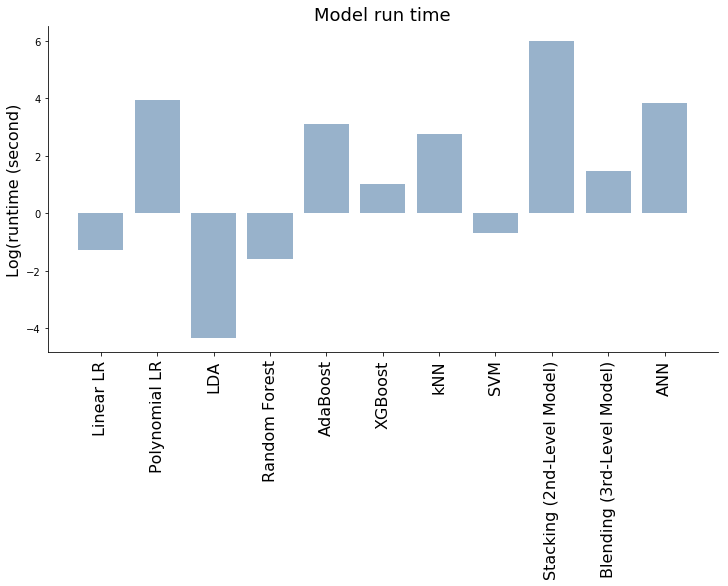

In [511]:
plt.figure(figsize=(12,6))
xx = range(len(df_var))
index_name=df_var.index
plt.bar(xx, np.log(df_var['training time(s)']),  alpha=0.5,color=(0.2, 0.4, 0.6, 0.6))
plt.title('Model run time', fontsize=18)
plt.ylabel('Log(runtime (second)', fontsize=16)
plt.xticks(xx,index_name,rotation=90,fontsize = 16);
sns.despine()

### Accuracy comparison


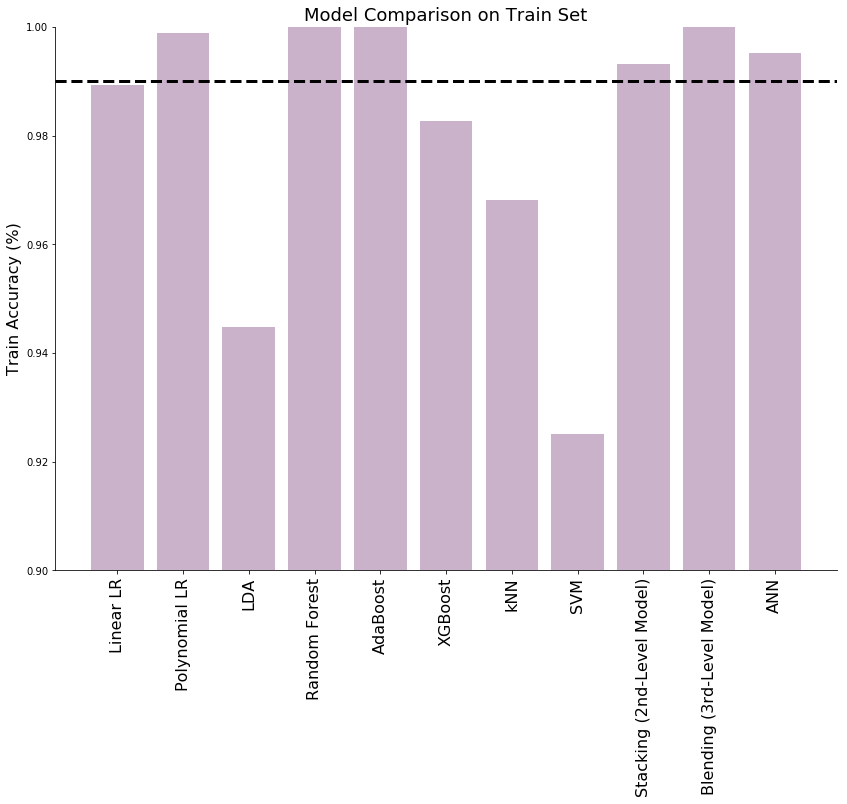

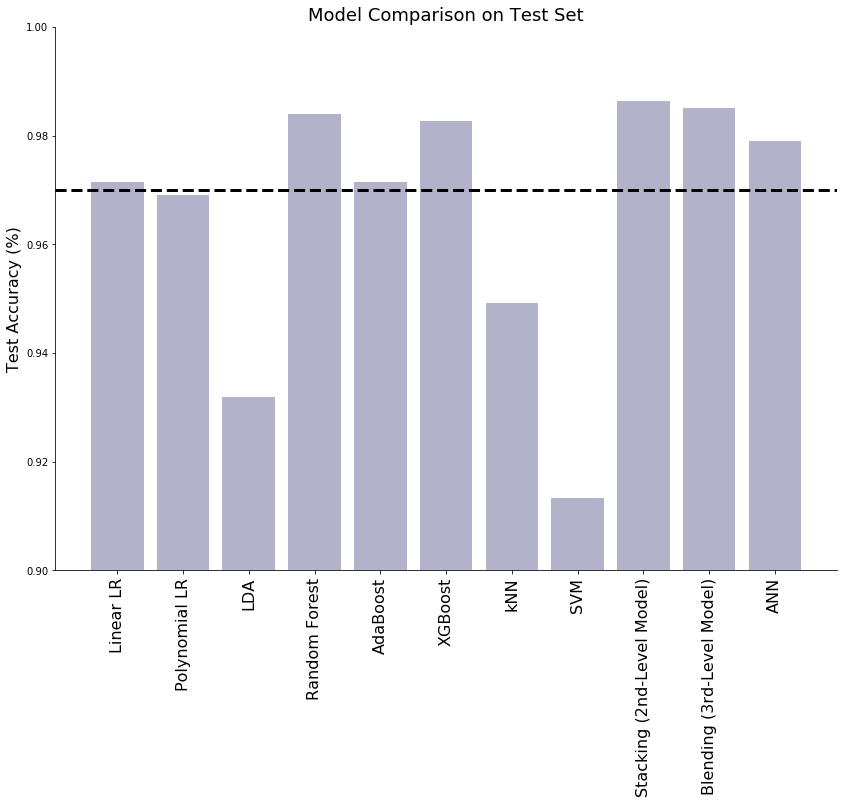

In [525]:
plt.figure(figsize=(14,10))
xx = range(len(df_var))
index_name=df_var.index
plt.bar(xx, df_var['train accuracy'], color=(0.6, 0.4, 0.6, 0.6), alpha=0.5)
plt.ylim(0.9,1)
plt.title('Model Comparison on Train Set', fontsize=18)
plt.ylabel('Train Accuracy (%)', fontsize=16)
plt.xticks(xx,index_name,rotation=90,fontsize = 16);
sns.despine()

plt.axhline(0.99, c='k', linewidth=3, linestyle='--');

plt.figure(figsize=(14,10))
xx = range(len(df_var))
index_name=df_var.index
plt.bar(xx, df_var['test accuracy'], color=(0.4, 0.4, 0.6, 0.6), alpha=0.5)
plt.ylim(0.9,1)
plt.title('Model Comparison on Test Set', fontsize=18)
plt.ylabel('Test Accuracy (%)', fontsize=16)
plt.xticks(xx,index_name,rotation=90,fontsize = 16);
plt.axhline(0.97, c='k', linewidth=3, linestyle='--');
sns.despine()

* In terms of the model runtime,  linear logistic regression (Linear LR), LDA , random forest and SVM take less than 1 second to run. Stacking is the slowest one, which takes 399 seconds to run. Actually, this is still not too bad for small dataset (1883 observations and  50 features) as in our case. If we need to run it for a huge dataset, we may need to consider the computational expense.


* In terms of the model accuracy, Polynomial logistic regression,  random fores, Adaboost, stacking, blending and ANN yield a training set accuray higher than 99%. The accuray score from the test set in random forest, Adaboost, XGBoost, stacking, blending and ANN are higher than 97%, which are really good.

* Overall, the advanced models with the NLP features perform really good. 

### Generating predictions for future usage

In [470]:
test_prediction = pd.DataFrame(
    {'Actual': Y_test,
 'Linear LR':y_pred_logreg,
     'Polynomial LR':y_pred_linearLogCVpoly,
     'LDA':y_pred_lda,
     'Random Forest':rf_y_test,
     'AdaBoost':y_test_adaboost,
     'XGBoost':y_pred_test_xgb,
     'kNN':y_test_pred_best_k ,
     'SVM':y_pre_test_svm,
     'Stacking (2nd-Level Model)':predictions,
     'Blending (3rd-Level Model)':preds,
     'ANN':y_pre_test_NN,
     'Linear LR_prob':y_pred_logreg_proba,
     'Polynomial LR_proba':y_pred_linearLogCVpoly_proba,
     'LDA_proba':y_pred_lda_proba,
     'Random Forest_proba':rf_y_test_proba,
     'AdaBoost_proba':y_test_adaboost_proba,
     'XGBoost_proba':y_pred_test_xgb_proba,
     'kNN_proba':y_test_pred_best_k_proba,
     'SVM_proba':y_pre_svm_proba,
     'ANN_proba':y_pre_test_NN_proba[:,0],
    })
test_prediction.to_csv('test_pred_df.csv')

# <img style="float: left; padding-right: 10px; width: 45px" src="https://raw.githubusercontent.com/Harvard-IACS/2018-CS109A/master/content/styles/iacs.png"> AC209a Twitter Project - Group 15

## Experiments with Twitter API

**Harvard University**<br/>
**Fall 2018**<br/>
**Project Authors**: Claire Stolz, Matthew Stewart, Yiming Qin & Tianning Zhao <br>
**Assigned Teaching Fellow**: Brandon Lee

<hr style="height:2pt">

In [1]:
%%capture
# RUN THIS CELL FOR FORMAT
import requests
from IPython.core.display import HTML
styles = requests.get("https://raw.githubusercontent.com/Harvard-IACS/2018-CS109A/master/content/styles/cs109.css").text
HTML(styles)

### Important packages

1. `Tweepy` - Twitter API - http://docs.tweepy.org/en/v3.5.0/api.html#tweepy-api-twitter-api-wrapper

2. `nltk` - Natural language processing library - http://www.nltk.org/howto/twitter.html

3. `twython` - Python wrapper for the Twitter API

4. `jsonpickle` - converts Python objects into JSON

5. `scikit-learn` - Python machine learning library

https://github.com/Jefferson-Henrique/GetOldTweets-python

In [2]:
%%capture
!pip install --upgrade jsonpickle tweepy

import sys
import jsonpickle
import os
import numpy as np
import pandas as pd
import tweepy
import nltk
import pandas as pd
import json
import sklearn
import datetime
from datetime import datetime
import statsmodels.api as sm
from statsmodels.api import OLS
from sklearn import preprocessing
from sklearn.preprocessing import PolynomialFeatures
from sklearn.metrics import r2_score
from sklearn.metrics import accuracy_score
from sklearn.linear_model import LogisticRegression
from sklearn.linear_model import LogisticRegressionCV
from sklearn.pipeline import make_pipeline
from sklearn.preprocessing import PolynomialFeatures
from sklearn.model_selection import train_test_split
from pandas.plotting import scatter_matrix
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis
from sklearn.discriminant_analysis import QuadraticDiscriminantAnalysis
from sklearn.ensemble import AdaBoostClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report,confusion_matrix
from sklearn.model_selection import GridSearchCV
from sklearn.ensemble import GradientBoostingClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report,confusion_matrix
from sklearn.model_selection import GridSearchCV
from sklearn.ensemble import GradientBoostingClassifier
import xgboost as xgb
from sklearn.metrics import confusion_matrix
from sklearn.neighbors import KNeighborsClassifier
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import KFold
from sklearn.svm import SVC

from sklearn import svm
import seaborn as sns
import matplotlib.pyplot as plt
import matplotlib
%matplotlib inline
from pandas.io.json import json_normalize

import warnings
warnings.filterwarnings('ignore')

# Baseline Model  with Multiple Features

In [7]:
bot_df = pd.read_csv(r"bot_df_final.csv",index_col='User ID')
user_df = pd.read_csv(r"user_df_final.csv",index_col='User ID')
pre_df=pd.read_csv(r"pred_dataframe.csv",index_col='User ID')

In [8]:
bot_df['bot']=1
user_df['bot']=0
total_df = bot_df.append(user_df)

In [10]:
train_data, test_data = train_test_split(total_df, test_size = 0.3, random_state=99)

Y_train=train_data['bot']
Y_test=test_data['bot']
X_train=train_data.drop('bot',axis=1)
X_test=test_data.drop('bot',axis=1)
X_train = X_train.drop(['Account age (days)'], axis=1)
X_test = X_test.drop(['Account age (days)'], axis=1)
pre_df= pre_df.drop(['Account age (days)'], axis=1)

In [15]:
print(np.count_nonzero(Y_test)/len(Y_test))
print(np.count_nonzero(Y_train)/len(Y_train))

0.4582123265569539
0.46250691754288875


In [16]:
def normalize(df,df_train):
    result = df.copy()
    for feature_name in df_train.columns:
        max_value = df_train[feature_name].max()
        min_value = df_train[feature_name].min()
#         print(max_value)
#         print(min_value)
        result[feature_name] = (df[feature_name] - min_value) / (max_value - min_value)
    return result

In [17]:
pre_df=pre_df.replace([np.inf, -np.inf], np.nan).dropna()

In [18]:
pre_df.describe()

,Screen name length,Number of digits in screen name,User name length,Default profile (binary),Default picture (binary),Number of unique profile descriptions,Number of friends,Number of followers,Number of favorites,Number of tweets per hour,Number of tweets total,timing_tweet
count,898.000000,898.000000,898.000000,898.000000,898.000000,898.000000,898.000000,898.000000,898.000000,898.000000,898.000000,898.000000
mean,11.000000,1.061247,12.674833,0.643653,0.077951,2.008909,2672.840757,4880.376392,35006.447661,1.449599,42675.455457,81731.374934
std,2.674459,1.893376,6.594908,0.479186,0.268244,1.724610,6142.131540,27176.416094,55468.272539,2.499741,75099.651500,8480.532350
min,4.000000,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000161,4.000000,13979.500000
25%,9.000000,0.000000,8.250000,0.000000,0.000000,1.000000,245.000000,165.000000,3593.250000,0.156075,4545.750000,79824.062500
50%,11.000000,0.000000,12.000000,1.000000,0.000000,1.000000,805.500000,547.000000,14746.500000,0.562062,17373.000000,85980.375000
75%,13.000000,2.000000,15.000000,1.000000,0.000000,2.000000,2552.250000,2267.250000,41380.250000,1.528112,49313.000000,86337.093750
max,15.000000,12.000000,49.000000,1.000000,1.000000,13.000000,59673.000000,538241.000000,507978.000000,23.337742,859699.000000,86397.125000


In [19]:
X_train_scaled=normalize(X_train,X_train)
X_test_scaled=normalize(X_test,X_train)
pre_df_scaled=normalize(pre_df,X_train)

pre_df_scaled.describe()
X_train_scaled.describe()

,Screen name length,Number of digits in screen name,User name length,Default profile (binary),Default picture (binary),Number of unique profile descriptions,Number of friends,Number of followers,Number of favorites,Number of tweets per hour,Number of tweets total,timing_tweet
count,7228.000000,7228.000000,7228.000000,7228.00000,7228.000000,7228.000000,7228.000000,7228.000000,7228.000000,7228.000000,7228.000000,7228.000000
mean,0.674886,0.034985,0.238093,0.11746,0.021444,0.052617,0.006716,0.000971,0.008639,0.013461,0.012956,0.714728
std,0.209579,0.106568,0.103235,0.32199,0.144870,0.100262,0.027937,0.014857,0.035578,0.030983,0.031082,0.180496
min,0.000000,0.000000,0.000000,0.00000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,0.538462,0.000000,0.173913,0.00000,0.000000,0.000000,0.000405,0.000013,0.000000,0.000420,0.000401,0.587018
50%,0.692308,0.000000,0.239130,0.00000,0.000000,0.000000,0.001066,0.000048,0.000108,0.003439,0.003246,0.729007
75%,0.846154,0.000000,0.304348,0.00000,0.000000,0.062500,0.003756,0.000215,0.002561,0.013423,0.012798,0.870857
max,1.000000,1.000000,1.000000,1.00000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000


## Logistic Regression

In [23]:
logreg = LogisticRegression(C=100000,fit_intercept=True).fit(X_train_scaled,Y_train)
logreg_train = logreg.score(X_train_scaled, Y_train)
#accuracy_score(Y_train,logreg.predict(X_train_scaled), normalize=True)
print('Accuracy of logistic regression model on training set is {:.3f}'.format(logreg_train))
# Classification error on test set
#logreg_test = accuracy_score(logreg.predict(X_test_scaled), Y_test, normalize=True)
logreg_test = logreg.score(X_test_scaled, Y_test)
print('Accuracy of logistic regression model on the test set is {:.3f}'.format(logreg_test))

Accuracy of logistic regression model on training set is 0.775
Accuracy of logistic regression model on the test set is 0.767


In [24]:
y_pre_df_logreg= logreg.predict(pre_df_scaled)

In [25]:
# Logistic regression w/ quadratic + interaction terms + regularization
polynomial_logreg_estimator = make_pipeline(
    PolynomialFeatures(degree=2, include_bias=True),
    LogisticRegressionCV(multi_class="ovr", penalty='l2', cv=5, max_iter=10000))
linearLogCVpoly = polynomial_logreg_estimator.fit(X_train_scaled, Y_train)
# Compare results
print('Polynomial-logistic accuracy: train={:.1%}, test={:.1%}'.format(
    linearLogCVpoly.score(X_train_scaled, Y_train), linearLogCVpoly.score(X_test_scaled, Y_test)))
linearLogCVpoly_train = linearLogCVpoly.score(X_train_scaled, Y_train)
linearLogCVpoly_test = linearLogCVpoly.score(X_test_scaled, Y_test)

Polynomial-logistic accuracy: train=80.1%, test=79.0%


In [26]:
y_pre_df_PolyL = linearLogCVpoly.predict(pre_df_scaled)

The logistic regression model does a pretty good job of separating bots from legimitate users with just two features. Once more features are used, the model should be able to predict bots with an even higher accuracy.

## LDA and QDA Model

In this section we run LDA and QDA models to classify the users into either bots or legitimate users.

In [27]:
lda = LinearDiscriminantAnalysis(store_covariance=True)
qda = QuadraticDiscriminantAnalysis(store_covariance=True)
lda.fit(X_train_scaled, Y_train)
qda.fit(X_train_scaled, Y_train)
lda.predict(X_test_scaled)
qda.predict(X_test_scaled)

print('LDA accuracy train={:.1%}, test: {:.1%}'.format(
    lda.score(X_train_scaled, Y_train), lda.score(X_test_scaled, Y_test)))

lda_train = lda.score(X_train_scaled, Y_train)
lda_test = lda.score(X_test_scaled, Y_test)

print('QDA accuracy train={:.1%}, test: {:.1%}'.format(
    qda.score(X_train_scaled, Y_train), qda.score(X_test_scaled, Y_test)))

qda_train = qda.score(X_train_scaled, Y_train)
qda_test = qda.score(X_test_scaled, Y_test)

LDA accuracy train=70.1%, test: 69.9%
QDA accuracy train=68.9%, test: 69.6%


In [28]:
y_pre_df_lda = lda.predict(pre_df_scaled)

In [29]:
y_pre_df_qda = qda.predict(pre_df_scaled)

We see here that the LDA and QDA models perform relatively well at separating this data. However, it did not perform as well as the logistic regression method.

## Random forest

In [30]:
ntrees = 50
rf = RandomForestClassifier(n_estimators=ntrees , max_depth=15, max_features='auto')
rf.fit(X_train_scaled, Y_train)
rf_train =rf.score(X_train_scaled, Y_train)
rf_test =rf.score(X_test_scaled, Y_test)

print('RF accuracy train={:.1%}, test: {:.1%}'.format(rf_train,rf_test))


y_pre_df_rf = rf.predict(pre_df_scaled)


RF accuracy train=99.3%, test: 89.4%


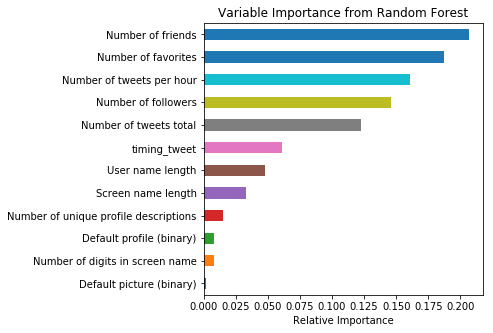

In [31]:
plt.figure(figsize=(5,5))
plt.title('Variable Importance from Random Forest')
plt.xlabel('Relative Importance')
pd.Series(rf.feature_importances_,index=list(X_train_scaled)).sort_values().plot(kind="barh")

In [33]:
y_pre_df_rf.nonzero()

(array([ 23,  83,  84,  87,  95, 156, 162, 173, 195, 262, 265, 267, 290,
        292, 305, 313, 322, 425, 461, 466, 469, 484, 538, 550, 570, 577,
        581, 583, 590, 601, 631, 655, 688, 714, 718, 724, 725, 762, 764,
        787, 844, 875, 891]),)

## Adaboost

In [34]:
adaboost = AdaBoostClassifier(base_estimator=DecisionTreeClassifier(max_depth=5), n_estimators=800, learning_rate=0.01)
adaboost.fit(X_train_scaled, Y_train);

In [38]:
y_pred_test = adaboost.predict(X_test_scaled)
pred_adaboost = [round(value) for value in y_pred_test]
accuracy = accuracy_score(Y_test, pred_adaboost)
print('test acc:',accuracy)

test acc: 0.8783478541464989


In [39]:
y_pre_df_adaboost = adaboost.predict(pre_df_scaled)
np.nonzero(y_pre_df_adaboost)
List = np.nonzero(y_pre_df_adaboost)

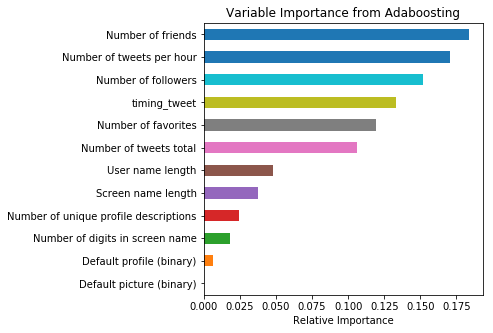

In [43]:
plt.figure(figsize=(5,5))
plt.title('Variable Importance from Adaboosting')
plt.xlabel('Relative Importance')
pd.Series(adaboost.feature_importances_,index=list(X_train_scaled)).sort_values().plot(kind="barh")

In [47]:
import xgboost as xgb
from sklearn.metrics import confusion_matrix


xgb = xgb.XGBClassifier(max_depth=5, n_estimators=300, learning_rate=0.01).fit(X_train_scaled, Y_train)
y_pred_test_xgb = xgb.predict(X_test_scaled)
accuracy_xgb = accuracy_score(Y_test, y_pred_test_xgb)


print("test Accuracy: %.2f%%" % (accuracy_xgb * 100.0))

y_pre_df_xgboost = xgb.predict(pre_df_scaled)


test Accuracy: 88.77%


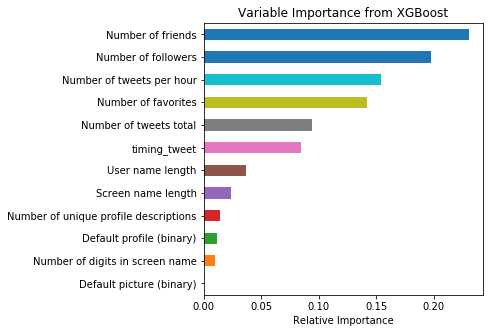

In [48]:
plt.figure(figsize=(5,5))
plt.title('Variable Importance from XGBoost')
plt.xlabel('Relative Importance')
pd.Series(xgb.feature_importances_,index=list(X_train_scaled)).sort_values().plot(kind="barh")

In [49]:
from sklearn.neighbors import KNeighborsClassifier
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import KFold

scores_mean=[]
scores_std=[]

k_number=np.arange(1,40)

for k in range(1,40):
    knn = KNeighborsClassifier(n_neighbors = k)
    score_mean= cross_val_score(knn,X_train_scaled,Y_train,cv=5).mean()
    score_std=cross_val_score(knn,X_train_scaled,Y_train,cv=5).std()
    scores_mean.append(score_mean)

In [50]:
max_score_k=max(scores_mean)
best_k=scores_mean.index(max(scores_mean))+1
print('Best K=',best_k, 'with a max CV score of',max_score_k)

knn_best_k = KNeighborsClassifier(n_neighbors = best_k)
knn_best_k.fit(X_train_scaled,Y_train);

pred_best_k = knn_best_k.predict(X_test_scaled)

print('test accuracy',accuracy_score(Y_test, pred_best_k))

knn_best_k_train = knn_best_k.score(X_train_scaled, Y_train)
knn_best_k_test = knn_best_k.score(X_test_scaled, Y_test)

Best K= 6 with a max CV score of 0.6703148645350256
test accuracy 0.6773152629880607


In [51]:
y_pre_df_KNN = knn_best_k.predict(pre_df_scaled)


## Support Vector Machines

In this section we will use a support vector machine technique to separate the data.

In [53]:
def fit_and_plot_svm_for_c(x_train, y_train, x_test, y_test,pre_df, C):
    # Fit SVM model
    model = svm.SVC(C=C, kernel='linear')
    model.fit(x_train, y_train)
    
    # Train and test error
    tr_acc = model.score(x_train, y_train)
    ts_acc = model.score(x_test, y_test)
    pre_svm = model.predict(pre_df)
    return tr_acc, ts_acc,pre_svm

In [55]:
# Fit and plot for different 'C' values
tr_acc, ts_acc,y_pre_df_svm = fit_and_plot_svm_for_c(X_train_scaled, Y_train,X_test_scaled, Y_test, pre_df_scaled, 0.1)

In [56]:
print(tr, ts_acc)

0.6473436635307139 0.6534365924491772


## Stacked Model

Model stacking is an efficient ensemble method in which the predictions, generated by using various machine learning algorithms, are used as inputs in a second-layer learning algorithm. This second-layer algorithm is trained to optimally combine the model predictions to form a new set of predictions. For example, when linear regression is used as second-layer modeling, it estimates these weights by minimizing the least square errors. However, the second-layer modeling is not restricted to only linear models; the relationship between the predictors can be more complex, opening the door to employing other machine learning algorithms.

![title](modelstacking.png)

Ensemble modeling and model stacking are especially popular in data science competitions, in which a sponsor posts a training set (which includes labels) and a test set (which does not include labels) and issues a global challenge to produce the best predictions of the test set for a specified performance criterion. The winning teams almost always use ensemble models instead of a single fine-tuned model. Often individual teams develop their own ensemble models in the early stages of the competition, and then join their forces in the later stages. 

Another popular data science competition is the KDD Cup. The following figure shows the winning solution for the 2015 competition, which used a three-stage stacked modeling approach. A similar approach will be trialed for this project to try and obtain maximal predictive capability.

![title](stackedapproach.png)

The figure shows that a diverse set of 64 single models were used to build the model library. These models are trained by using various machine learning algorithms. For example, the green boxes represent gradient boosting models (GBM), pink boxes represent neural network models (NN), and orange boxes represent factorization machines models (FM). You can see that there are multiple gradient boosting models in the model library; they probably vary in their use of different hyperparameter settings and/or feature sets.

A simple way to enhance diversity is to train models by using different machine learning algorithms. For example, adding a factorization model to a set of tree-based models (such as random forest and gradient boosting) provides a nice diversity because a factorization model is trained very differently than decision tree models are trained. For the same machine learning algorithm, you can enhance diversity by using different hyperparameter settings and subsets of variables. If you have many features, one efficient method is to choose subsets of the variables by simple random sampling.

Overfitting is an especially big problem in model stacking, because so many predictors that all predict the same target are combined. Overfitting is partially caused by this collinearity between the predictors. The most efficient techniques for training models (especially during the stacking stages) include using cross validation and some form of regularization. A good paper that outlines this procedure is [Stacked Ensemble Models for Improved Prediction Accuracy](https://support.sas.com/resources/papers/proceedings17/SAS0437-2017.pdf).

That paper also shows how you can generate a diverse set of models by various methods (such as forests, gradient boosted decision trees, factorization machines, and logistic regression) and then combine them with stacked ensemble techniques such regularized regression methods, gradient boosting, and hill climbing methods.

![title](levels.png)

Applying stacked models to real-world big data problems can produce greater prediction accuracy and robustness than do individual models. The model stacking approach is powerful and compelling enough to alter your initial data mining mindset from finding the single best model to finding a collection of really good complementary models. Of course, this method does involve additional cost both because you need to train a large number of models and because you need to use cross validation to avoid overfitting.

## Stacked Model

In this section we will try to implement a stacked model similar to that proposed in the "[Stacked Ensemble Models for Improved Prediction Accuracy](https://support.sas.com/resources/papers/proceedings17/SAS0437-2017.pdf)" paper.

In [57]:
# Going to use these 5 base models for the stacking
from sklearn.ensemble import (RandomForestClassifier, AdaBoostClassifier, 
                              GradientBoostingClassifier, ExtraTreesClassifier)
from sklearn.svm import SVC

## Helpers via Python Classes

In the section of code below, we essentially write a class SklearnHelper that allows one to extend the inbuilt methods (such as train, predict and fit) common to all the Sklearn classifiers. Therefore this cuts out redundancy as won't need to write the same methods five times if we wanted to invoke five different classifiers.

In [59]:
# Some useful parameters which will come in handy later on
ntrain = X_train_scaled.shape[0]
ntest = X_test_scaled.shape[0]
n_pre_df=pre_df_scaled.shape[0]
SEED = 99 # for reproducibility
NFOLDS = 5 # set folds for out-of-fold prediction

kf = KFold(n_splits = NFOLDS, random_state=SEED)

# Class to extend the Sklearn classifier
class SklearnHelper(object):
    def __init__(self, clf, seed=0, params=None):
        params['random_state'] = seed
        self.clf = clf(**params)

    def train(self, x_train, y_train):
        self.clf.fit(x_train, y_train)

    def predict(self, x):
        return self.clf.predict(x)
    
    def fit(self,x,y):
        return self.clf.fit(x,y)
    
    def feature_importances(self,x,y):
            print(self.clf.fit(x,y).feature_importances_)

**def init :** Python standard for invoking the default constructor for the class. This means that when you want to create an object (classifier), you have to give it the parameters of clf (what sklearn classifier you want), seed (random seed) and params (parameters for the classifiers).

The rest of the code are simply methods of the class which simply call the corresponding methods already existing within the sklearn classifiers. Essentially, we have created a wrapper class to extend the various Sklearn classifiers so that this should help us reduce having to write the same code over and over when we implement multiple learners to our stacker.

### Out-of-Fold Predictions

Stacking uses predictions of base classifiers as input for training to a second-level model. However one cannot simply train the base models on the full training data, generate predictions on the full test set and then output these for the second-level training. This runs the risk of your base model predictions already having "seen" the test set and therefore overfitting when feeding these predictions.

In [60]:
def get_oof(clf, x_train, y_train, x_test):
    oof_train = np.zeros((ntrain,))
    oof_test = np.zeros((ntest,))
    oof_test_skf = np.empty((NFOLDS, ntest))

    for i, (train_index, test_index) in enumerate(kf.split(x_train)):

        x_tr = x_train.iloc[train_index]
        y_tr = y_train.iloc[train_index]
        x_te = x_train.iloc[test_index]
        clf.train(x_tr, y_tr)

        oof_train[test_index] = clf.predict(x_te)
        oof_test_skf[i, :] = clf.predict(x_test)

    oof_test[:] = oof_test_skf.mean(axis=0)
    return oof_train.reshape(-1, 1), oof_test.reshape(-1, 1)

### Generating our Base First-Level Models

So now let us prepare five learning models as our first level classification. These models can all be conveniently invoked via the Sklearn library and are listed as follows:

- **Random Forest classifier**
- **Extra Trees classifier**
- **AdaBoost classifer**
- **Gradient Boosting classifer**
- **Support Vector Machine**

**Parameters**

**n_jobs :** Number of cores used for the training process. If set to -1, all cores are used.

**n_estimators :** Number of classification trees in your learning model ( set to 10 per default)

**max_depth :** Maximum depth of tree, or how much a node should be expanded. Beware if set to too high a number would run the risk of overfitting as one would be growing the tree too deep

**verbose :** Controls whether you want to output any text during the learning process. A value of 0 suppresses all text while a value of 3 outputs the tree learning process at every iteration.

In [61]:
# Put in our parameters for said classifiers
# Random Forest parameters
rf_params = {
    'n_jobs': -1,
    'n_estimators': 500,
     'warm_start': True, 
     #'max_features': 0.2,
    'max_depth': 6,
    'min_samples_leaf': 2,
    'max_features' : 'sqrt',
    'verbose': 0
}

# Extra Trees Parameters
et_params = {
    'n_jobs': -1,
    'n_estimators':500,
    #'max_features': 0.5,
    'max_depth': 4,
    'min_samples_leaf': 2,
    'verbose': 0
}

# AdaBoost parameters
ada_params = {
    'n_estimators': 500,
    'learning_rate' : 0.75
}

# Gradient Boosting parameters
gb_params = {
    'n_estimators': 500,
     #'max_features': 0.2,
    'max_depth': 5,
    'min_samples_leaf': 2,
    'verbose': 0
}

# Support Vector Classifier parameters 
svc_params = {
    'kernel' : 'sigmoid',
    'C' : 0.1
    }

logreg_params = {'C':100000, 'fit_intercept': True}
lda_params = {'store_covariance': True}
qda_params = {'store_covariance': True}
polylogreg_params = {}

Let us now create 5 objects that represent our 5 learning models via our Helper Sklearn Class we defined earlier.

In [62]:
# Create 5 objects that represent our 4 models
rf = SklearnHelper(clf=RandomForestClassifier, seed=SEED, params=rf_params)
et = SklearnHelper(clf=ExtraTreesClassifier, seed=SEED, params=et_params)
ada = SklearnHelper(clf=AdaBoostClassifier, seed=SEED, params=ada_params)
gb = SklearnHelper(clf=GradientBoostingClassifier, seed=SEED, params=gb_params)
svc = SklearnHelper(clf=SVC, seed=SEED, params=svc_params)
logreg_stack = SklearnHelper(clf=LogisticRegression, seed=SEED, params=logreg_params)

### Output of the First level Predictions

We now feed the training and test data into our 5 base classifiers and use the Out-of-Fold prediction function we defined earlier to generate our first level predictions. Allow a handful of minutes for the chunk of code below to run.

In [63]:
# Create our OOF train and test predictions. These base results will be used as new features
et_oof_train, et_oof_test = get_oof(et, X_train_scaled, Y_train, X_test_scaled) # Extra Trees
rf_oof_train, rf_oof_test = get_oof(rf,X_train_scaled, Y_train, X_test_scaled) # Random Forest
ada_oof_train, ada_oof_test = get_oof(ada, X_train_scaled, Y_train, X_test_scaled) # AdaBoost 
gb_oof_train, gb_oof_test = get_oof(gb,X_train_scaled, Y_train, X_test_scaled) # Gradient Boost
svc_oof_train, svc_oof_test = get_oof(svc,X_train_scaled, Y_train, X_test_scaled) # Support Vector Classifier
logreg_oof_train, logreg_oof_test = get_oof(logreg_stack,X_train_scaled, Y_train, X_test_scaled) # Linear Logistic Regression
#lda_oof_train, lda_oof_test = get_oof(lda_stack,X_train_scaled, Y_train, X_test_scaled) # LDA
#qda_oof_train, qda_oof_test = get_oof(qda_stack,X_train_scaled, Y_train, X_test_scaled) # QDA
#polylogreg_oof_train, polylogreg_oof_test = get_oof(polylogreg_stack,X_train_scaled, Y_train, X_test_scaled) # Polynomial Logistic Regression

print("Training is complete")

Training is complete


### Feature importances generated from the different classifiers

Now having learned our the first-level classifiers, we can utilise a very nifty feature of the Sklearn models and that is to output the importances of the various features in the training and test sets with one very simple line of code.

As per the Sklearn documentation, most of the classifiers are built in with an attribute which returns feature importances by simply typing in .featureimportances. Therefore we will invoke this very useful attribute via our function earliand plot the feature importances as such

In [64]:
rf_feature = rf.feature_importances(X_train_scaled,Y_train);
et_feature = et.feature_importances(X_train_scaled, Y_train);
ada_feature = ada.feature_importances(X_train_scaled, Y_train);
gb_feature = gb.feature_importances(X_train_scaled,Y_train);

[0.01656638 0.00434383 0.03600858 0.00367043 0.00089005 0.00597368
 0.2267005  0.14966568 0.24426343 0.15633657 0.1276319  0.02794898]
[0.27249078 0.04210205 0.19393291 0.02126333 0.00541157 0.05464063
 0.09130192 0.0125889  0.10543186 0.06703275 0.08882293 0.04498036]
[0.012 0.018 0.032 0.002 0.002 0.022 0.126 0.102 0.072 0.252 0.278 0.082]
[0.03865037 0.00898988 0.05324272 0.00779129 0.00147526 0.01991401
 0.17885627 0.17553352 0.12404804 0.14143118 0.13123649 0.11883097]


In [65]:
rf_feature =[0.01656638, 0.00434383, 0.03600858, 0.00367043, 0.00089005, 0.00597368,
 0.2267005,  0.14966568, 0.24426343, 0.15633657, 0.1276319,  0.02794898]
et_feature=[0.27249078, 0.04210205, 0.19393291, 0.02126333, 0.00541157, 0.05464063,
 0.09130192, 0.0125889,  0.10543186, 0.06703275, 0.08882293, 0.04498036]
ada_feature =[0.012, 0.018, 0.032, 0.002, 0.002, 0.022, 0.126, 0.102, 0.072, 0.252, 0.278, 0.082]
gb_feature=[0.03865037, 0.00898988, 0.05324272, 0.00779129, 0.00147526, 0.01991401,
 0.17885627, 0.17553352, 0.12404804, 0.14143118, 0.13123649, 0.11883097]

In [66]:
cols = X_train_scaled.columns.values
display(cols)
# Create a dataframe with features
feature_dataframe = pd.DataFrame( {'features': cols,
     'Random Forest feature importances': rf_feature,
     'Extra Trees  feature importances': et_feature,
      'AdaBoost feature importances': ada_feature,
    'Gradient Boost feature importances': gb_feature
    })

feature_dataframe

array(['Screen name length', 'Number of digits in screen name',
       'User name length', 'Default profile (binary)',
       'Default picture (binary)',
       'Number of unique profile descriptions', 'Number of friends',
       'Number of followers', 'Number of favorites',
       'Number of tweets per hour', 'Number of tweets total',
       'timing_tweet'], dtype=object)

,features,Random Forest feature importances,Extra Trees feature importances,AdaBoost feature importances,Gradient Boost feature importances
0,Screen name length,0.016566,0.272491,0.012,0.038650
1,Number of digits in screen name,0.004344,0.042102,0.018,0.008990
2,User name length,0.036009,0.193933,0.032,0.053243
3,Default profile (binary),0.003670,0.021263,0.002,0.007791
4,Default picture (binary),0.000890,0.005412,0.002,0.001475
5,Number of unique profile descriptions,0.005974,0.054641,0.022,0.019914
6,Number of friends,0.226700,0.091302,0.126,0.178856
7,Number of followers,0.149666,0.012589,0.102,0.175534
8,Number of favorites,0.244263,0.105432,0.072,0.124048
9,Number of tweets per hour,0.156337,0.067033,0.252,0.141431


In [67]:
import plotly
import plotly.offline as py
py.init_notebook_mode(connected=True)
import plotly.graph_objs as go
import plotly.tools as tls

In [68]:
# Scatter plot 
trace = go.Scatter(
    y = feature_dataframe['Random Forest feature importances'].values,
    x = feature_dataframe['features'].values,
    mode='markers',
    marker=dict(
        sizemode = 'diameter',
        sizeref = 1,
        size = 25,
#       size= feature_dataframe['AdaBoost feature importances'].values,
        #color = np.random.randn(500), #set color equal to a variable
        color = feature_dataframe['Random Forest feature importances'].values,
        colorscale='Portland',
        showscale=True
    ),
    text = feature_dataframe['features'].values
)
data = [trace]


layout= go.Layout(
    autosize= True,
    title= 'Random Forest Feature Importance',
    hovermode= 'closest',
#     xaxis= dict(
#         title= 'Pop',
#         ticklen= 5,
#         zeroline= False,
#         gridwidth= 2,
#     ),
    yaxis=dict(
        title= 'Feature Importance',
        ticklen= 5,
        gridwidth= 2
    ),
    showlegend= False
)
fig = go.Figure(data=data, layout=layout)
py.iplot(fig,filename='scatter2010')

# Scatter plot 
trace = go.Scatter(
    y = feature_dataframe['Extra Trees  feature importances'].values,
    x = feature_dataframe['features'].values,
    mode='markers',
    marker=dict(
        sizemode = 'diameter',
        sizeref = 1,
        size = 25,
#       size= feature_dataframe['AdaBoost feature importances'].values,
        #color = np.random.randn(500), #set color equal to a variable
        color = feature_dataframe['Extra Trees  feature importances'].values,
        colorscale='Portland',
        showscale=True
    ),
    text = feature_dataframe['features'].values
)
data = [trace]

layout= go.Layout(
    autosize= True,
    title= 'Extra Trees Feature Importance',
    hovermode= 'closest',
#     xaxis= dict(
#         title= 'Pop',
#         ticklen= 5,
#         zeroline= False,
#         gridwidth= 2,
#     ),
    yaxis=dict(
        title= 'Feature Importance',
        ticklen= 5,
        gridwidth= 2
    ),
    showlegend= False
)
fig = go.Figure(data=data, layout=layout)
py.iplot(fig,filename='scatter2010')

# Scatter plot 
trace = go.Scatter(
    y = feature_dataframe['AdaBoost feature importances'].values,
    x = feature_dataframe['features'].values,
    mode='markers',
    marker=dict(
        sizemode = 'diameter',
        sizeref = 1,
        size = 25,
#       size= feature_dataframe['AdaBoost feature importances'].values,
        #color = np.random.randn(500), #set color equal to a variable
        color = feature_dataframe['AdaBoost feature importances'].values,
        colorscale='Portland',
        showscale=True
    ),
    text = feature_dataframe['features'].values
)
data = [trace]

layout= go.Layout(
    autosize= True,
    title= 'AdaBoost Feature Importance',
    hovermode= 'closest',
#     xaxis= dict(
#         title= 'Pop',
#         ticklen= 5,
#         zeroline= False,
#         gridwidth= 2,
#     ),
    yaxis=dict(
        title= 'Feature Importance',
        ticklen= 5,
        gridwidth= 2
    ),
    showlegend= False
)
fig = go.Figure(data=data, layout=layout)
py.iplot(fig,filename='scatter2010')

# Scatter plot 
trace = go.Scatter(
    y = feature_dataframe['Gradient Boost feature importances'].values,
    x = feature_dataframe['features'].values,
    mode='markers',
    marker=dict(
        sizemode = 'diameter',
        sizeref = 1,
        size = 25,
#       size= feature_dataframe['AdaBoost feature importances'].values,
        #color = np.random.randn(500), #set color equal to a variable
        color = feature_dataframe['Gradient Boost feature importances'].values,
        colorscale='Portland',
        showscale=True
    ),
    text = feature_dataframe['features'].values
)
data = [trace]

layout= go.Layout(
    autosize= True,
    title= 'Gradient Boosting Feature Importance',
    hovermode= 'closest',
#     xaxis= dict(
#         title= 'Pop',
#         ticklen= 5,
#         zeroline= False,
#         gridwidth= 2,
#     ),
    yaxis=dict(
        title= 'Feature Importance',
        ticklen= 5,
        gridwidth= 2
    ),
    showlegend= False
)
fig = go.Figure(data=data, layout=layout)
py.iplot(fig,filename='scatter2010')

In [69]:
# Create the new column containing the average of values
feature_dataframe['mean'] = feature_dataframe.mean(axis= 1) # axis = 1 computes the mean row-wise
feature_dataframe.head(3)

,features,Random Forest feature importances,Extra Trees feature importances,AdaBoost feature importances,Gradient Boost feature importances,mean
0,Screen name length,0.016566,0.272491,0.012,0.038650,0.084927
1,Number of digits in screen name,0.004344,0.042102,0.018,0.008990,0.018359
2,User name length,0.036009,0.193933,0.032,0.053243,0.078796


### Plotly Barplot of Average Feature Importances

Having obtained the mean feature importance across all our classifiers, we can plot them into a Plotly bar plot as follows:

In [70]:
y = feature_dataframe['mean'].values
x = feature_dataframe['features'].values
data = [go.Bar(
            x= x,
             y= y,
            width = 0.5,
            marker=dict(
               color = feature_dataframe['mean'].values,
            colorscale='Portland',
            showscale=True,
            reversescale = False
            ),
            opacity=0.6
        )]

layout= go.Layout(
    autosize= True,
    title= 'Barplots of Mean Feature Importance',
    hovermode= 'closest',
#     xaxis= dict(
#         title= 'Pop',
#         ticklen= 5,
#         zeroline= False,
#         gridwidth= 2,
#     ),
    yaxis=dict(
        title= 'Feature Importance',
        ticklen= 5,
        gridwidth= 2
    ),
    showlegend= False
)
fig = go.Figure(data=data, layout=layout)
py.iplot(fig, filename='bar-direct-labels')

## Second-Level Predictions from the First-level Output

### First-level output as new features

Having now obtained our first-level predictions, one can think of it as essentially building a new set of features to be used as training data for the next classifier. As per the code below, we are therefore having as our new columns the first-level predictions from our earlier classifiers and we train the next classifier on this.

In [71]:
base_predictions_train = pd.DataFrame( {'RandomForest': rf_oof_train.ravel(),
     'ExtraTrees': et_oof_train.ravel(),
     'AdaBoost': ada_oof_train.ravel(),
      'GradientBoost': gb_oof_train.ravel(),
        'Logistic Regression': logreg_oof_train.ravel()
    })
display(base_predictions_train.head())

base_predictions_test = pd.DataFrame( {'RandomForest': rf_oof_test.ravel(),
     'ExtraTrees': et_oof_test.ravel(),
     'AdaBoost': ada_oof_test.ravel(),
      'GradientBoost': gb_oof_test.ravel(),
        'Logistic Regression': logreg_oof_test.ravel()
    })
base_predictions_test.head()


,RandomForest,ExtraTrees,AdaBoost,GradientBoost,Logistic Regression
0,0.0,0.0,0.0,0.0,0.0
1,0.0,0.0,0.0,0.0,0.0
2,0.0,0.0,0.0,0.0,0.0
3,0.0,0.0,0.0,0.0,0.0
4,0.0,0.0,0.0,0.0,0.0


,RandomForest,ExtraTrees,AdaBoost,GradientBoost,Logistic Regression
0,0.0,0.0,0.0,0.0,0.0
1,1.0,1.0,1.0,1.0,1.0
2,0.0,0.0,0.0,0.0,0.0
3,1.0,0.0,0.8,0.4,0.0
4,0.0,0.0,0.0,0.0,0.0


### Correlation Heatmap of the Second Level Training set

In [72]:
data = [
    go.Heatmap(
        z= base_predictions_train.astype(float).corr().values ,
        x=base_predictions_train.columns.values,
        y= base_predictions_train.columns.values,
          colorscale='Viridis',
            showscale=True,
            reversescale = True
    )
]
py.iplot(data, filename='labelled-heatmap')

In [73]:

x_train = np.concatenate((0.4*ada_oof_train, 0.2*svc_oof_train, 0.2*rf_oof_train, 0.35*logreg_oof_train), axis=1)
x_test = np.concatenate((0.4*ada_oof_test, 0.2*svc_oof_test, 0.2*rf_oof_test, 0.35*logreg_oof_test), axis=1)
x_train = x_train.mean(axis=1).reshape(-1,1)
x_test = x_test.mean(axis=1).reshape(-1,1)


There have been quite a few articles and Kaggle competition winner stories about the merits of having trained models that are more uncorrelated with one another producing better scores. Having now concatenated and joined both the first-level train and test predictions as x_train and x_test, we can now fit a second-level learning model.

### Second level learning model via XGBoost

Here we choose the eXtremely famous library for boosted tree learning model, XGBoost. It was built to optimize large-scale boosted tree algorithms. For further information about the algorithm, check out the official documentation.

Anyways, we call an XGBClassifier and fit it to the first-level train and target data and use the learned model to predict the test data as follows:

In [74]:
import xgboost as xgb
gbm = xgb.XGBClassifier(
    learning_rate = 0.001,
 n_estimators= 1000,
 max_depth= 5,
 min_child_weight= 1,
 gamma=0.8,                      
 subsample=0.7,
 colsample_bytree=0.9,
 objective= 'binary:hinge',
 nthread= -1,
 scale_pos_weight=1).fit(x_train, Y_train)
predictions = gbm.predict(x_test)

Just a quick run down of the XGBoost parameters used in the model:

**max_depth :** How deep you want to grow your tree. Beware if set to too high a number might run the risk of overfitting.

**gamma :** minimum loss reduction required to make a further partition on a leaf node of the tree. The larger, the more conservative the algorithm will be.

**eta :** step size shrinkage used in each boosting step to prevent overfitting

In [77]:
gbm_train = gbm.score(x_train, Y_train)


## Blending

In this section we utilize the `mlens` package to develop a blended ensemble with 3 layers and more than 20 different classification techniques in order to achieve a truly superior predictive capability to the previous models. The blended model is also surprisingly fast given that it contains so many different methods, including many not previously discussed in AC209a such as gaussian process classifiers, MLP classifiers, extremely randomized tree classifiers, naive Bayes classifiers, and more.

The purpose of showing the blended model is to see what happens when you (quite literally) throw everything you have at the problem and see how well you do. In this case, we do surprisingly well, but trying to optimize the hyperparameters of this model would be a truly daunting task, and there is essentially no interpretability in this model. It is purely to obtain maximal accuracy for the given input data.

In [78]:
import xgboost as xgb
from sklearn.ensemble import VotingClassifier
from sklearn.cluster import KMeans
from mlens.ensemble import BlendEnsemble
from sklearn.ensemble import ExtraTreesClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import GradientBoostingRegressor
from xgboost import XGBRegressor
from sklearn.neural_network import MLPClassifier
from sklearn.gaussian_process import GaussianProcessClassifier
from sklearn.naive_bayes import GaussianNB
from sklearn.svm import SVR
from sklearn.ensemble import RandomForestClassifier

ensemble = BlendEnsemble()
ensemble.add([SVR(C=.1), RandomForestClassifier(n_estimators=200, random_state=SEED), LogisticRegression(C=1),  ExtraTreesClassifier(max_depth=10,random_state=SEED), GradientBoostingClassifier(random_state=SEED), AdaBoostClassifier(random_state=SEED)])
#ensemble.add([SVC(C=1),GaussianProcessClassifier(random_state=SEED),LogisticRegression(C=1000000), GradientBoostingClassifier(random_state=SEED), AdaBoostClassifier(random_state=SEED)])
#ensemble.add([ RandomForestClassifier(n_estimators=100, random_state=SEED), GradientBoostingClassifier(random_state=SEED),GaussianProcessClassifier(random_state=SEED)])
#ensemble.add([SVC(C=1), AdaBoostClassifier(random_state=SEED)])
ensemble.add([xgb.XGBClassifier(random_state=SEED), RandomForestClassifier(n_estimators=200, random_state=SEED), GradientBoostingClassifier(random_state=SEED)])
ensemble.add_meta(xgb.XGBClassifier(random_state=SEED))

ensemble.fit(X_train_scaled, Y_train)
preds = ensemble.predict(pre_df_scaled)
ensemble_train = accuracy_score(Y_train, ensemble.predict(X_train_scaled))

[MLENS] backend: threading
/Users/yiming/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning:

The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.

/Users/yiming/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning:

The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.

/Users/yiming/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning:

The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.

/Users/yiming/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning:

The truth value of an empty array

## Summary of Models

The following dataframe shows each of the tested models and its corresponding accuracy on the testing set.

In [296]:
dict_var = {#"training time": [dec_1_fit_time,random_1_fit_time,model_1_fit_time,model_xg1_fit_time,clf_1_fit_time,cat_1_fit_time],
            #"inference time": [dec_1_predict_time,random_1_predict_time,model_1_predict_time,model_xg1_predict_time,clf_1_predict_time,cat_1_predict_time],
            "test accuracy": [logreg_test, linearLogCVpoly_test, rf_test, knn_best_k_test ,lda_test,qda_test, adaboost_test, xgb_test, gbm_test, ensemble_test],
            "training accuracy": [logreg_train, linearLogCVpoly_train, rf_train, knn_best_k_train ,lda_train,qda_train, adaboost_train, xgb_train, gbm_train, ensemble_train],
            #"Cross validation": ['No','No','No','No','No','No']
           }
print("Performance comparison of the six methods:")
df_var = pd.DataFrame.from_dict(dict_var)
df_var.index= ['Linear LR', 'Polynomial LR', 'Random Forest', 'kNN', 'LDA', 'QDA', 'AdaBoost', 'XGBoost', 'Stacking (2nd-Level Model)', 'Blending (3rd-Level Model)']
display(df_var)

Performance comparison of the six methods:


,test accuracy,training accuracy
Linear LR,0.775411,0.776148
Polynomial LR,0.800581,0.808937
Random Forest,0.913520,0.993774
kNN,0.718296,0.772690
LDA,0.707648,0.705728
QDA,0.711197,0.708080
AdaBoost,0.945789,0.987548
XGBoost,0.922233,0.936359
Stacking (2nd-Level Model),0.928687,0.935667
Blending (3rd-Level Model),0.947402,0.954759


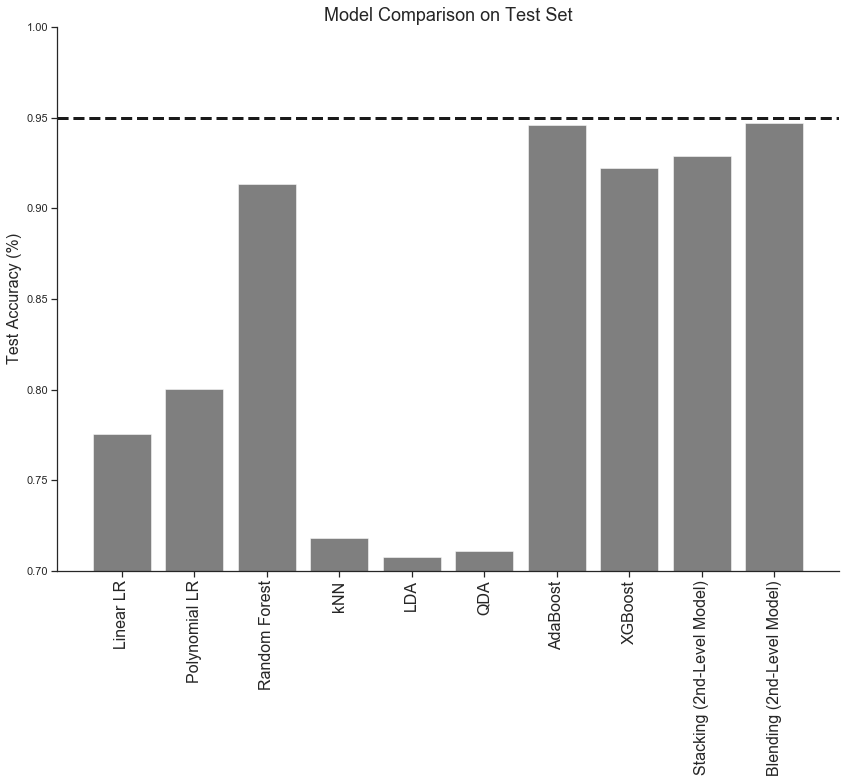

In [290]:
plt.figure(figsize=(14,10))
xx = range(len(df_var))
index_name=df_var.index
plt.bar(xx, df_var['test accuracy'], color='black', alpha=0.5)
plt.ylim(0.7,1)
plt.title('Model Comparison on Test Set', fontsize=18)
plt.ylabel('Test Accuracy (%)', fontsize=16)
plt.xticks(xx,index_name,rotation=90,fontsize = 16);
sns.despine()

plt.axhline(0.95, c='k', linewidth=3, linestyle='--');

The weighted stacked model performed the best on the test set, achieving an accuracy of 85.7%, a value more than 1% higher than that achieved by the other best models: logistic regression and random forest. With extra tuning of hyperparameters and model weightings it is likely that this could be increased further.

## Netrual network


In [79]:
from sklearn.model_selection import cross_val_score
from sklearn.utils import resample
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.ensemble import AdaBoostClassifier
from sklearn.linear_model import LogisticRegressionCV

import tensorflow.keras 
from tensorflow.keras import models
from tensorflow.keras import layers


from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense
from tensorflow.keras import regularizers

from sklearn.metrics import r2_score as r2

from sklearn.utils import shuffle
from tensorflow.keras.layers import Dropout
from tensorflow.keras.wrappers.scikit_learn import KerasClassifier

import tensorflow.contrib.eager as tfe
from sklearn.grid_search import GridSearchCV
from sklearn.datasets import make_classification
from sklearn.model_selection import cross_val_score

/Users/yiming/anaconda3/lib/python3.6/site-packages/h5py/__init__.py:36: FutureWarning:

Conversion of the second argument of issubdtype from `float` to `np.floating` is deprecated. In future, it will be treated as `np.float64 == np.dtype(float).type`.

/Users/yiming/anaconda3/lib/python3.6/site-packages/sklearn/cross_validation.py:41: DeprecationWarning:

This module was deprecated in version 0.18 in favor of the model_selection module into which all the refactored classes and functions are moved. Also note that the interface of the new CV iterators are different from that of this module. This module will be removed in 0.20.

/Users/yiming/anaconda3/lib/python3.6/site-packages/sklearn/grid_search.py:42: DeprecationWarning:

This module was deprecated in version 0.18 in favor of the model_selection module into which all the refactored classes and functions are moved. This module will be removed in 0.20.



In [80]:
model_NN = models.Sequential()

model_NN.add(layers.Dense(500, input_shape=(X_train_scaled.shape[1],),
                activation='relu'))

model_NN.add(layers.Dense(300, input_shape=(X_train_scaled.shape[1],),
                activation='relu', 
                kernel_regularizer=regularizers.l2(0.01)))
model_NN.add(Dropout(0.5))
          


model_NN.add(layers.Dense(1,  
                activation='sigmoid')) 

model_NN.summary()

_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense (Dense)                (None, 500)               6500      
_________________________________________________________________
dense_1 (Dense)              (None, 300)               150300    
_________________________________________________________________
dropout (Dropout)            (None, 300)               0         
_________________________________________________________________
dense_2 (Dense)              (None, 1)                 301       
Total params: 157,101
Trainable params: 157,101
Non-trainable params: 0
_________________________________________________________________


In [81]:
tensorflow.keras.optimizers.Adam(lr=0.01, beta_1=0.9, beta_2=0.999, epsilon=None, decay=0.0, amsgrad=False)
model_NN.compile(loss='binary_crossentropy', optimizer='Adam', metrics=['accuracy'])

In [82]:
# %%capture
ANN_history = model_NN.fit(X_train_scaled, Y_train,batch_size=128,epochs=500,validation_split=0.2)

Train on 5782 samples, validate on 1446 samples
Epoch 1/500
5782/5782 [==============================] - 1s 160us/step - loss: 2.5321 - acc: 0.5541 - val_loss: 1.2442 - val_acc: 0.6079
Epoch 2/500
5782/5782 [==============================] - 0s 66us/step - loss: 0.8989 - acc: 0.6119 - val_loss: 0.7260 - val_acc: 0.5664
Epoch 3/500
5782/5782 [==============================] - 0s 65us/step - loss: 0.6683 - acc: 0.6446 - val_loss: 0.6584 - val_acc: 0.6335
Epoch 4/500
5782/5782 [==============================] - 0s 64us/step - loss: 0.6328 - acc: 0.6740 - val_loss: 0.6290 - val_acc: 0.6604
Epoch 5/500
5782/5782 [==============================] - 0s 66us/step - loss: 0.6132 - acc: 0.6937 - val_loss: 0.6197 - val_acc: 0.6667
Epoch 6/500
5782/5782 [==============================] - 0s 67us/step - loss: 0.6047 - acc: 0.7004 - val_loss: 0.6130 - val_acc: 0.6916
Epoch 7/500
5782/5782 [==============================] - 0s 67us/step - loss: 0.5958 - acc: 0.7053 - val_loss: 0.6210 - val_acc: 0.6646

Epoch 120/500
5782/5782 [==============================] - 0s 66us/step - loss: 0.4199 - acc: 0.8334 - val_loss: 0.4371 - val_acc: 0.8154
Epoch 121/500
5782/5782 [==============================] - 0s 67us/step - loss: 0.4223 - acc: 0.8307 - val_loss: 0.4389 - val_acc: 0.8154
Epoch 122/500
5782/5782 [==============================] - 0s 63us/step - loss: 0.4275 - acc: 0.8269 - val_loss: 0.4588 - val_acc: 0.8105
Epoch 123/500
5782/5782 [==============================] - 0s 65us/step - loss: 0.4268 - acc: 0.8272 - val_loss: 0.4386 - val_acc: 0.8140
Epoch 124/500
5782/5782 [==============================] - 0s 83us/step - loss: 0.4187 - acc: 0.8343 - val_loss: 0.4386 - val_acc: 0.8154
Epoch 125/500
5782/5782 [==============================] - 0s 67us/step - loss: 0.4222 - acc: 0.8312 - val_loss: 0.4395 - val_acc: 0.8098
Epoch 126/500
5782/5782 [==============================] - 0s 69us/step - loss: 0.4211 - acc: 0.8279 - val_loss: 0.4601 - val_acc: 0.8036
Epoch 127/500
5782/5782 [=========

5782/5782 [==============================] - 0s 61us/step - loss: 0.3872 - acc: 0.8452 - val_loss: 0.4202 - val_acc: 0.8402
Epoch 239/500
5782/5782 [==============================] - 0s 64us/step - loss: 0.3832 - acc: 0.8499 - val_loss: 0.4164 - val_acc: 0.8285
Epoch 240/500
5782/5782 [==============================] - 0s 66us/step - loss: 0.3868 - acc: 0.8495 - val_loss: 0.4143 - val_acc: 0.8306
Epoch 241/500
5782/5782 [==============================] - 0s 65us/step - loss: 0.3806 - acc: 0.8535 - val_loss: 0.4408 - val_acc: 0.8292
Epoch 242/500
5782/5782 [==============================] - 0s 64us/step - loss: 0.3887 - acc: 0.8487 - val_loss: 0.4145 - val_acc: 0.8416
Epoch 243/500
5782/5782 [==============================] - 0s 66us/step - loss: 0.3864 - acc: 0.8509 - val_loss: 0.4247 - val_acc: 0.8333
Epoch 244/500
5782/5782 [==============================] - 0s 77us/step - loss: 0.3894 - acc: 0.8513 - val_loss: 0.4131 - val_acc: 0.8271
Epoch 245/500
5782/5782 [=======================

5782/5782 [==============================] - 0s 68us/step - loss: 0.3660 - acc: 0.8592 - val_loss: 0.4109 - val_acc: 0.8361
Epoch 357/500
5782/5782 [==============================] - 0s 63us/step - loss: 0.3689 - acc: 0.8533 - val_loss: 0.4007 - val_acc: 0.8472
Epoch 358/500
5782/5782 [==============================] - 0s 64us/step - loss: 0.3670 - acc: 0.8597 - val_loss: 0.4046 - val_acc: 0.8458
Epoch 359/500
5782/5782 [==============================] - 0s 67us/step - loss: 0.3682 - acc: 0.8566 - val_loss: 0.4168 - val_acc: 0.8326
Epoch 360/500
5782/5782 [==============================] - 0s 63us/step - loss: 0.3712 - acc: 0.8570 - val_loss: 0.4052 - val_acc: 0.8423
Epoch 361/500
5782/5782 [==============================] - 0s 65us/step - loss: 0.3654 - acc: 0.8565 - val_loss: 0.4014 - val_acc: 0.8472
Epoch 362/500
5782/5782 [==============================] - 0s 67us/step - loss: 0.3702 - acc: 0.8558 - val_loss: 0.4089 - val_acc: 0.8389
Epoch 363/500
5782/5782 [=======================

5782/5782 [==============================] - 0s 45us/step - loss: 0.3533 - acc: 0.8670 - val_loss: 0.4128 - val_acc: 0.8423
Epoch 475/500
5782/5782 [==============================] - 0s 48us/step - loss: 0.3556 - acc: 0.8620 - val_loss: 0.3976 - val_acc: 0.8506
Epoch 476/500
5782/5782 [==============================] - 0s 48us/step - loss: 0.3573 - acc: 0.8609 - val_loss: 0.4045 - val_acc: 0.8437
Epoch 477/500
5782/5782 [==============================] - 0s 45us/step - loss: 0.3572 - acc: 0.8615 - val_loss: 0.3926 - val_acc: 0.8555
Epoch 478/500
5782/5782 [==============================] - 0s 45us/step - loss: 0.3527 - acc: 0.8684 - val_loss: 0.3898 - val_acc: 0.8555
Epoch 479/500
5782/5782 [==============================] - 0s 44us/step - loss: 0.3480 - acc: 0.8687 - val_loss: 0.4013 - val_acc: 0.8499
Epoch 480/500
5782/5782 [==============================] - 0s 45us/step - loss: 0.3614 - acc: 0.8658 - val_loss: 0.3983 - val_acc: 0.8492
Epoch 481/500
5782/5782 [=======================

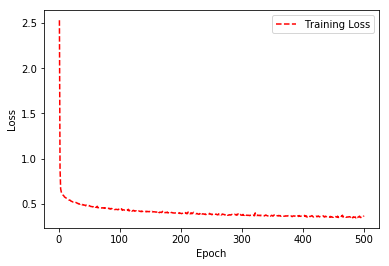

In [83]:
training_loss = ANN_history.history['loss']
epoch_count = range(1, len(training_loss) + 1)
plt.plot(epoch_count, training_loss, 'r--')
plt.legend(['Training Loss'])
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.show();

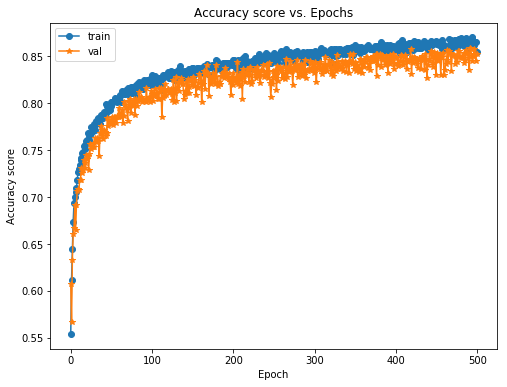

In [84]:
fig, axs = plt.subplots(figsize=(8, 6))
plt.plot(ANN_history.history['acc'], '-o', label='train')
plt.plot(ANN_history.history['val_acc'], '-*', label='val')

plt.ylabel("Accuracy score")
plt.xlabel("Epoch")
plt.title("Accuracy score vs. Epochs")

plt.legend()
plt.show() 

In [86]:
test_loss,test_acc = model_NN.evaluate(X_test_scaled, Y_test, verbose=1)
print('Test loss:', test_loss)
print('Test ACC:', test_acc)


3099/3099 [==============================] - 0s 40us/step
Test loss: 0.3875258122097488
Test ACC: 0.8531784449096033


In [99]:
y_pre_df_NN_prob = model_NN.predict(pre_df_scaled)


In [106]:
y_pre_df_NN= (y_pre_df_NN_prob>0.5).astype(np.int)


### Bots detection compile



In [110]:
index = pre_df_scaled.index

In [117]:
bot_detection_df = pd.DataFrame(np.column_stack([y_pre_df_logreg, y_pre_df_PolyL,y_pre_df_lda,y_pre_df_qda,y_pre_df_rf,y_pre_df_adaboost,y_pre_df_xgboost,y_pre_df_KNN,y_pre_df_svm, y_pre_df_NN,y_pre_df_NN_prob ]), 
                               columns=['Linear LR', 'Polynomial LR', 'LDA', 'QDA','Random Forest',  'AdaBoost', 'XGBoost', 'KNN', 'SVM','ANN','ANN_prob'],
                               index=index)

In [118]:
bot_detection_df

,Linear LR,Polynomial LR,LDA,QDA,Random Forest,AdaBoost,XGBoost,KNN,SVM,ANN,ANN_prob
User ID,,,,,,,,,,,
876476261220179968,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,2.602416e-02
909863671563739136,1.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,7.193622e-02
951973545831223296,1.0,0.0,1.0,1.0,0.0,0.0,0.0,1.0,1.0,0.0,3.267130e-02
981943174947065856,1.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,6.538849e-02
4735793156,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,3.535614e-03
698968509091614720,1.0,1.0,1.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,4.515137e-02
1040722169574187010,1.0,1.0,1.0,1.0,0.0,0.0,0.0,1.0,0.0,1.0,1.000000e+00
1019044289278443520,1.0,1.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,3.680649e-02
821278120518946816,1.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,1.710731e-01


In [119]:

bot_detection_df.to_csv('bot_detection_df.csv')

 AC209a Twitter Project - Group 15

## Advance models with NLP features

<hr style="height:2pt">

In [1]:
%%capture
# RUN THIS CELL FOR FORMAT
import requests
from IPython.core.display import HTML
styles = requests.get("https://raw.githubusercontent.com/Harvard-IACS/2018-CS109A/master/content/styles/cs109.css").text
HTML(styles)

### Important packages

1. `Tweepy` - Twitter API - http://docs.tweepy.org/en/v3.5.0/api.html#tweepy-api-twitter-api-wrapper

2. `nltk` - Natural language processing library - http://www.nltk.org/howto/twitter.html

3. `twython` - Python wrapper for the Twitter API

4. `jsonpickle` - converts Python objects into JSON

5. `scikit-learn` - Python machine learning library

https://github.com/Jefferson-Henrique/GetOldTweets-python

In [2]:
%%capture
!pip install --upgrade jsonpickle tweepy

import sys
import jsonpickle
import os
import numpy as np
import pandas as pd
import tweepy
import nltk
import pandas as pd
import json
import sklearn
import datetime
from datetime import datetime
import statsmodels.api as sm
from statsmodels.api import OLS
from sklearn import preprocessing
from sklearn.preprocessing import PolynomialFeatures
from sklearn.metrics import r2_score
from sklearn.metrics import accuracy_score
from sklearn.linear_model import LogisticRegression
from sklearn.linear_model import LogisticRegressionCV
from sklearn.pipeline import make_pipeline
from sklearn.preprocessing import PolynomialFeatures
from sklearn.model_selection import train_test_split
from pandas.plotting import scatter_matrix
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis
from sklearn.discriminant_analysis import QuadraticDiscriminantAnalysis
from sklearn.ensemble import AdaBoostClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report,confusion_matrix
from sklearn.model_selection import GridSearchCV
from sklearn.ensemble import GradientBoostingClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report,confusion_matrix
from sklearn.model_selection import GridSearchCV
from sklearn.ensemble import GradientBoostingClassifier
import xgboost as xgb
from sklearn.metrics import confusion_matrix
from sklearn.neighbors import KNeighborsClassifier
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import KFold
from sklearn.svm import SVC
from sklearn import metrics
from sklearn.neighbors import KNeighborsClassifier
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import KFold

from sklearn import svm
import seaborn as sns
import matplotlib.pyplot as plt
import matplotlib
%matplotlib inline
from pandas.io.json import json_normalize

from sklearn.ensemble import (RandomForestClassifier, AdaBoostClassifier, 
                              GradientBoostingClassifier, ExtraTreesClassifier)
from sklearn.svm import SVC
from sklearn.model_selection import cross_val_score
from sklearn.utils import resample
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.ensemble import AdaBoostClassifier
from sklearn.linear_model import LogisticRegressionCV

import tensorflow.keras 
from tensorflow.keras import models
from tensorflow.keras import layers


from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense
from tensorflow.keras import regularizers

from sklearn.metrics import r2_score as r2

from sklearn.utils import shuffle
from tensorflow.keras.layers import Dropout
from tensorflow.keras.wrappers.scikit_learn import KerasClassifier

import tensorflow.contrib.eager as tfe
from sklearn.grid_search import GridSearchCV
from sklearn.datasets import make_classification
from sklearn.model_selection import cross_val_score

import warnings
warnings.filterwarnings('ignore')
import time

## Data cleaning

In this part, we import datasets from previous section, split the dataset into training and test set and do data cleaning  by normalizing data in each columns. The feature we used here include feature we extracted from NLP.

In [212]:
user_df = pd.read_csv(r"merged_mean_imputed_legit.csv",index_col='User ID')
bot_df = pd.read_csv(r"merged_mean_imputed_bots.csv",index_col='User ID')
pre_df=pd.read_csv(r"merged_detect_df.csv",index_col='User ID')
bot_df['bot']=1
user_df['bot']=0
pre_df['bot']=2
total_df = bot_df.append(user_df)

In [213]:
total_df=total_df.drop(['bot_bool','Account age (days)','avg_num_caps', 'avg_words_per_tweet','word_diversity', 'difficult_words_score','avg_readability_combined_metric','avg_flesch_reading_ease', 'avg_readability_DC', 'full_tweet_text','avg_num_hashtags.1','percent_with_p_emoji','percent_with_n_emoji','percent_with_pn_emoji','avg_num_exclamation','avg_num_ellipses'],axis=1)

pre_df=pre_df.drop(['Account age (days)','avg_num_caps', 'avg_words_per_tweet','word_diversity', 'difficult_words_score','avg_readability_combined_metric','avg_flesch_reading_ease', 'avg_readability_DC', 'full_tweet_text','avg_num_hashtags.1','avg_num_exclamation','avg_num_ellipses'],axis=1)


In [214]:
all_df=total_df.append(pre_df)
all_df=pd.get_dummies(all_df, prefix=['overall_language'], columns=['overall_language'])
pre_df_new=all_df[all_df['bot']==2].drop(['bot'],axis=1)
user_df_new=all_df[all_df['bot']==0]
bot_df_new=all_df[all_df['bot']==1]
total_df_new = bot_df_new.append(user_df_new)

In [215]:
total_df_new.shape

(2691, 55)

In [216]:
pre_df_new.shape

(897, 54)

In [412]:
train_data, test_data = train_test_split(total_df_new, test_size = 0.3, random_state=99)
Y_train=train_data['bot']
Y_test=test_data['bot']
X_train=train_data.drop('bot',axis=1)
X_test=test_data.drop('bot',axis=1)

In [413]:
X_test=X_test.replace([np.inf, -np.inf], np.nan).dropna()
X_train=X_train.replace([np.inf, -np.inf], np.nan).dropna()
pre_df_new=pre_df_new.replace([np.inf, -np.inf], np.nan).dropna()

In [414]:
def normalize(df,df_train):
    result = df.copy()
    for feature_name in df_train.columns:
        max_value = df_train[feature_name].max()
        min_value = df_train[feature_name].min()
        result[feature_name] = (df[feature_name] - min_value) / (max_value - min_value)
    return result

In [415]:
X_train_scaled=normalize(X_train,X_train)
X_test_scaled=normalize(X_test,X_train)
pre_df_scaled=normalize(pre_df_new,X_train)
# X_train=X_train.drop(['overall_language_bg','overall_language_fa','overall_language_lv','overall_language_lv','overall_language_sw'],axis=1)
# X_test=X_test.drop(['overall_language_bg','overall_language_fa','overall_language_lv','overall_language_lv','overall_language_sw'],axis=1)

In [416]:
X_train_scaled=X_train_scaled.drop(['overall_language_bg','overall_language_fa','overall_language_lv','overall_language_lv','overall_language_sw'],axis=1)
X_test_scaled=X_test_scaled.drop(['overall_language_bg','overall_language_fa','overall_language_lv','overall_language_lv','overall_language_sw'],axis=1)
pre_df_scaled=pre_df_scaled.drop(['overall_language_bg','overall_language_fa','overall_language_lv','overall_language_lv','overall_language_sw'],axis=1)


In [417]:
pre_scaled.describe()

,Default picture (binary),Default profile (binary),Number of digits in screen name,Number of favorites,Number of followers,Number of friends,Number of tweets per hour,Number of tweets total,Number of unique profile descriptions,Screen name length,...,overall_language_ml,overall_language_nl,overall_language_no,overall_language_pt,overall_language_ro,overall_language_ru,overall_language_sv,overall_language_th,overall_language_tr,overall_language_zh-cn
count,869.000000,869.000000,869.000000,869.000000,8.690000e+02,869.000000,869.000000,869.000000,869.000000,869.000000,...,869.0,869.000000,869.000000,869.000000,869.0,869.000000,869.0,869.0,869.000000,869.0
mean,0.074799,0.642117,0.131473,0.086122,3.693315e-04,0.015087,0.211224,0.062144,0.078959,0.690183,...,0.0,0.004603,0.001151,0.005754,0.0,0.001151,0.0,0.0,0.002301,0.0
std,0.263218,0.479653,0.233956,0.133814,2.052938e-03,0.033909,0.362356,0.108262,0.134112,0.205873,...,0.0,0.067728,0.033923,0.075678,0.0,0.033923,0.0,0.0,0.047946,0.0
min,0.000000,0.000000,0.000000,0.000002,-1.489155e-07,0.000000,0.000106,0.000046,0.000000,0.153846,...,0.0,0.000000,0.000000,0.000000,0.0,0.000000,0.0,0.0,0.000000,0.0
25%,0.000000,0.000000,0.000000,0.010240,1.295565e-05,0.001481,0.023991,0.006929,0.000000,0.538462,...,0.0,0.000000,0.000000,0.000000,0.0,0.000000,0.0,0.0,0.000000,0.0
50%,0.000000,1.000000,0.000000,0.037432,4.340887e-05,0.004741,0.082180,0.025644,0.000000,0.692308,...,0.0,0.000000,0.000000,0.000000,0.0,0.000000,0.0,0.0,0.000000,0.0
75%,0.000000,1.000000,0.250000,0.102345,1.734121e-04,0.015293,0.222146,0.072072,0.076923,0.846154,...,0.0,0.000000,0.000000,0.000000,0.0,0.000000,0.0,0.0,0.000000,0.0
max,1.000000,1.000000,1.500000,1.213595,4.007606e-02,0.336010,3.348756,1.224379,0.923077,1.000000,...,0.0,1.000000,1.000000,1.000000,0.0,1.000000,0.0,0.0,1.000000,0.0


# Models  with  NLP Features

Similar to the that in the model development,we also use Logistic Regression, LDA/QDA, Random Forest,Boosting, and Support Vector Machines models. 

Two major improvements from what we did in the model development section are:

* Include features from NLP into these models;

* Include Feed Forward Artificial Neural Network; Stacking (Meta Ensembling) and Blended Ensemble Methods in the model.

## Logistic Regression

In [418]:
start_time = time.time()
logreg = LogisticRegression(C=100000,fit_intercept=True).fit(X_train_scaled,Y_train)
time_logistic=time.time() - start_time
logreg_train = logreg.score(X_train_scaled, Y_train)
logreg_test = logreg.score(X_test_scaled, Y_test)
print('Accuracy of logistic regression model on the test set is {:.3f}'.format(logreg_test))

Accuracy of logistic regression model on the test set is 0.972


In [419]:
# Logistic regression w/ quadratic + interaction terms + regularization
start_time = time.time()
polynomial_logreg_estimator = make_pipeline(
    PolynomialFeatures(degree=2, include_bias=True),
    LogisticRegressionCV(multi_class="ovr", penalty='l2', cv=5, max_iter=10000))
linearLogCVpoly = polynomial_logreg_estimator.fit(X_train_scaled, Y_train)
time_linearLogCVpoly=time.time() - start_time

# Compare results
print('Polynomial-logistic accuracy:test={:.1%}'.format( linearLogCVpoly.score(X_test_scaled, Y_test)))

linearLogCVpoly_train = linearLogCVpoly.score(X_train_scaled, Y_train)
linearLogCVpoly_test = linearLogCVpoly.score(X_test_scaled, Y_test)

Polynomial-logistic accuracy:test=96.9%


In [420]:
y_pred_logreg= logreg.predict(X_test_scaled)
y_pred_logreg_proba=logreg.predict_proba(X_test_scaled)[:,1]
y_pred_linearLogCVpoly= linearLogCVpoly.predict(X_test_scaled)
y_pred_linearLogCVpoly_proba=linearLogCVpoly.predict_proba(X_test_scaled)[:,1]


y_pre_df_logreg= logreg.predict(pre_df_scaled)
y_pre_df_logreg_proba=logreg.predict_proba(pre_df_scaled)[:,1]
y_pre_df_linearLogCVpoly= linearLogCVpoly.predict(pre_df_scaled)
y_pre_df_linearLogCVpoly_proba=linearLogCVpoly.predict_proba(pre_df_scaled)[:,1]

In [421]:
y_pre_df_linearLogCVpoly.nonzero()

(array([  2,   3,   5,   6,   7,   8,   9,  10,  11,  12,  15,  32,  36,
         40,  45,  49,  58,  59,  63,  65,  66,  69,  70,  71,  72,  73,
         80,  93,  94,  99, 100, 101, 102, 103, 106, 108, 109, 112, 113,
        115, 116, 129, 133, 139, 140, 142, 147, 148, 155, 160, 161, 168,
        172, 173, 183, 187, 193, 201, 202, 212, 218, 223, 225, 227, 231,
        242, 243, 250, 259, 274, 277, 278, 281, 285, 287, 288, 290, 292,
        293, 295, 307, 313, 317, 321, 322, 323, 324, 332, 335, 336, 338,
        340, 341, 344, 346, 351, 363, 369, 381, 392, 393, 394, 396, 398,
        399, 401, 404, 410, 415, 418, 423, 427, 431, 437, 440, 442, 449,
        450, 457, 464, 465, 468, 471, 478, 487, 488, 491, 506, 507, 509,
        510, 511, 513, 515, 517, 533, 537, 542, 547, 548, 561, 565, 569,
        576, 577, 579, 580, 586, 590, 591, 593, 594, 595, 601, 609, 613,
        627, 632, 633, 650, 653, 654, 655, 659, 668, 670, 674, 675, 679,
        688, 696, 701, 703, 704, 710, 712, 715, 722

## LDA and QDA Model

In [423]:
start_time = time.time()
lda = LinearDiscriminantAnalysis(store_covariance=True)
lda.fit(X_train_scaled, Y_train)
time_lda=time.time() - start_time
print("---lda %s seconds ---" % (time_lda))

start_time = time.time()
qda = QuadraticDiscriminantAnalysis(store_covariance=True)
qda.fit(X_train_scaled, Y_train)
time_qda=time.time() - start_time
print("--- qda %s seconds ---" % (time_qda))

y_pre_df_lda=lda.predict(pre_df_scaled)
y_pre_df_lda_proba=lda.predict_proba(pre_df_scaled)[:,1]

y_pred_qda=qda.predict(X_test_scaled)
lda_train = lda.score(X_train_scaled, Y_train)
lda_test = lda.score(X_test_scaled, Y_test)
qda_train = qda.score(X_train_scaled, Y_train)
y_pred_qda_proba=qda.predict_proba(X_test_scaled)[:,1]

qda_test = qda.score(X_test_scaled, Y_test)

print('LDA accuracy train={:.1%}, test: {:.1%}'.format(
    lda.score(X_train_scaled, Y_train), lda.score(X_test_scaled, Y_test)))

print('QDA accuracy train={:.1%}, test: {:.1%}'.format(
    qda.score(X_train_scaled, Y_train), qda.score(X_test_scaled, Y_test)))

---lda 0.014118194580078125 seconds ---
--- qda 0.00852203369140625 seconds ---
LDA accuracy train=94.5%, test: 93.2%
QDA accuracy train=73.0%, test: 72.8%


## Random forest

In [229]:
start_time = time.time()
ntrees = 50
rf = RandomForestClassifier(n_estimators=ntrees , max_depth=15, max_features='auto')
rf.fit(X_train_scaled, Y_train)

time_rf=time.time() - start_time
print("--- %s seconds ---" % (time_rf))

rf_train =rf.score(X_train_scaled, Y_train)
rf_test =rf.score(X_test_scaled, Y_test)
rf_y_test_proba =rf.predict_proba(X_test_scaled)[:,1]
rf_y_test =rf.predict(X_test_scaled)
print('RF accuracy train={:.1%}, test: {:.1%}'.format(rf_train,rf_test))
y_pre_df_rf = rf.predict(pre_df_scaled)

--- 0.24376201629638672 seconds ---
RF accuracy train=100.0%, test: 98.1%


In [297]:
y_pre_df_rf_proba =rf.predict_proba(pre_df_scaled)[:,1]


## Adaboost

In [233]:
start_time = time.time()

adaboost = AdaBoostClassifier(base_estimator=DecisionTreeClassifier(max_depth=8), n_estimators=800, learning_rate=0.01)
adaboost.fit(X_train_scaled, Y_train);
time_adaboost=time.time() - start_time
print("--- %s seconds ---" % (time_adaboost))

--- 19.226351022720337 seconds ---


In [234]:
y_pred_test = adaboost.predict(X_test_scaled)
pred_adaboost = [round(value) for value in y_pred_test]
test_adaboost = accuracy_score(Y_test, pred_adaboost)
print('test acc:',test_adaboost )
y_train_adaboost = adaboost.predict(X_train_scaled)
train_adaboost = accuracy_score(Y_train,y_train_adaboost)
y_test_adaboost = adaboost.predict(X_test_scaled)
y_test_adaboost_proba = adaboost.predict_proba(X_test_scaled)[:,1]


test acc: 0.9702970297029703


In [304]:
y_pre_df_adaboost = adaboost.predict(pre_df_scaled)
y_pre_df_adaboost.nonzero()
y_pre_df_adaboost_proba=rf.predict_proba(pre_df_scaled)[:,1]


## XGBoost

In [473]:

import xgboost as xgb
from sklearn.metrics import confusion_matrix



start_time = time.time()
xgb = xgb.XGBClassifier(max_depth=5, n_estimators=300, learning_rate=0.01).fit(X_train_scaled, Y_train)
time_xgb=time.time() - start_time
print("--- %s seconds ---" % (time_xgb))

y_pred_train_xgb = xgb.predict(X_train_scaled)
y_pred_test_xgb = xgb.predict(X_test_scaled)
y_pred_test_xgb_proba = xgb.predict_proba(X_test_scaled)[:,1]

# test_xgb = accuracy_score(Y_test, y_pred_test_xgb)
# train_xgb = accuracy_score(Y_test, y_pred_test_xgb)

# print("test Accuracy: %.2f%%" % (accuracy_xgb * 100.0))

y_pre_df_xgboost = xgb.predict(pre_df_scaled)


--- 2.580984115600586 seconds ---


In [477]:

y_pre_df_xgboost_proba= xgb.predict_proba(pre_df_scaled)[:,1]


In [478]:
y_pre_df_xgboost_proba.shape

(869,)

## K-NN

In [258]:
start_time = time.time()

scores_mean=[]
scores_std=[]
k_number=np.arange(1,40)
for k in range(1,40):
    knn = KNeighborsClassifier(n_neighbors = k)
    score_mean= cross_val_score(knn,X_train_scaled,Y_train,cv=5).mean()
    score_std=cross_val_score(knn,X_train_scaled,Y_train,cv=5).std()
    scores_mean.append(score_mean)
max_score_k=max(scores_mean)
best_k=scores_mean.index(max(scores_mean))+1
print('Best K=',best_k, 'with a max CV score of',max_score_k)

knn_best_k = KNeighborsClassifier(n_neighbors = best_k)
knn_best_k.fit(X_train_scaled,Y_train);

time_knn_best_k=time.time() - start_time
print("--- %s seconds ---" % (time_knn_best_k))

y_test_pred_best_k = knn_best_k.predict(X_test_scaled)
y_train_pred_best_k = knn_best_k.predict(X_train_scaled)
y_test_pred_best_k_proba = knn_best_k.predict_proba(X_test_scaled)[:,1]

train_knn_best_k= knn_best_k.score(X_train_scaled, Y_train)
test_knn_best_k= knn_best_k.score(X_test_scaled, Y_test)

print('train accuracy',accuracy_score(Y_train, y_train_pred_best_k))
print('test accuracy',accuracy_score(Y_test, y_test_pred_best_k))

Best K= 4 with a max CV score of 0.9522094926350245
--- 21.24043893814087 seconds ---
train accuracy 0.9681359532660648
test accuracy 0.9492574257425742


In [382]:
y_pred_df_best_k = knn_best_k.predict(pre_df_scaled)
y_pre_df_adaboost.nonzero()
y_pred_df_best_k_proba = knn_best_k.predict_proba(pre_df_scaled)[:,1]


In [383]:
y_pred_df_best_k_proba

array([0.  , 0.  , 0.25, 0.  , 0.  , 0.  , 0.  , 0.  , 0.  , 0.  , 1.  ,
       0.  , 0.  , 0.  , 0.5 , 0.  , 0.25, 0.  , 0.  , 0.  , 0.  , 0.  ,
       0.  , 0.25, 0.  , 0.25, 0.  , 0.  , 0.  , 0.  , 0.  , 0.  , 0.  ,
       0.  , 0.  , 0.  , 0.  , 0.  , 0.  , 0.  , 0.  , 0.  , 0.  , 0.  ,
       0.  , 0.  , 0.5 , 0.  , 0.75, 0.  , 0.  , 0.  , 0.  , 0.  , 0.  ,
       0.  , 0.  , 0.  , 0.  , 0.25, 0.  , 0.  , 0.  , 0.25, 0.  , 0.  ,
       0.75, 0.  , 0.  , 0.5 , 0.5 , 0.  , 0.5 , 0.  , 0.  , 0.  , 0.25,
       0.  , 0.  , 0.  , 0.  , 0.  , 0.  , 0.  , 0.  , 0.  , 0.  , 0.  ,
       0.  , 0.  , 0.  , 0.  , 0.  , 0.  , 1.  , 0.  , 0.5 , 0.5 , 0.25,
       0.5 , 0.  , 0.25, 0.5 , 1.  , 0.  , 0.  , 0.  , 0.  , 0.  , 0.  ,
       0.  , 0.25, 0.  , 0.  , 0.25, 0.  , 0.  , 0.  , 0.  , 0.75, 0.  ,
       0.  , 0.  , 0.  , 0.  , 0.75, 0.  , 0.  , 0.  , 0.  , 0.  , 0.25,
       0.  , 0.  , 0.25, 0.  , 0.  , 0.  , 0.  , 0.  , 0.  , 0.  , 0.5 ,
       0.  , 0.  , 0.  , 0.  , 0.  , 0.  , 0.  , 0.

## Support Vector Machines

In [427]:
def fit_and_plot_svm_for_c(x_train, y_train, x_test, y_test,pre_df, C):
    # Fit SVM model
    model = svm.SVC(C=C, kernel='linear',probability=True)
    model.fit(x_train, y_train)
    
    # Train and test error

    tr_acc = model.score(x_train, y_train)
    ts_acc = model.score(x_test, y_test)
    y_pre_svm = model.predict(pre_df)
    y_pre_svm_proba = model.predict_proba(pre_df)[:,1]

    return tr_acc, ts_acc,y_pre_svm,y_pre_svm_proba

In [428]:
# Fit and plot for different 'C' values
start_time = time.time()
tr_acc, ts_acc,y_pre_df_svm,y_pre_dfsvm_proba = fit_and_plot_svm_for_c(X_train_scaled, Y_train,X_test_scaled, Y_test, pre_df_scaled, 0.1)
time_svm=time.time() - start_time
print("--- %s seconds ---" % (time_svm))

--- 0.5375940799713135 seconds ---


In [430]:
y_pre_df_svm

(array([ 94,  99, 103, 125, 151, 155, 205, 219, 270, 282, 284, 333, 336,
        357, 385, 416, 453, 454, 471, 500, 521, 671, 682, 698, 722, 733,
        738, 743, 744, 798, 839, 846]),)

In [429]:
print('train accuracy',tr_acc)
print('test accuracy',ts_acc)

train accuracy 0.9251194901752523
test accuracy 0.9133663366336634


## Artificial Neural network (ANN)


In this section, we development Artificial neural network based on TensorFlow.
Neural Networks consist of the following components:
* An input layer, x
* An arbitrary amount of hidden layers
* An output layer, ŷ
* A set of weights and biases between each layer, W and b
* A choice of activation function for each hidden layer, σ.


Here we built a three-layers ANN based on GridsearchCV results :
1. Nodes per Layer: 500,300,2 
2. Activation function: reLU
3. Loss function: binary_crossentropy
4. Output unit: Sigmoid 
5. Optimizer: Adam
6. Epochs: 500
7. Batch size: 128
8. Validation size: .2


In [366]:
start_time=time.time()
model_NN = models.Sequential()

model_NN.add(layers.Dense(500, input_shape=(X_train_scaled.shape[1],),
                activation='relu'))

model_NN.add(layers.Dense(300, input_shape=(X_train_scaled.shape[1],),
                activation='relu', 
                kernel_regularizer=regularizers.l2(0.01)))
model_NN.add(Dropout(0.5))

model_NN.add(layers.Dense(1,  
                activation='sigmoid')) 

print(model_NN.summary())
tensorflow.keras.optimizers.Adam(lr=0.01, beta_1=0.9, beta_2=0.999, epsilon=None, decay=0.0, amsgrad=False)
model_NN.compile(loss='binary_crossentropy', optimizer='Adam', metrics=['accuracy'])

_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_3 (Dense)              (None, 500)               25500     
_________________________________________________________________
dense_4 (Dense)              (None, 300)               150300    
_________________________________________________________________
dropout_1 (Dropout)          (None, 300)               0         
_________________________________________________________________
dense_5 (Dense)              (None, 1)                 301       
Total params: 176,101
Trainable params: 176,101
Non-trainable params: 0
_________________________________________________________________
None


In [367]:
%%capture
start_time=time.time()
ANN_history = model_NN.fit(X_train_scaled, Y_train,batch_size=128,epochs=500,validation_split=0.2)
time_ANN=time.time() - start_time

808/808 [==============================] - 0s 42us/step
Test loss: 0.13090957977836676
Test ACC: 0.9789603960396039


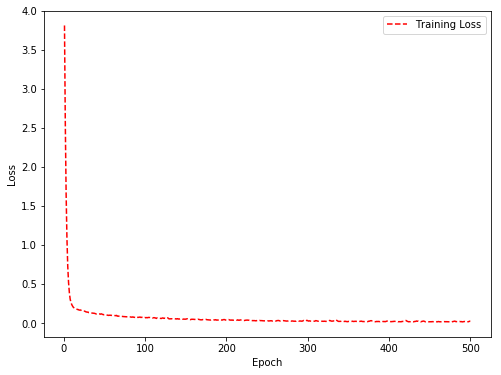

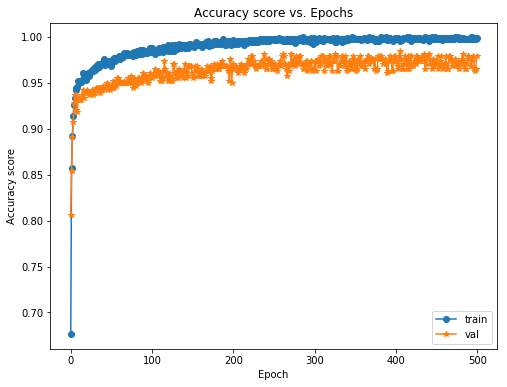

In [480]:
train_loss,train_acc = model_NN.evaluate(X_train_scaled, Y_train, verbose=1)
test_loss,test_acc = model_NN.evaluate(X_test_scaled, Y_test, verbose=1)
print('Test loss:', test_loss)
print('Test ACC:', test_acc)
y_pre_test_NN_proba = model_NN.predict(X_test_scaled)
y_pre_test_NN= np.array((y_pre_test_NN_proba>0.5).astype(np.int))[:,0]
training_loss = ANN_history.history['loss']
epoch_count = range(1, len(training_loss) + 1)
fig, axs = plt.subplots(figsize=(8, 6))

plt.plot(epoch_count, training_loss, 'r--')
plt.legend(['Training Loss'])
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.show();
fig, axs = plt.subplots(figsize=(8, 6))
plt.plot(ANN_history.history['acc'], '-o', label='train')
plt.plot(ANN_history.history['val_acc'], '-*', label='val')

plt.ylabel("Accuracy score")
plt.xlabel("Epoch")
plt.title("Accuracy score vs. Epochs")

plt.legend()
plt.show() 

In [371]:
y_pre_df_NN_proba = model_NN.predict(pre_df_scaled)
y_pre_df_NN= np.array((y_pre_df_NN_proba>0.5).astype(np.int))[:,0]

In [372]:
sum(y_pre_df_NN==1)/len(y_pre_df_NN)

0.13578826237054084

In [373]:
y_pre_df_NN.nonzero()

(array([  2,   3,   6,   7,   9,  10,  12,  15,  24,  36,  40,  49,  63,
         71,  73,  93,  94,  99, 100, 102, 103, 106, 109, 115, 116, 133,
        134, 135, 142, 155, 157, 172, 183, 193, 198, 212, 213, 218, 223,
        225, 227, 258, 270, 274, 277, 281, 285, 288, 293, 295, 314, 322,
        332, 336, 345, 346, 351, 393, 398, 399, 415, 427, 431, 450, 465,
        478, 506, 509, 510, 524, 533, 537, 547, 548, 565, 579, 580, 586,
        593, 595, 613, 624, 627, 632, 633, 650, 653, 654, 655, 664, 668,
        674, 675, 679, 694, 703, 704, 722, 730, 737, 738, 744, 749, 751,
        766, 767, 768, 805, 809, 813, 815, 835, 840, 844, 845, 852, 856,
        863]),)

## Stacked Model

Model stacking is an efficient ensemble method in which the predictions, generated by using various machine learning algorithms, are used as inputs in a second-layer learning algorithm. This second-layer algorithm is trained to optimally combine the model predictions to form a new set of predictions. For example, when linear regression is used as second-layer modeling, it estimates these weights by minimizing the least square errors. However, the second-layer modeling is not restricted to only linear models; the relationship between the predictors can be more complex, opening the door to employing other machine learning algorithms.

![title](modelstacking.png)

Ensemble modeling and model stacking are especially popular in data science competitions, in which a sponsor posts a training set (which includes labels) and a test set (which does not include labels) and issues a global challenge to produce the best predictions of the test set for a specified performance criterion. The winning teams almost always use ensemble models instead of a single fine-tuned model. Often individual teams develop their own ensemble models in the early stages of the competition, and then join their forces in the later stages. 

Another popular data science competition is the KDD Cup. The following figure shows the winning solution for the 2015 competition, which used a three-stage stacked modeling approach. A similar approach will be trialed for this project to try and obtain maximal predictive capability.

![title](stackedapproach.png)

The figure shows that a diverse set of 64 single models were used to build the model library. These models are trained by using various machine learning algorithms. For example, the green boxes represent gradient boosting models (GBM), pink boxes represent neural network models (NN), and orange boxes represent factorization machines models (FM). You can see that there are multiple gradient boosting models in the model library; they probably vary in their use of different hyperparameter settings and/or feature sets.

A simple way to enhance diversity is to train models by using different machine learning algorithms. For example, adding a factorization model to a set of tree-based models (such as random forest and gradient boosting) provides a nice diversity because a factorization model is trained very differently than decision tree models are trained. For the same machine learning algorithm, you can enhance diversity by using different hyperparameter settings and subsets of variables. If you have many features, one efficient method is to choose subsets of the variables by simple random sampling.

Overfitting is an especially big problem in model stacking, because so many predictors that all predict the same target are combined. Overfitting is partially caused by this collinearity between the predictors. The most efficient techniques for training models (especially during the stacking stages) include using cross validation and some form of regularization. A good paper that outlines this procedure is [Stacked Ensemble Models for Improved Prediction Accuracy](https://support.sas.com/resources/papers/proceedings17/SAS0437-2017.pdf).

That paper also shows how you can generate a diverse set of models by various methods (such as forests, gradient boosted decision trees, factorization machines, and logistic regression) and then combine them with stacked ensemble techniques such regularized regression methods, gradient boosting, and hill climbing methods.

![title](levels.png)

Applying stacked models to real-world big data problems can produce greater prediction accuracy and robustness than do individual models. The model stacking approach is powerful and compelling enough to alter your initial data mining mindset from finding the single best model to finding a collection of really good complementary models. Of course, this method does involve additional cost both because you need to train a large number of models and because you need to use cross validation to avoid overfitting.

## Stacked Model

In this section we will try to implement a stacked model similar to that proposed in the "[Stacked Ensemble Models for Improved Prediction Accuracy](https://support.sas.com/resources/papers/proceedings17/SAS0437-2017.pdf)" paper.

In [384]:
# Going to use these 5 base models for the stacking
from sklearn.ensemble import (RandomForestClassifier, AdaBoostClassifier, 
                              GradientBoostingClassifier, ExtraTreesClassifier)
from sklearn.svm import SVC

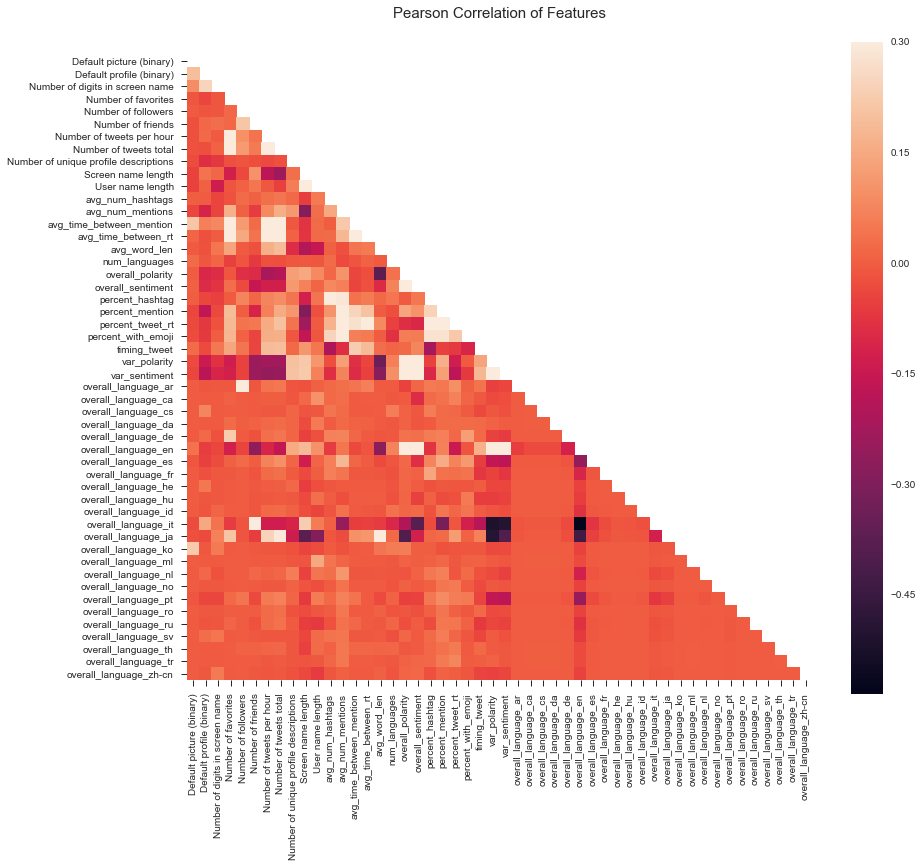

In [385]:
colormap = plt.cm.RdBu
plt.figure(figsize=(14,12))
plt.title('Pearson Correlation of Features', y=1.05, size=15)
# Generate a mask for the upper triangle
corr = X_train_scaled.astype(float).corr()
mask = np.zeros_like(corr, dtype=np.bool)
mask[np.triu_indices_from(mask)] = True
#mask = np.zeros_like(X_train_scaled)
#mask[np.triu_indices_from(mask)] = True
with sns.axes_style("white"):
    ax = sns.heatmap(corr, mask=mask, vmax=.3, square=True)
#sns.heatmap(X_train_scaled.astype(float).corr(),linewidths=0.1,vmax=1.0,
#            square=True, cmap=colormap, linecolor='white', annot=True)

## Helpers via Python Classes

In the section of code below, we essentially write a class SklearnHelper that allows one to extend the inbuilt methods (such as train, predict and fit) common to all the Sklearn classifiers. Therefore this cuts out redundancy as won't need to write the same methods five times if we wanted to invoke five different classifiers.

In [386]:
# Some useful parameters which will come in handy later on
ntrain = X_train_scaled.shape[0]
ntest = pre_df_scaled.shape[0]

# ntest = X_test_scaled.shape[0]
SEED = 99 # for reproducibility
NFOLDS = 5 # set folds for out-of-fold prediction

kf = KFold(n_splits = NFOLDS, random_state=SEED)

# Class to extend the Sklearn classifier
class SklearnHelper(object):
    def __init__(self, clf, seed=0, params=None):
        params['random_state'] = seed
        self.clf = clf(**params)

    def train(self, x_train, y_train):
        self.clf.fit(x_train, y_train)

    def predict(self, x):
        return self.clf.predict(x)
    
    def fit(self,x,y):
        return self.clf.fit(x,y)
    
    def feature_importances(self,x,y):
            print(self.clf.fit(x,y).feature_importances_)

**def init :** Python standard for invoking the default constructor for the class. This means that when you want to create an object (classifier), you have to give it the parameters of clf (what sklearn classifier you want), seed (random seed) and params (parameters for the classifiers).

The rest of the code are simply methods of the class which simply call the corresponding methods already existing within the sklearn classifiers. Essentially, we have created a wrapper class to extend the various Sklearn classifiers so that this should help us reduce having to write the same code over and over when we implement multiple learners to our stacker.

### Out-of-Fold Predictions

Stacking uses predictions of base classifiers as input for training to a second-level model. However one cannot simply train the base models on the full training data, generate predictions on the full test set and then output these for the second-level training. This runs the risk of your base model predictions already having "seen" the test set and therefore overfitting when feeding these predictions.

In [387]:
def get_oof(clf, x_train, y_train, x_test):
    oof_train = np.zeros((ntrain,))
    oof_test = np.zeros((ntest,))
    oof_test_skf = np.empty((NFOLDS, ntest))

    for i, (train_index, test_index) in enumerate(kf.split(x_train)):

        x_tr = x_train.iloc[train_index]
        y_tr = y_train.iloc[train_index]
        x_te = x_train.iloc[test_index]
        clf.train(x_tr, y_tr)

        oof_train[test_index] = clf.predict(x_te)
        oof_test_skf[i, :] = clf.predict(x_test)

    oof_test[:] = oof_test_skf.mean(axis=0)
    return oof_train.reshape(-1, 1), oof_test.reshape(-1, 1)

### Generating our Base First-Level Models

So now let us prepare five learning models as our first level classification. These models can all be conveniently invoked via the Sklearn library and are listed as follows:

- **Random Forest classifier**
- **Extra Trees classifier**
- **AdaBoost classifer**
- **Gradient Boosting classifer**
- **Support Vector Machine**

**Parameters**

**n_jobs :** Number of cores used for the training process. If set to -1, all cores are used.

**n_estimators :** Number of classification trees in your learning model ( set to 10 per default)

**max_depth :** Maximum depth of tree, or how much a node should be expanded. Beware if set to too high a number would run the risk of overfitting as one would be growing the tree too deep

**verbose :** Controls whether you want to output any text during the learning process. A value of 0 suppresses all text while a value of 3 outputs the tree learning process at every iteration.

In [388]:
# Create 5 objects that represent our 4 models
# Put in our parameters for said classifiers
# Random Forest parameters

rf_params = {
    'n_jobs': -1,
    'n_estimators': 50,
     'warm_start': True, 
     #'max_features': 0.2,
    'max_depth': 15,
    'min_samples_leaf': 2,
    'max_features' : 'sqrt',
    'verbose': 0
}


# Extra Trees Parameters
et_params = {
    'n_jobs': -1,
    'n_estimators':500,
    #'max_features': 0.5,
    'max_depth': 4,
    'min_samples_leaf': 2,
    'verbose': 0
}

# AdaBoost parameters
ada_params = {
    'base_estimator': DecisionTreeClassifier(max_depth=5),
    'n_estimators': 800,
    'learning_rate' : 0.01
}

# Gradient Boosting parameters
gb_params = {
    'n_estimators': 500,
     #'max_features': 0.2,
    'max_depth': 5,
    'min_samples_leaf': 2,
    'verbose': 0
}

# Support Vector Classifier parameters 
svc_params = {
    'kernel' : 'sigmoid',
    'C' : 0.1
    }

logreg_params = {'C':100000, 'fit_intercept': True}
lda_params = {'store_covariance': True}
qda_params = {'store_covariance': True}
polylogreg_params = {}

Let us now create 5 objects that represent our 5 learning models via our Helper Sklearn Class we defined earlier.

In [389]:
# Create 5 objects that represent our 4 models
rf = SklearnHelper(clf=RandomForestClassifier, seed=SEED, params=rf_params)
et = SklearnHelper(clf=ExtraTreesClassifier, seed=SEED, params=et_params)
ada = SklearnHelper(clf=AdaBoostClassifier, seed=SEED, params=ada_params)
gb = SklearnHelper(clf=GradientBoostingClassifier, seed=SEED, params=gb_params)
svc = SklearnHelper(clf=SVC, seed=SEED, params=svc_params)
logreg_stack = SklearnHelper(clf=LogisticRegression, seed=SEED, params=logreg_params)
#lda_stack = SklearnHelper(clf=LinearDiscriminantAnalysis, params=lda_params)
#qda_stack = SklearnHelper(clf=QuadraticDiscriminantAnalysis, params=qda_params)
#polylogreg_stack = SklearnHelper(clf=polynomial_logreg_estimator, seed=SEED, params=polylogreg_params)


### Output of the First level Predictions

We now feed the training and test data into our 5 base classifiers and use the Out-of-Fold prediction function we defined earlier to generate our first level predictions. Allow a handful of minutes for the chunk of code below to run.

In [390]:
# Create our OOF train and test predictions. These base results will be used as new features
start_time = time.time()
et_oof_train, et_oof_test = get_oof(et, X_train_scaled, Y_train, pre_df_scaled) # Extra Trees
rf_oof_train, rf_oof_test = get_oof(rf,X_train_scaled, Y_train, pre_df_scaled) # Random Forest
ada_oof_train, ada_oof_test = get_oof(ada, X_train_scaled, Y_train, pre_df_scaled) # AdaBoost 
gb_oof_train, gb_oof_test = get_oof(gb,X_train_scaled, Y_train, pre_df_scaled) # Gradient Boost
svc_oof_train, svc_oof_test = get_oof(svc,X_train_scaled, Y_train, pre_df_scaled) # Support Vector Classifier
logreg_oof_train, logreg_oof_test = get_oof(logreg_stack,X_train_scaled, Y_train, pre_df_scaled) # Linear Logistic 
print("Training is complete")

Training is complete


### Feature importances generated from the different classifiers

Now having learned our the first-level classifiers, we can utilise a very nifty feature of the Sklearn models and that is to output the importances of the various features in the training and test sets with one very simple line of code.

As per the Sklearn documentation, most of the classifiers are built in with an attribute which returns feature importances by simply typing in .featureimportances. Therefore we will invoke this very useful attribute via our function earliand plot the feature importances as such

In [391]:
rf_feature = rf.feature_importances(X_train_scaled,Y_train);
et_feature = et.feature_importances(X_train_scaled, Y_train);
ada_feature = ada.feature_importances(X_train_scaled, Y_train);
gb_feature = gb.feature_importances(X_train_scaled,Y_train);

[2.99820848e-04 3.33703572e-03 7.97657248e-04 1.00614340e-01
 5.57319543e-02 3.00992072e-02 3.22908231e-02 9.06813254e-02
 8.36800572e-04 5.22490858e-02 7.61219715e-03 1.48934407e-02
 7.39058560e-02 3.19441773e-02 4.97628298e-02 7.86673186e-03
 2.44522814e-03 7.82286277e-03 7.42717518e-03 4.06614359e-02
 8.00965525e-02 5.07671247e-02 1.72730865e-01 1.37202264e-02
 1.35886490e-02 1.88678795e-02 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 4.83064927e-03
 2.11202888e-04 0.00000000e+00 0.00000000e+00 0.00000000e+00
 2.58607950e-05 2.36440310e-02 8.00544328e-03 2.35406125e-04
 0.00000000e+00 3.15386960e-07 0.00000000e+00 1.56196426e-03
 0.00000000e+00 4.33845320e-04 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00]
[5.42720478e-04 2.93301142e-03 1.04649178e-03 8.54776265e-03
 4.09555298e-04 4.81620767e-03 1.14880388e-02 3.62053961e-02
 7.69745927e-04 1.11209482e-01 1.52488141e-02 1.21193454e-02
 5.90972618e-02 7.98471692e-03 6.47859452e-03 8.42019

In [392]:
rf_feature =[2.99820848e-04, 3.33703572e-03, 7.97657248e-04, 1.00614340e-01,
 5.57319543e-02, 3.00992072e-02, 3.22908231e-02, 9.06813254e-02,
 8.36800572e-04, 5.22490858e-02, 7.61219715e-03, 1.48934407e-02,
 7.39058560e-02, 3.19441773e-02, 4.97628298e-02, 7.86673186e-03,
 2.44522814e-03, 7.82286277e-03, 7.42717518e-03, 4.06614359e-02,
 8.00965525e-02, 5.07671247e-02, 1.72730865e-01, 1.37202264e-02,
 1.35886490e-02, 1.88678795e-02 ,0.00000000e+00, 0.00000000e+00,
 0.00000000e+00 ,0.00000000e+00 ,0.00000000e+00, 4.83064927e-03,
 2.11202888e-04 ,0.00000000e+00 ,0.00000000e+00 ,0.00000000e+00,
 2.58607950e-05 ,2.36440310e-02 ,8.00544328e-03 ,2.35406125e-04,
 0.00000000e+00 ,3.15386960e-07 ,0.00000000e+00 ,1.56196426e-03,
 0.00000000e+00 ,4.33845320e-04 ,0.00000000e+00 ,0.00000000e+00,
 0.00000000e+00 ,0.00000000e+00]
et_feature=[5.42720478e-04, 2.93301142e-03, 1.04649178e-03, 8.54776265e-03,
 4.09555298e-04, 4.81620767e-03, 1.14880388e-02, 3.62053961e-02,
 7.69745927e-04, 1.11209482e-01, 1.52488141e-02, 1.21193454e-02,
 5.90972618e-02, 7.98471692e-03, 6.47859452e-03, 8.42019973e-03,
 9.90361334e-04, 8.26846377e-03, 2.28491329e-03 ,4.09031193e-02,
 1.46742963e-01, 7.00247289e-02, 2.86880722e-02, 3.55452105e-02,
 3.58302642e-02, 3.86362752e-02 ,3.81197634e-05, 0.00000000e+00,
 0.00000000e+00, 0.00000000e+00, 2.42432970e-03, 3.81216421e-02,
 2.21701811e-02, 1.42151356e-03, 0.00000000e+00, 1.20726166e-04,
 1.41002225e-04, 1.08759082e-01, 9.81538398e-02, 2.82048446e-05,
 0.00000000e+00, 2.21879689e-03, 2.65817978e-06, 3.07676681e-02,
 0.00000000e+00, 2.83195654e-04, 1.03270896e-04, 0.00000000e+00,
 0.00000000e+00, 1.40521922e-05]
ada_feature =[0.00000000e+00, 1.82441136e-04, 4.21116110e-06, 8.02186693e-03,
 1.43489691e-03, 6.82330498e-04, 1.86085436e-04, 7.06798237e-03,
 2.92700539e-06 ,1.19652815e-03, 1.75875738e-03, 2.71471588e-04,
 7.30595364e-03, 1.83129538e-03, 2.76280081e-03, 1.24637827e-03,
 1.04500033e-03, 1.17669965e-04, 3.40438268e-04, 1.38777674e-03,
 1.93930323e-04, 4.54439469e-04, 9.53781628e-01, 2.06564874e-04,
 4.29734559e-04, 6.47063380e-05, 0.00000000e+00, 0.00000000e+00,
 0.00000000e+00, 0.00000000e+00, 0.00000000e+00, 5.32095116e-06,
 6.81629932e-04, 2.02066693e-14, 0.00000000e+00, 0.00000000e+00,
 0.00000000e+00, 5.31894362e-03, 1.15424746e-03, 0.00000000e+00,
 0.00000000e+00, 0.00000000e+00, 0.00000000e+00, 8.62042724e-04,
 0.00000000e+00, 0.00000000e+00, 0.00000000e+00, 0.00000000e+00,
 0.00000000e+00, 0.00000000e+00]
gb_feature=[2.97550337e-03, 3.28845496e-03, 8.09909425e-03, 3.45364760e-03,
 2.00341549e-02, 6.25318970e-03, 2.07000063e-03, 1.64251440e-02,
 2.11850552e-02, 1.50817409e-02 ,3.87118724e-03 ,2.99569785e-02,
 2.01647846e-02, 6.94558009e-03, 5.91027349e-03, 4.88041458e-07,
 9.34731544e-04 ,2.69655660e-04 ,2.50558411e-04, 1.69719678e-03,
 1.22603649e-02 ,1.24173101e-02, 1.72950504e-02, 1.07786091e-02,
 2.77337852e-02 ,4.96902103e-03, 0.00000000e+00 ,0.00000000e+00,
 0.00000000e+00, 0.00000000e+00 ,0.00000000e+00 ,2.32999668e-03,
 8.81896468e-04, 0.00000000e+00 ,5.80374730e-06 ,0.00000000e+00,
 3.25996636e-04, 1.63914298e-02 ,9.81860662e-04 ,0.00000000e+00,
 0.00000000e+00, 0.00000000e+00 ,0.00000000e+00 ,6.95535186e-04,
 0.00000000e+00 ,6.59200239e-05 ,0.00000000e+00 ,0.00000000e+00,
 0.00000000e+00 ,0.00000000e+00]

In [393]:
cols = X_train_scaled.columns.values
display(cols)
# Create a dataframe with features
feature_dataframe = pd.DataFrame( {'features': cols,
     'Random Forest feature importances': rf_feature,
     'Extra Trees  feature importances': et_feature,
      'AdaBoost feature importances': ada_feature,
    'Gradient Boost feature importances': gb_feature
    })

feature_dataframe

array(['Default picture (binary)', 'Default profile (binary)',
       'Number of digits in screen name', 'Number of favorites',
       'Number of followers', 'Number of friends',
       'Number of tweets per hour', 'Number of tweets total',
       'Number of unique profile descriptions', 'Screen name length',
       'User name length', 'avg_num_hashtags', 'avg_num_mentions',
       'avg_time_between_mention', 'avg_time_between_rt', 'avg_word_len',
       'num_languages', 'overall_polarity', 'overall_sentiment',
       'percent_hashtag', 'percent_mention', 'percent_tweet_rt',
       'percent_with_emoji', 'timing_tweet', 'var_polarity',
       'var_sentiment', 'overall_language_ar', 'overall_language_ca',
       'overall_language_cs', 'overall_language_da',
       'overall_language_de', 'overall_language_en',
       'overall_language_es', 'overall_language_fr',
       'overall_language_he', 'overall_language_hu',
       'overall_language_id', 'overall_language_it',
       'overall_langua

,features,Random Forest feature importances,Extra Trees feature importances,AdaBoost feature importances,Gradient Boost feature importances
0,Default picture (binary),2.998208e-04,0.000543,0.000000e+00,2.975503e-03
1,Default profile (binary),3.337036e-03,0.002933,1.824411e-04,3.288455e-03
2,Number of digits in screen name,7.976572e-04,0.001046,4.211161e-06,8.099094e-03
3,Number of favorites,1.006143e-01,0.008548,8.021867e-03,3.453648e-03
4,Number of followers,5.573195e-02,0.000410,1.434897e-03,2.003415e-02
5,Number of friends,3.009921e-02,0.004816,6.823305e-04,6.253190e-03
6,Number of tweets per hour,3.229082e-02,0.011488,1.860854e-04,2.070001e-03
7,Number of tweets total,9.068133e-02,0.036205,7.067982e-03,1.642514e-02
8,Number of unique profile descriptions,8.368006e-04,0.000770,2.927005e-06,2.118506e-02
9,Screen name length,5.224909e-02,0.111209,1.196528e-03,1.508174e-02


In [394]:
import plotly
import plotly.offline as py
py.init_notebook_mode(connected=True)
import plotly.graph_objs as go
import plotly.tools as tls

In [395]:
# Scatter plot 
trace = go.Scatter(
    y = feature_dataframe['Random Forest feature importances'].values,
    x = feature_dataframe['features'].values,
    mode='markers',
    marker=dict(
        sizemode = 'diameter',
        sizeref = 1,
        size = 25,
#       size= feature_dataframe['AdaBoost feature importances'].values,
        #color = np.random.randn(500), #set color equal to a variable
        color = feature_dataframe['Random Forest feature importances'].values,
        colorscale='Portland',
        showscale=True
    ),
    text = feature_dataframe['features'].values
)
data = [trace]


layout= go.Layout(
    autosize= True,
    title= 'Random Forest Feature Importance',
    hovermode= 'closest',
#     xaxis= dict(
#         title= 'Pop',
#         ticklen= 5,
#         zeroline= False,
#         gridwidth= 2,
#     ),
    yaxis=dict(
        title= 'Feature Importance',
        ticklen= 5,
        gridwidth= 2
    ),
    showlegend= False
)
fig = go.Figure(data=data, layout=layout)
py.iplot(fig,filename='scatter2010')

# Scatter plot 
trace = go.Scatter(
    y = feature_dataframe['Extra Trees  feature importances'].values,
    x = feature_dataframe['features'].values,
    mode='markers',
    marker=dict(
        sizemode = 'diameter',
        sizeref = 1,
        size = 25,
#       size= feature_dataframe['AdaBoost feature importances'].values,
        #color = np.random.randn(500), #set color equal to a variable
        color = feature_dataframe['Extra Trees  feature importances'].values,
        colorscale='Portland',
        showscale=True
    ),
    text = feature_dataframe['features'].values
)
data = [trace]

layout= go.Layout(
    autosize= True,
    title= 'Extra Trees Feature Importance',
    hovermode= 'closest',
#     xaxis= dict(
#         title= 'Pop',
#         ticklen= 5,
#         zeroline= False,
#         gridwidth= 2,
#     ),
    yaxis=dict(
        title= 'Feature Importance',
        ticklen= 5,
        gridwidth= 2
    ),
    showlegend= False
)
fig = go.Figure(data=data, layout=layout)
py.iplot(fig,filename='scatter2010')

# Scatter plot 
trace = go.Scatter(
    y = feature_dataframe['AdaBoost feature importances'].values,
    x = feature_dataframe['features'].values,
    mode='markers',
    marker=dict(
        sizemode = 'diameter',
        sizeref = 1,
        size = 25,
#       size= feature_dataframe['AdaBoost feature importances'].values,
        #color = np.random.randn(500), #set color equal to a variable
        color = feature_dataframe['AdaBoost feature importances'].values,
        colorscale='Portland',
        showscale=True
    ),
    text = feature_dataframe['features'].values
)
data = [trace]

layout= go.Layout(
    autosize= True,
    title= 'AdaBoost Feature Importance',
    hovermode= 'closest',
#     xaxis= dict(
#         title= 'Pop',
#         ticklen= 5,
#         zeroline= False,
#         gridwidth= 2,
#     ),
    yaxis=dict(
        title= 'Feature Importance',
        ticklen= 5,
        gridwidth= 2
    ),
    showlegend= False
)
fig = go.Figure(data=data, layout=layout)
py.iplot(fig,filename='scatter2010')

# Scatter plot 
trace = go.Scatter(
    y = feature_dataframe['Gradient Boost feature importances'].values,
    x = feature_dataframe['features'].values,
    mode='markers',
    marker=dict(
        sizemode = 'diameter',
        sizeref = 1,
        size = 25,
#       size= feature_dataframe['AdaBoost feature importances'].values,
        #color = np.random.randn(500), #set color equal to a variable
        color = feature_dataframe['Gradient Boost feature importances'].values,
        colorscale='Portland',
        showscale=True
    ),
    text = feature_dataframe['features'].values
)
data = [trace]

layout= go.Layout(
    autosize= True,
    title= 'Gradient Boosting Feature Importance',
    hovermode= 'closest',
#     xaxis= dict(
#         title= 'Pop',
#         ticklen= 5,
#         zeroline= False,
#         gridwidth= 2,
#     ),
    yaxis=dict(
        title= 'Feature Importance',
        ticklen= 5,
        gridwidth= 2
    ),
    showlegend= False
)
fig = go.Figure(data=data, layout=layout)
py.iplot(fig,filename='scatter2010')

In [396]:
# Create the new column containing the average of values
feature_dataframe['mean'] = feature_dataframe.mean(axis= 1) # axis = 1 computes the mean row-wise
feature_dataframe.head(3)

,features,Random Forest feature importances,Extra Trees feature importances,AdaBoost feature importances,Gradient Boost feature importances,mean
0,Default picture (binary),0.000300,0.000543,0.000000,0.002976,0.000955
1,Default profile (binary),0.003337,0.002933,0.000182,0.003288,0.002435
2,Number of digits in screen name,0.000798,0.001046,0.000004,0.008099,0.002487


### Plotly Barplot of Average Feature Importances

Having obtained the mean feature importance across all our classifiers, we can plot them into a Plotly bar plot as follows:

In [397]:
y = feature_dataframe['mean'].values
x = feature_dataframe['features'].values
data = [go.Bar(
            x= x,
             y= y,
            width = 0.5,
            marker=dict(
               color = feature_dataframe['mean'].values,
            colorscale='Portland',
            showscale=True,
            reversescale = False
            ),
            opacity=0.6
        )]

layout= go.Layout(
    autosize= True,
    title= 'Barplots of Mean Feature Importance',
    hovermode= 'closest',
#     xaxis= dict(
#         title= 'Pop',
#         ticklen= 5,
#         zeroline= False,
#         gridwidth= 2,
#     ),
    yaxis=dict(
        title= 'Feature Importance',
        ticklen= 5,
        gridwidth= 2
    ),
    showlegend= False
)
fig = go.Figure(data=data, layout=layout)
py.iplot(fig, filename='bar-direct-labels')

## Second-Level Predictions from the First-level Output

### First-level output as new features

Having now obtained our first-level predictions, one can think of it as essentially building a new set of features to be used as training data for the next classifier. As per the code below, we are therefore having as our new columns the first-level predictions from our earlier classifiers and we train the next classifier on this.

In [398]:
base_predictions_train = pd.DataFrame( {'RandomForest': rf_oof_train.ravel(),
     'ExtraTrees': et_oof_train.ravel(),
     'AdaBoost': ada_oof_train.ravel(),
      'GradientBoost': gb_oof_train.ravel(),
        'Logistic Regression': logreg_oof_train.ravel()
    })
display(base_predictions_train.head())

base_predictions_test = pd.DataFrame( {'RandomForest': rf_oof_test.ravel(),
     'ExtraTrees': et_oof_test.ravel(),
     'AdaBoost': ada_oof_test.ravel(),
      'GradientBoost': gb_oof_test.ravel(),
        'Logistic Regression': logreg_oof_test.ravel()
    })
base_predictions_test.head()

,RandomForest,ExtraTrees,AdaBoost,GradientBoost,Logistic Regression
0,0.0,1.0,0.0,0.0,0.0
1,0.0,0.0,0.0,0.0,0.0
2,0.0,0.0,0.0,0.0,0.0
3,0.0,1.0,1.0,1.0,1.0
4,1.0,1.0,1.0,1.0,1.0


,RandomForest,ExtraTrees,AdaBoost,GradientBoost,Logistic Regression
0,0.0,0.0,0.0,0.0,1.0
1,0.0,0.0,0.0,0.0,1.0
2,0.0,0.0,0.0,0.0,1.0
3,0.0,0.0,0.0,0.0,1.0
4,0.0,0.0,0.0,0.0,1.0


### Correlation Heatmap of the Second Level Training set

In [399]:
data = [
    go.Heatmap(
        z= base_predictions_train.astype(float).corr().values ,
        x=base_predictions_train.columns.values,
        y= base_predictions_train.columns.values,
          colorscale='Viridis',
            showscale=True,
            reversescale = True
    )
]
py.iplot(data, filename='labelled-heatmap')

In [400]:
x_train = np.concatenate((0.3*ada_oof_train, 0.01*svc_oof_train, 0.3*rf_oof_train, 0.35*logreg_oof_train), axis=1)
x_test = np.concatenate((0.3*ada_oof_test, 0.01*svc_oof_test, 0.3*rf_oof_test, 0.35*logreg_oof_test), axis=1)
x_train = x_train.mean(axis=1).reshape(-1,1)
x_test = x_test.mean(axis=1).reshape(-1,1)


There have been quite a few articles and Kaggle competition winner stories about the merits of having trained models that are more uncorrelated with one another producing better scores. Having now concatenated and joined both the first-level train and test predictions as x_train and x_test, we can now fit a second-level learning model.

### Second level learning model via XGBoost

Here we choose the eXtremely famous library for boosted tree learning model, XGBoost. It was built to optimize large-scale boosted tree algorithms. For further information about the algorithm, check out the official documentation.

Anyways, we call an XGBClassifier and fit it to the first-level train and target data and use the learned model to predict the test data as follows:

In [408]:
import xgboost as xgb
gbm = xgb.XGBClassifier(
    learning_rate = 0.001,
 n_estimators= 1000,
 max_depth= 5,
 min_child_weight= 1,
 gamma=0.8,                      
 subsample=0.7,
 colsample_bytree=0.9,
 objective= 'binary:hinge',
 nthread= -1,
 scale_pos_weight=1).fit(x_train, Y_train)
pre_df_stacking = gbm.predict(x_test)

In [402]:
time_stacking=time.time() - start_time
print("--- %s seconds ---" % (time_stacking))

--- 545.8293671607971 seconds ---


Just a quick run down of the XGBoost parameters used in the model:

**max_depth :** How deep you want to grow your tree. Beware if set to too high a number might run the risk of overfitting.

**gamma :** minimum loss reduction required to make a further partition on a leaf node of the tree. The larger, the more conservative the algorithm will be.

**eta :** step size shrinkage used in each boosting step to prevent overfitting

In [405]:
gbm_train = gbm.score(x_train, Y_train)

# test_gbm=gbm.score(x_test, Y_test)


In [409]:
pre_df_stacking.nonzero()

(array([ 98, 171, 203, 270, 451, 465, 600]),)

## Blending

In this section we utilize the `mlens` package to develop a blended ensemble with 3 layers and more than 20 different classification techniques in order to achieve a truly superior predictive capability to the previous models. The blended model is also surprisingly fast given that it contains so many different methods, including many not previously discussed in AC209a such as gaussian process classifiers, MLP classifiers, extremely randomized tree classifiers, naive Bayes classifiers, and more.

The purpose of showing the blended model is to see what happens when you (quite literally) throw everything you have at the problem and see how well you do. In this case, we do surprisingly well, but trying to optimize the hyperparameters of this model would be a truly daunting task, and there is essentially no interpretability in this model. It is purely to obtain maximal accuracy for the given input data.

In [410]:
import xgboost as xgb
from sklearn.ensemble import VotingClassifier
from sklearn.cluster import KMeans
from mlens.ensemble import BlendEnsemble
from sklearn.ensemble import ExtraTreesClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import GradientBoostingRegressor
from xgboost import XGBRegressor
from sklearn.neural_network import MLPClassifier
from sklearn.gaussian_process import GaussianProcessClassifier
from sklearn.naive_bayes import GaussianNB
from sklearn.svm import SVR
from sklearn.ensemble import RandomForestClassifier
start_time=time.time()

ensemble = BlendEnsemble()
ensemble.add([SVR(C=.1), RandomForestClassifier(n_estimators=200, random_state=SEED), LogisticRegression(C=1),  ExtraTreesClassifier(max_depth=10,random_state=SEED), GradientBoostingClassifier(random_state=SEED), AdaBoostClassifier(random_state=SEED)])
#ensemble.add([SVC(C=1),GaussianProcessClassifier(random_state=SEED),LogisticRegression(C=1000000), GradientBoostingClassifier(random_state=SEED), AdaBoostClassifier(random_state=SEED)])
#ensemble.add([ RandomForestClassifier(n_estimators=100, random_state=SEED), GradientBoostingClassifier(random_state=SEED),GaussianProcessClassifier(random_state=SEED)])
ensemble.add([SVC(C=1), AdaBoostClassifier(random_state=SEED)])
#ensemble.add([xgb.XGBClassifier(random_state=SEED), RandomForestClassifier(n_estimators=200, random_state=SEED), GradientBoostingClassifier(random_state=SEED)])
ensemble.add_meta(xgb.XGBClassifier(random_state=SEED))
ensemble.fit(X_train_scaled, Y_train)
# preds = ensemble.predict(X_test_scaled)
pre_df_blending = ensemble.predict(pre_df_scaled)

ensemble_train = accuracy_score(Y_train, ensemble.predict(X_train_scaled))
time_blending=time.time() - start_time
print("--- %s seconds ---" % (time_blending))

--- 3.8533289432525635 seconds ---


In [411]:
pre_df_blending.nonzero()

(array([ 98, 171, 201, 203, 270, 451, 471, 733, 744, 808]),)

In [404]:
# ensemble_test = accuracy_score(Y_test, ensemble.predict(X_test_scaled))

The weighted stacked model performed the best on the test set, achieving an accuracy of 85.7%, a value more than 1% higher than that achieved by the other best models: logistic regression and random forest. With extra tuning of hyperparameters and model weightings it is likely that this could be increased further.

## Summary of Models

In this section, we briefly discuss the performance of the different methods based on runtime, training accuracy and test accuracy. We will have a more detailed discussion in Model Evaluation section.

In [510]:
dict_var = {"training time(s)": [time_logistic,time_linearLogCVpoly,time_lda,time_rf,time_adaboost,time_xgb,time_knn_best_k,time_svm,time_stacking,time_blending,time_ANN],
              "train accuracy": [logreg_train, linearLogCVpoly_train,lda_train, rf_train,  train_adaboost, train_xgb, train_knn_best_k ,tr_acc, gbm_train, ensemble_train,train_acc],
            "test accuracy": [logreg_test, linearLogCVpoly_test,lda_test, rf_test, test_adaboost, test_xgb,  test_knn_best_k ,ts_acc,test_gbm, ensemble_test,test_acc],
           }
df_var = pd.DataFrame.from_dict(dict_var)
df_var.index= ['Linear LR', 'Polynomial LR', 'LDA','Random Forest',  'AdaBoost', 'XGBoost','kNN','SVM', 'Stacking (2nd-Level Model)', 'Blending (3rd-Level Model)','ANN']


df_var.to_csv('df_acc_and_runtime.csv')
display(df_var)

,training time(s),train accuracy,test accuracy
Linear LR,0.278980,0.989379,0.971535
Polynomial LR,50.692994,0.998938,0.969059
LDA,0.013134,0.944769,0.931931
Random Forest,0.201104,1.000000,0.983911
AdaBoost,22.391462,1.000000,0.971535
XGBoost,2.791808,0.982673,0.982673
kNN,15.479240,0.968136,0.949257
SVM,0.493397,0.925119,0.913366
Stacking (2nd-Level Model),399.203999,0.993096,0.986386
Blending (3rd-Level Model),4.316027,1.000000,0.985149


### Run time comparison

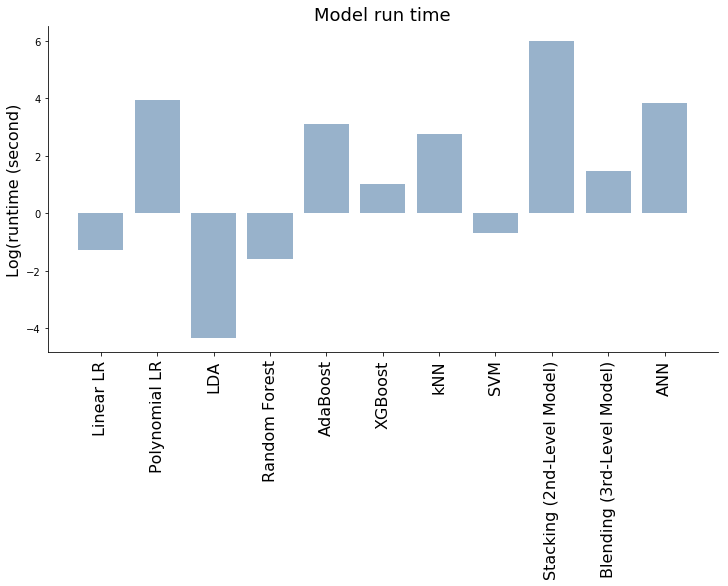

In [511]:
plt.figure(figsize=(12,6))
xx = range(len(df_var))
index_name=df_var.index
plt.bar(xx, np.log(df_var['training time(s)']),  alpha=0.5,color=(0.2, 0.4, 0.6, 0.6))
plt.title('Model run time', fontsize=18)
plt.ylabel('Log(runtime (second)', fontsize=16)
plt.xticks(xx,index_name,rotation=90,fontsize = 16);
sns.despine()

### Accuracy comparison


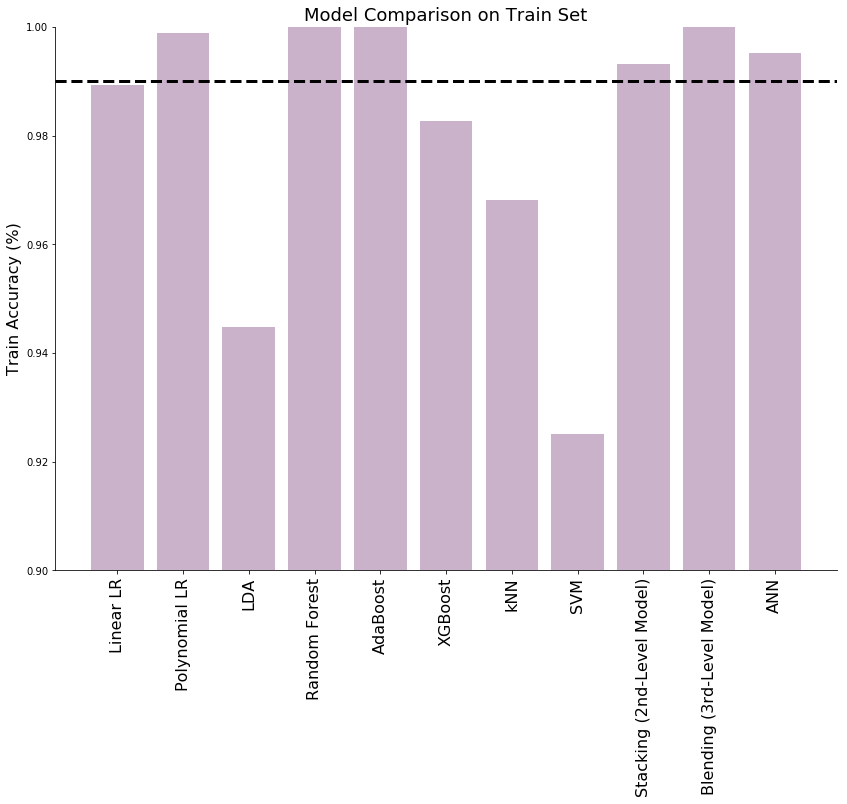

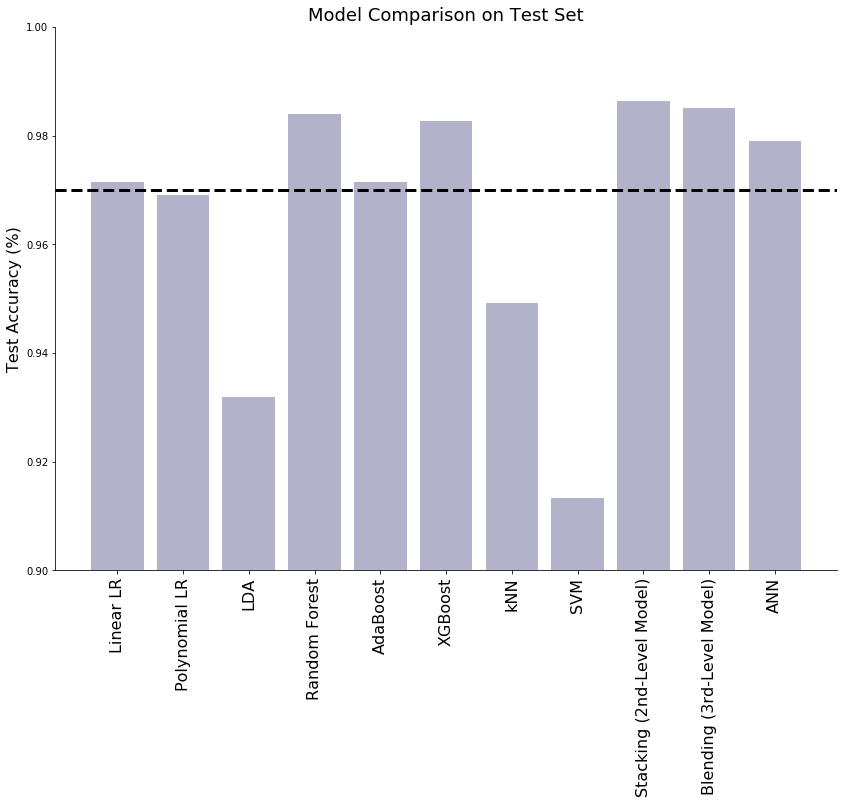

In [525]:
plt.figure(figsize=(14,10))
xx = range(len(df_var))
index_name=df_var.index
plt.bar(xx, df_var['train accuracy'], color=(0.6, 0.4, 0.6, 0.6), alpha=0.5)
plt.ylim(0.9,1)
plt.title('Model Comparison on Train Set', fontsize=18)
plt.ylabel('Train Accuracy (%)', fontsize=16)
plt.xticks(xx,index_name,rotation=90,fontsize = 16);
sns.despine()

plt.axhline(0.99, c='k', linewidth=3, linestyle='--');

plt.figure(figsize=(14,10))
xx = range(len(df_var))
index_name=df_var.index
plt.bar(xx, df_var['test accuracy'], color=(0.4, 0.4, 0.6, 0.6), alpha=0.5)
plt.ylim(0.9,1)
plt.title('Model Comparison on Test Set', fontsize=18)
plt.ylabel('Test Accuracy (%)', fontsize=16)
plt.xticks(xx,index_name,rotation=90,fontsize = 16);
plt.axhline(0.97, c='k', linewidth=3, linestyle='--');
sns.despine()

* In terms of the model runtime,  linear logistic regression (Linear LR), LDA , random forest and SVM take less than 1 second to run. Stacking is the slowest one, which takes 399 seconds to run. Actually, this is still not too bad for small dataset (1883 observations and  50 features) as in our case. If we need to run it for a huge dataset, we may need to consider the computational expense.


* In terms of the model accuracy, Polynomial logistic regression,  random fores, Adaboost, stacking, blending and ANN yield a training set accuray higher than 99%. The accuray score from the test set in random forest, Adaboost, XGBoost, stacking, blending and ANN are higher than 97%, which are really good.

* Overall, the advanced models with the NLP features perform really good. 

### Generating predictions for future usage

In [442]:
y_pre_df_NN_proba=y_pre_df_NN_proba.reshape(869,)

In [447]:
y_pre_df_NN_proba.shape
index = pre_df_scaled.index

In [448]:
index

Int64Index([ 876476261220179968,  909863671563739136,  951973545831223296,
             981943174947065856,          4735793156,  698968509091614720,
            1040722169574187010, 1019044289278443520,  821278120518946816,
            1003128394836578305,
            ...
                       40040033,            89265769,          2770095723,
                       21786220, 1044666765790334978,           559955566,
             870274473391398912,  930214719062908928,           594030193,
             850161357295112194],
           dtype='int64', name='User ID', length=869)

In [486]:
index = pre_df_scaled.index

pre_df_prediction_NLP = pd.DataFrame(np.column_stack([y_pre_df_logreg,y_pre_df_linearLogCVpoly,y_pre_df_rf,y_pre_df_adaboost,y_pre_df_xgboost,y_pred_df_best_k,y_pre_df_svm,pre_df_stacking,pre_df_blending,y_pre_df_NN,y_pre_df_logreg_proba,y_pre_df_linearLogCVpoly_proba,y_pre_df_rf_proba,y_pre_df_adaboost_proba,y_pre_df_xgboost_proba,y_pred_df_best_k_proba ,y_pre_dfsvm_proba,y_pre_df_NN_proba]), 
                               columns=[ 'Linear LR','Polynomial LR','Random Forest','AdaBoost','XGBoost','kNN','SVM','Stacking (2nd-Level Model)','Blending (3rd-Level Model)','ANN','Linear LR_prob','Polynomial LR_proba','Random Forest_proba','AdaBoost_proba','XGBoost_proba','kNN_proba','SVM_proba','ANN_proba'], index=index)
pre_df_prediction_NLP.to_csv('pre_df_prediction_NLP_2.csv')

In [490]:
pre_df_prediction_NLP.head()

,Linear LR,Polynomial LR,Random Forest,AdaBoost,XGBoost,kNN,SVM,Stacking (2nd-Level Model),Blending (3rd-Level Model),ANN,Linear LR_prob,Polynomial LR_proba,Random Forest_proba,AdaBoost_proba,XGBoost_proba,kNN_proba,SVM_proba,ANN_proba
User ID,,,,,,,,,,,,,,,,,,
876476261220179968,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,2.754798e-05,0.06,0.06,0.029001,0.00,0.023232,0.028690
909863671563739136,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,3.561330e-11,0.20,0.20,0.078705,0.00,0.019900,0.000459
951973545831223296,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,1.000000e+00,0.22,0.22,0.040030,0.25,0.010804,0.996794
981943174947065856,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,1.000000e+00,0.02,0.02,0.026049,0.00,0.230778,0.983321
4735793156,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,3.926822e-16,0.10,0.10,0.034885,0.00,0.020738,0.000020


 # Test and Evaluation

One of the most important part of machine learning analytics is to take a deeper dive into model evaluation and performance metrics, and potential prediction-related errors that one may encounter. In this section, we did the error analysis for all the models we used for bot detection and compared the results. 

Note that in this classification problem, we define bots as positive, human users as negative. 

## Error analysis

We calculated the confusion matrix for all the models and the result is shown in the table below. Based on those results, we did error analysis by comparing test accuracy, F score and AUC.

In [10]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np

### 1. Test accuracy

We calculated the training accuracy and test accuracy for 11 models we created and also timed the training process for each model. The results are shown in the dataframe below, sorted by training time.

In terms of training time, most of the models can be trained in a reasonable time, although polynomial logistic regression, stacking model and neural network seem to take extra long time . 

For the training accuracy, all the models have a very high training accuracy, some of them even reach 1.0.

In [5]:
df_timing = pd.read_csv('df_timing_acc.csv')
df_time = df_timing.sort_values(['training time(s)'], ascending = False)
df_timing = df_time.rename(index=str, columns={"Unnamed: 0": "Model"})
df_timing

,Model,training time(s),train accuracy,test accuracy
8,Stacking (2nd-Level Model),399.203999,0.993096,0.986386
1,Polynomial LR,50.692994,0.998938,0.969059
10,ANN,38.072873,0.994158,0.977723
4,AdaBoost,22.391462,1.000000,0.971535
6,kNN,15.479240,0.968136,0.949257
9,Blending (3rd-Level Model),4.316027,1.000000,0.985149
5,XGBoost,2.791808,0.982673,0.982673
7,SVM,0.493397,0.925119,0.913366
0,Linear LR,0.278980,0.989379,0.971535
3,Random Forest,0.201104,1.000000,0.983911


Below we plotted the test accuracy, where the dashed line represents 98% accuracy. We can see that random forest, stacking and blending model appeared to be the best in terms of test accuracy. Given the similar accuracy, random forest model takes much shorter time to train, while the stacking training process is extremely time-consuming.

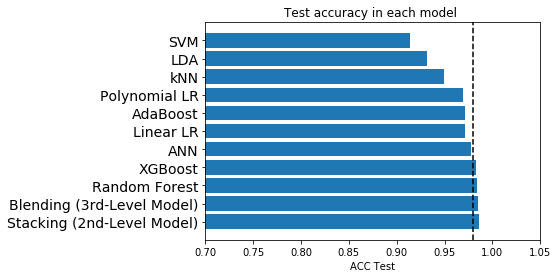

In [67]:
fig = plt.figure()
xx = np.arange(len(df_timing))
index_name=df_timing['Model']
plt.barh(xx, df_timing['test accuracy'])
plt.title('Test accuracy in each model ')
plt.xlabel('ACC Test')
plt.xlim((0.7,1.05))
plt.ylim((-1,11))
plt.vlines(0.98, -1, 11, linestyle = 'dashed')
plt.yticks(xx,index_name,fontsize = 14);

### 2. F score

The traditional F-measure or balanced F-score (F1 score) is the harmonic mean of precision and recall, where precision is positive predictive value and recall is true positive rate. F1 score reaches its best value at 1 (perfect precision and recall) and worst at 0.

In [95]:
test_pred_df = pd.read_csv('test_pred_df_for_ROC.csv')
from sklearn.metrics import f1_score
model_lst = df_timing['Model'].values
fscore_lst = []
for model in model_lst:
    fscore_lst.append(f1_score(test_pred_df['Actual'], test_pred_df[model]))

fscore_df = pd.DataFrame()
fscore_df['Model'] = model_lst
fscore_df['F score'] = fscore_lst
fscore_df = fscore_df.sort_values('F score', ascending = False)
fscore_df

,Model,F score
0,Stacking (2nd-Level Model),0.987709
1,Blending (3rd-Level Model),0.986667
2,Random Forest,0.985442
3,XGBoost,0.984410
4,ANN,0.980000
5,Linear LR,0.974642
6,AdaBoost,0.974070
7,Polynomial LR,0.972497
8,kNN,0.955580
9,LDA,0.940541


From the F score values, we can see that the three best models are stacking, blending and random forest.

### 3. AUC

We also plotted the ROC(Receiver Operating Characteristic) curve and calculated AUC(Area under ROC curve) of different models to compare. An ROC curve is a two-dimensional plot of sensitivity (true positive rate) vs specificity (false positive rate). The area under the curve is referred to as the AUC, and is a numeric metric used to represent the quality and performance of the classifier (model). An AUC of 0.5 is essentially the same as random guessing without a model, whereas an AUC of 1.0 is considered a perfect classifier. Generally, the higher the AUC value, the better. 

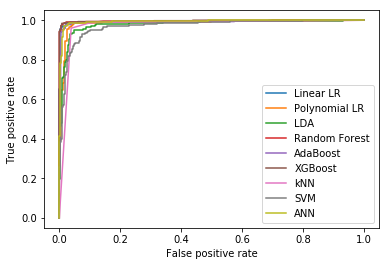

,Model,AUC
5,XGBoost,0.997405
3,Random Forest,0.996267
8,ANN,0.993682
0,Linear LR,0.993483
4,AdaBoost,0.991806
1,Polynomial LR,0.986012
2,LDA,0.979365
6,kNN,0.973546
7,SVM,0.969835


In [114]:
test_pred_df = pd.read_csv('test_pred_df_for_ROC.csv')

from sklearn import metrics
fpr_LLR, tpr_LLR, thresholds_LLR = metrics.roc_curve(test_pred_df['Actual'], test_pred_df['Linear LR_prob'])
auc_LLR = metrics.auc(fpr_LLR, tpr_LLR)

fpr_PLR, tpr_PLR, thresholds_PLR = metrics.roc_curve(test_pred_df['Actual'], test_pred_df['Polynomial LR_proba'])
auc_PLR = metrics.auc(fpr_PLR, tpr_PLR)

fpr_LDA, tpr_LDA, thresholds_LDA = metrics.roc_curve(test_pred_df['Actual'], test_pred_df['LDA_proba'])
auc_LDA = metrics.auc(fpr_LDA, tpr_LDA)

fpr_RF, tpr_RF, thresholds_RF = metrics.roc_curve(test_pred_df['Actual'], test_pred_df['Random Forest_proba'])
auc_RF = metrics.auc(fpr_RF, tpr_RF)
    
fpr_AdaBoost, tpr_AdaBoost, thresholds_AdaBoost = metrics.roc_curve(test_pred_df['Actual'], test_pred_df['AdaBoost_proba'])
auc_AdaBoost = metrics.auc(fpr_AdaBoost, tpr_AdaBoost)

fpr_XGBoost, tpr_XGBoost, thresholds_XGBoost = metrics.roc_curve(test_pred_df['Actual'], test_pred_df['XGBoost_proba'])
auc_XGBoost = metrics.auc(fpr_XGBoost, tpr_XGBoost)

fpr_kNN, tpr_kNN, thresholds_kNN = metrics.roc_curve(test_pred_df['Actual'], test_pred_df['kNN_proba'])
auc_kNN = metrics.auc(fpr_kNN, tpr_kNN)

fpr_SVM, tpr_SVM, thresholds_SVM = metrics.roc_curve(test_pred_df['Actual'], test_pred_df['SVM_proba'])
auc_SVM = metrics.auc(fpr_SVM, tpr_SVM)

#fpr_Stacking, tpr_Stacking, thresholds_Stacking = metrics.roc_curve(test_pred_df['Stacking (2nd-Level Model)'], test_pred_df['Stacking_proba'])
#auc_Stacking = metrics.auc(fpr_Stacking, tpr_Stacking)

#fpr_Blending, tpr_Blending, thresholds_Blending = metrics.roc_curve(test_pred_df['Blending'], test_pred_df['Blending_proba'])
#auc_Blending = metrics.auc(fpr_Blending, tpr_Blending)

fpr_ANN, tpr_ANN, thresholds_ANN = metrics.roc_curve(test_pred_df['Actual'], test_pred_df['ANN_proba'])
auc_ANN = metrics.auc(fpr_ANN, tpr_ANN)

plt.plot(fpr_LLR, tpr_LLR, label = 'Linear LR')
plt.plot(fpr_PLR, tpr_PLR, label = 'Polynomial LR')
plt.plot(fpr_LDA, tpr_LDA, label = 'LDA')
plt.plot(fpr_RF, tpr_RF, label = 'Random Forest')
plt.plot(fpr_AdaBoost, tpr_AdaBoost, label = 'AdaBoost')
plt.plot(fpr_XGBoost, tpr_XGBoost, label = 'XGBoost')
plt.plot(fpr_kNN, tpr_kNN, label = 'kNN')
plt.plot(fpr_SVM, tpr_SVM, label = 'SVM')
plt.plot(fpr_ANN, tpr_ANN, label = 'ANN')
plt.xlabel('False positive rate')
plt.ylabel('True positive rate')
plt.legend()
plt.show()

models_list = ['Linear LR', 'Polynomial LR', 'LDA', 'Random Forest', 'AdaBoost', 'XGBoost', 'kNN', 'SVM', 'ANN']
auc_lst = [auc_LLR, auc_PLR, auc_LDA, auc_RF, auc_AdaBoost, auc_XGBoost, auc_kNN, auc_SVM, auc_ANN]

auc_df = pd.DataFrame()
auc_df['Model'] = models_list
auc_df['AUC'] =auc_lst
auc_df = auc_df.sort_values('AUC', ascending = False)
auc_df

The table above showing AUC is ranked in descending order. From the ROC curve, except for some poorly performing models like SVM, kNN, LDA and Polynomial LR, those ROC curves for models with AUC higher than 0.99 overlapped with each other and are not distinguishable. The higher AUC, the better. In terms of AUC, XGBoost, random forest and ANN are the best. Note that we didn't include stacking and blending into this comparison, because we weren't able to calculate the prediction probability from those models.

## Evaluation

After training the model and getting a fairly good result on the test set, we tried to use the model to predict bots on the unknown data and compared our results with a well-developed twitter bot detection platform, Botometer. 

Botometer (formerly BotOrNot), developed by researchers in Indiana University, checks the activity of a Twitter account and gives it a score based on how likely the account is to be a bot[1]. Higher scores are more bot-like. Botometer extracted 1150 features as the input of the model, including user meta-data, friend, network, timing, content and sentiment. It was trained on Social Honeypot dataset as we did as well. So we decided to compare our models with Botometer and see how well they do.

The data was extracted from API search by using the keyword "Trump". We extracted 898 users and constructed the features for the model. 

### 1. Extracting the data

In [ ]:
import time
def get_tweets(query, count):

    # empty list to store parsed tweets
    tweets = []
    # call twitter api to fetch tweets
    q=str(query)
    
    for i in range(12):
        fetched_tweets = api.search(q, count = count)
        # parsing tweets one by one
    
        for tweet in fetched_tweets:

            # empty dictionary to store required params of a tweet
            parsed_tweet = {}
            tweets.append(tweet.user.id)
        
        # Set sleep time to make sure that we got some different users
        time.sleep(10)

    return tweets

tweets = get_tweets(query ="Trump", count = 100)
user_id_lst = list(set(tweets))
id_str_lst = [str(s) for s in user_id_lst]

# Please see Data Acquisition for API_scrap and create_df function definition
dfs_pred, fail_lst_pred = API_scrap(id_str_lst[0:1000], 10)
full_df_pred = create_df(dfs_pred, 'pred_dataframe')

### 2. Bots detection through Botometer

To check bots through Botometer, one needs to install Botometer by: pip install botometer. The API they used is served via Mashape Market. You must sign up for a free account in order to obtain a Mashape secret key to run Botometer. After setting up the base environment, Botometer can loop through the provided user_id list and return bot detection results.

In [ ]:
import botometer

mashape_key = "uIX3UUkrh7mshux9VLXhN1FcUYY0p1ZEJpCjsnCHKddXFfIzhf"
twitter_app_auth = {
    'consumer_key': 'pr0AH7Ot5sZmig4u3bA6j51ty',
    'consumer_secret': 'tNteF0tRlEjKJfkkWQaIv5myqT9oBqrIVOYPQJOMjBTJhn9SAF',
    'access_token': '934846563825930241-yO5rosUB4x8eFMO0J7IXV1UZM0RzbgL',
    'access_token_secret': 'CbqfvlRonXo2JiIyxqCqeZynwkslNcDPmGFQ9KBEh8Mch',
  }

bom = botometer.Botometer(wait_on_ratelimit=True,mashape_key=mashape_key,twitter_app_auth)

bot_df_final = pd.read_csv('bot_df_final.csv')
pred_lst = bot_df_final['User ID'][0:100]
total_result_lst = []
for user_id in pred_lst:
    result = bom.check_account(user_id)
    total_result_lst.append(result)

The returned result from Botometer is a dictionary of all kinds of scores that could be used to detect bots. We extracted all the information and put it in a more user-friendly data structure. We interpreted the result from Botometer by setting the threshold for bot score as 0.5, which is similar to their result in the paper[1], meaning that any user has a bot score higher than 0.5 would be identified as a bot.

In [11]:
df_botometer = pd.read_csv('botometer_result.csv')
df_botometer.head()

,User_id,User_name,cap_english,cap_universal,cat_content,cat_friend,cat_network,cat_sentiment,cat_temporal,cat_user,ds_content,ds_friend,ds_network,ds_sentiment,ds_temporal,ds_user,score_eng,score_uni
0,876476261220179968,CKassube,0.009922,0.012907,0.381523,0.209572,0.224270,0.655212,0.229194,0.175910,1.9,1.0,1.1,3.3,1.1,0.9,0.180767,0.194668
1,909863671563739136,lesabaker43,0.032183,0.060559,0.333488,0.452812,0.627139,0.698843,0.355949,0.110530,1.7,2.3,3.1,3.5,1.8,0.6,0.322306,0.413570
2,951973545831223296,justinChilds17,0.075832,0.104603,0.767062,0.552900,0.568829,0.624537,0.399625,0.700922,3.8,2.8,2.8,3.1,2.0,3.5,0.463592,0.515643
3,981943174947065856,onegracehill,0.018904,0.011448,0.288679,0.356398,0.403511,0.072140,0.301336,0.126666,1.4,1.8,2.0,0.4,1.5,0.6,0.252653,0.182079
4,4735793156,BrennyBatt,0.001828,0.005213,0.085698,0.178233,0.194174,0.059859,0.083889,0.054257,0.4,0.9,1.0,0.3,0.4,0.3,0.049184,0.111167


In [7]:
dff_botometer = df_botometer.loc[(df_botometer['score_eng'] > 0.5)&(df_botometer['score_uni'] > 0.5)]
print('Percentage of bots detected by Botometer:',len(dff_botometer)/len(df_botometer))
botometer = dff_botometer['User_id'].values

Percentage of bots detected by Botometer: 0.08351893095768374


### 3. Bots detection through our model

#### With user features only

Below is the comparison result of models using only user meta data features with Botometer. The percentages of bots detected through three models are around the same level, although the detected bots are not exactly the same. 

In Venn diagram below, we show the intersection between different groups of bots detected by different models. To further compare the models performance, we did some manual check on those bots sitting in different groups and found that:

1. The intersection of three models are definitely bots, either with crazily high tweeting frequency or full of retweets.
2. For those "bots" detected by only one model, some of them can also be verified as bots, but others are more like active human users.

Detailed manual check results can be found below.

In [44]:
user_models_df = pd.read_csv('bot_detection_df2.csv')
print('*****************User features only*****************')
print('Percentage of bots detected by Botometer:',len(dff_botometer)/len(df_botometer))
user_bot_rf = list(user_models_df.loc[user_models_df['Random Forest'] == 1]['User ID'].values)
print('Percentage of bots detected by random forest:',len(user_bot_rf)/len(user_models_df))
user_bot_stacking = list(user_models_df.loc[user_models_df['stacking'] == 1]['User ID'].values)
print('Percentage of bots detected by stacking:',len(user_bot_stacking)/len(user_models_df))

print('Random forest:', list(set(user_bot_rf).intersection(botometer)))
print('Stacking:', list(set(user_bot_stacking).intersection(botometer)))

*****************User features only*****************
Percentage of bots detected by Botometer: 0.08351893095768374
Percentage of bots detected by random forest: 0.04788418708240535
Percentage of bots detected by stacking: 0.07906458797327394
Random forest: [1060298184277323776, 801555575687495681, 918534858871377920, 1065496286101757952, 892394563243061250, 52985157, 1017816501951184898, 3792585192, 108985609, 766547376, 36175156, 4180352153]
Stacking: [726236936038440960, 1020642357539196928, 801555575687495681, 4918885219, 1060298184277323776, 1028366243601018881, 952224908351860738, 1067507183829622789, 3792585192, 108985609, 52985157, 834852928376733697, 994233749020659712, 1017816501951184898, 766547376, 36175156, 3648811994]


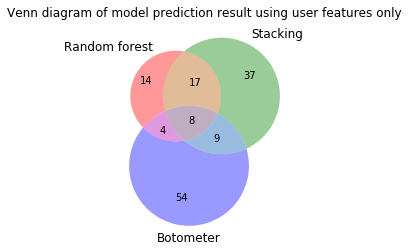

In [47]:
import matplotlib.pyplot as plt
from matplotlib_venn import venn3
set1 = set(user_bot_rf)
set2 = set(user_bot_stacking)
set3 = set(botometer)

venn3([set1, set2, set3], ('Random forest', 'Stacking', 'Botometer'))
plt.title('Venn diagram of model prediction result using user features only')
plt.show()

Below is the detailed result from manual check.

Intersection of the three:
   1. 1060298184277323776, Cal Washington, original tweets about random stuff, about 10 tweets per hour and tweets continuously through the day.
   2. 766547376, Ron *Thug* Hall, political bot (Obama supporter), most of the posts are retweets.
   3. 36175156, Jo4Trump {⭐️} (K) ⭐️⭐️⭐️, political bot(Trump supporter), most of the posts are retweets.
   4. 801555575687495681, ▶ Trump Daily News 📰, original tweets with high frequency.
   5. 52985157, ❌Janice nagao, political/religious bot, most of the posts are retweets.
   6. 108985609, Off Grid Capital, business/political bot, most of the posts are retweets.
   7. 3792585192, Countable Action, all original tweets with media in almost every tweet.
   8. 1017816501951184898, xiangfei000, original tweets with high frequency, mostly political news, tweet continuously through the day with a high frequency.
    
Detected only by random forest
   1. 2136431, Sandrine Plasseraud, CEO of We are social France, has a lot of retweets, but also have fair amount of interation with other users
   2. 1037558870, Sophie Rose, looks like a human user
   3. 794727833041969152, lonie koob, political bot, full of retweets against Trump.
    
Detected only by stacking
   1. 7577032, Jeremy Ricketts, looks like a human user
   2. 1447517750, Reject Trump Nazism 🔥🐈, political bot, full of retweets
   3. 923159798840832001, Michael T Biehunko, political bot, full of retweets
    
Detected only by Botometer
   1. 16585101, ouchinagirl, political bot, seems to be part of a botnet, only retweets
   2. 4784160126, Disco_Snoopy, bot, tweets every minute.
   3. 981849056380116992, lasandr61994924, very young twitter account, might be a bot, only retweets, default settings.



#### Combine NLP features and user features

Below is the comparison result of models using user features and NLP generated features with Botometer. The percentages of bots detected by our model are much lower than that of Botometer. 

In Venn diagram below, we show the intersection between different groups of bots detected by different models. To further compare the models performance, we did some manual check on those bots sitting in different groups and found that:

1. The intersection of three models is actually not a typical bot.
2. For those "bots" detected by only one model, same as before, some of them can also be verified as bots, but others are more like active human users.

Detailed manual check results can be found below.

In [46]:
models_df = pd.read_csv('pre_df_prediction_NLP_final.csv')

random_forest03 = []
for i in range(len(models_df)):
    if models_df['Random Forest_proba'][i] >= 0.3:
        random_forest03.append(1)
    else: random_forest03.append(0)

models_df['Random Forest03'] = random_forest03
print('*****************User features & NLP features*****************')
print('Percentage of bots detected by Botometer:',len(dff_botometer)/len(df_botometer))
#bot_rf = list(models_df.loc[models_df['Random Forest'] == 1]['User ID'].values)
bot_rf = list(models_df.loc[models_df['Random Forest03'] == 1]['User ID'].values)
print('Percentage of bots detected by random forest:',len(bot_rf)/len(models_df))
bot_stacking = list(models_df.loc[models_df['Stacking (2nd-Level Model)'] == 1]['User ID'].values)
print('Percentage of bots detected by stacking:',len(bot_stacking)/len(models_df))

print('Random forest:', list(set(bot_rf).intersection(botometer)))
print('Stacking:', list(set(bot_stacking).intersection(botometer)))

*****************User features & NLP features*****************
Percentage of bots detected by Botometer: 0.08351893095768374
Percentage of bots detected by random forest: 0.05753739930955121
Percentage of bots detected by stacking: 0.00805523590333717
Random forest: [981849056380116992, 1005429994682834944, 898297278074687488, 817807265633705984, 871379599472697344, 836057575296663552, 1070725412190224384, 892394563243061250, 945886293359198209, 108985609, 491838942]
Stacking: [981849056380116992]


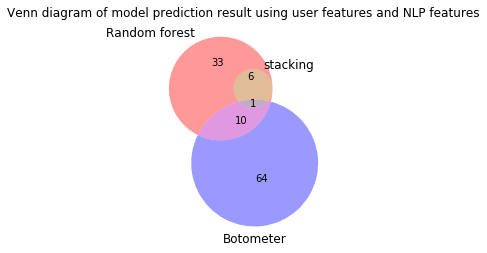

In [48]:
set1 = set(bot_rf)
set2 = set(bot_stacking)
set3 = set(botometer)

venn3([set1, set2, set3], ('Random forest', 'stacking', 'Botometer'))
plt.title('Venn diagram of model prediction result using user features and NLP features')
plt.show()

Below is the detailed result from manual check.

Intersection of the three:
   1. 981849056380116992, lasandr61994924, very young twitter account, might be a bot, only retweets, default settings.
    
Detected only by random forest
   1. 47872600, Gerlandinho, frequent retweets only, looks like a bot
   2. 766167322109284352, SavingTheWest, default settings, a lot of retweets, but the frequency is acceptable, also some original tweets.
   3. 1028343989005692929, sandyburrell8, looks like a bot, default settings, frequently continuous tweets and retweets.
    
Detected only by Botometer
   1. 16585101, ouchinagirl, political bot, seems to be part of a botnet, only retweets
   2. 4784160126, Disco_Snoopy, definitely a bot, tweets every minute.
   3. 978333132511436800, RobertElzey6, looks like a bot, very frequent retweets.




### 4. Conclusion

From the comparison above, none of the models can capture all the bots. Even for the complex model using more than 1000 features like Botometer, there is still some missing spots. But our random forest model and stacking model with user features seem to do a decent job at bot detection. Adding NLP related features did improve the training and test accuracy a lot, but there might be some overfitting problem, so the model predicts limited bots when applied to real world.

## Reference

[1] Varol, O., Ferrara, E., Davis, C. A., Menczer, F., & Flammini, A. (2017). Online human-bot interactions: Detection, estimation, and characterization. arXiv preprint arXiv:1703.03107.